# New York Taxi Demand Predicition Project
## Shahab Esfandiar_9819373

-------------------------------------------------------------------------------------------------

### *At first, we should import the required libraries such as Numpy, Pandas, Tensorflow, Matplotlib and so on.*

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import numpy as np
import math
import matplotlib.pyplot as plt
import os
import matplotlib.patches as mpatches
import tensorflow as tf
from tensorflow.python.keras import backend as K
import pandas as pd
import time
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split
import sklearn
from datetime import datetime as dt
from matplotlib import pyplot as plt
from sklearn.metrics import accuracy_score, cohen_kappa_score, jaccard_score
from tensorflow import keras
import random
from tensorflow.keras.utils import Sequence
from tqdm import tqdm
from datetime import datetime
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import gc
import keras_tuner as kt
import matplotlib.dates as mdates
from sklearn.preprocessing import MinMaxScaler
from matplotlib.ticker import MaxNLocator
import seaborn as sns
from pandas.tseries.holiday import USFederalHolidayCalendar
from PIL import Image
import numpy as np
import shap
import streamlit as st
import folium
from streamlit_folium import folium_static
from datetime import datetime, timedelta
from keras.wrappers.scikit_learn import KerasRegressor
from tensorflow.keras.layers import Flatten, Reshape
from keras.models import Model
from keras.layers import Input, Dense, LSTM, Conv1D, BatchNormalization, Dropout, Flatten, Multiply
from keras.layers import Activation, Permute, RepeatVector, Lambda
from keras import backend as K
import geopandas as gpd
from tensorflow.keras.utils import plot_model
from tensorflow.keras.models import load_model
from tensorflow.keras.layers import BatchNormalization
from tensorflow import keras
from tensorflow.keras.layers import Input, Conv1D, Dropout, BatchNormalization, LSTM, Dense, Multiply, Flatten, Reshape
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.metrics import RootMeanSquaredError, MeanSquaredLogarithmicError
from kerastuner import HyperModel
from kerastuner.tuners import RandomSearch
from tensorflow.keras import regularizers
from tensorflow.keras.regularizers import l2
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, TimeDistributed, RNN, SimpleRNNCell, Bidirectional, SimpleRNN, Attention, MultiHeadAttention
from tensorflow.keras.metrics import RootMeanSquaredError, MeanSquaredLogarithmicError
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, Callback
import squarify 
from IPython.display import Image

-------------------------------------------------------------------------------------------------

### *Then we will draw and display a flowchart of the steps to be performed in this project.*

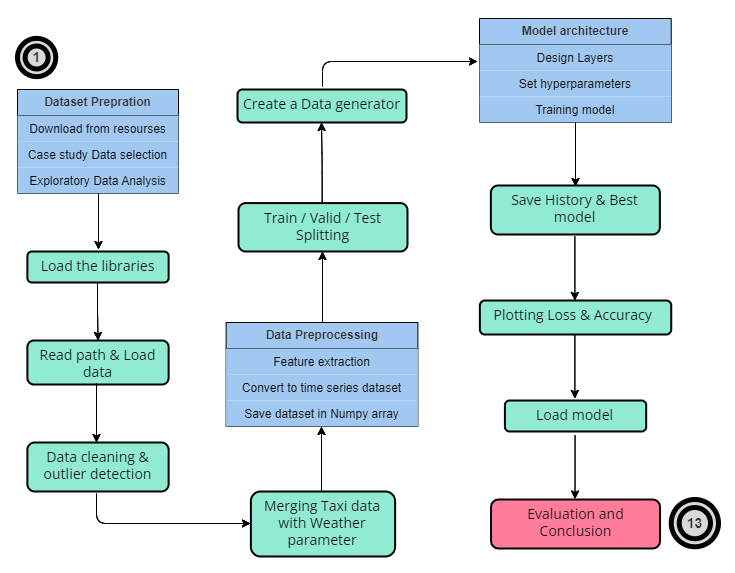

In [3]:
Image(filename = "D:/UNI/Term 9/Project/Data/Figs/Flowchart.png")

-------------------------------------------------------------------------------------------------

## <span style="color:green;">1. Data Prepration</span>

### *First, we import the CSV files of taxi data for the years 2020, 2021 and 2022. The available csv files have been obtained after processing parquet format data in AWS that downloaded from Tlc New York website. In this section, it is necessary to convert the pickup datetime column into time stamps so that they can be processed.*

In [4]:
dataframes = {}

# List of columns to be parsed as dates
date_columns = ['tpep_pickup_datetime']

# List of variable names corresponding to each year's data
variables = ['taxi2020', 'taxi2021', 'taxi2022']

file_names = [
    'D:/UNI/Term 9/Project/Data/2020_Yellow_Taxi_Trip_Data_20240520.csv',
    'D:/UNI/Term 9/Project/Data/2021_Yellow_Taxi_Trip_Data_20240520.csv',
    'D:/UNI/Term 9/Project/Data/2022_Yellow_Taxi_Trip_Data_20240520.csv'
]

# Loop through each file and corresponding variable name
for file_name, variable in zip(file_names, variables):
    print('\n')
    start_time = time.time()  # Record the start time of the process
    print(f'In Progress {file_name}...')
    
    # Calculate the total number of rows in the file
    total_rows = sum(1 for row in open(file_name, 'r', encoding='utf-8'))
    
    # Initialize a progress bar with the total number of rows
    with tqdm(total=total_rows, bar_format='{l_bar}{bar:50}{r_bar}{bar:-10b}', colour='green') as pbar:
        chunks = []
        
        # Read the CSV file in chunks
        for chunk in pd.read_csv(file_name, chunksize=10000, parse_dates=date_columns, low_memory=False):
            chunks.append(chunk)
            pbar.update(len(chunk))
            
    df = pd.concat(chunks, ignore_index=True)
    dataframes[variable] = df




In Progress D:/UNI/Term 9/Project/Data/2020_Yellow_Taxi_Trip_Data_20240520.csv...


100%|█████████████████████████████████████████████████▉| 24648499/24648500 [15:43<00:00, 26111.52it/s]                 




In Progress D:/UNI/Term 9/Project/Data/2021_Yellow_Taxi_Trip_Data_20240520.csv...


100%|█████████████████████████████████████████████████▉| 30904072/30904073 [20:33<00:00, 25047.59it/s]                 




In Progress D:/UNI/Term 9/Project/Data/2022_Yellow_Taxi_Trip_Data_20240520.csv...


100%|█████████████████████████████████████████████████▉| 27603233/27603234 [18:30<00:00, 24854.51it/s]                 


-------------------------------------------------------------------------------------------------

### *The data used for the project includes the years 2020 and 2021 and the first 6 months of 2022. So in total, we will have about 65 million records.*

In [5]:
taxi2020 = dataframes['taxi2020']
taxi2021 = dataframes['taxi2021']
taxi2022 = dataframes['taxi2022']

print('Year 2020 :', taxi2020.shape[0],'records')
print('Year 2021 :', taxi2021.shape[0],'records')
print('Year 2022 :', taxi2022.shape[0],'records')
print('----------------------------------')
print('Total     :', (taxi2020.shape[0] + taxi2021.shape[0] + taxi2022.shape[0]),'records')

Year 2020 : 24648499 records
Year 2021 : 30904072 records
Year 2022 : 27603233 records
----------------------------------
Total     : 83155804 records


-------------------------------------------------------------------------------------------------

## Features in the dataset :
<table border="1">
	<tr>
		<th>Field Name</th>
		<th>Description</th>
	</tr>
	<tr>
		<td>VendorID</td>
		<td>
		A code indicating the TPEP provider that provided the record.
		<ol>
			<li>Creative Mobile Technologies</li>
			<li>VeriFone Inc.</li>
		</ol>
		</td>
	</tr>
	<tr>
		<td>tpep_pickup_datetime</td>
		<td>The date and time when the meter was engaged.</td>
	</tr>
	<tr>
		<td>tpep_dropoff_datetime</td>
		<td>The date and time when the meter was disengaged.</td>
	</tr>
	<tr>
		<td>Passenger_count</td>
		<td>The number of passengers in the vehicle. This is a driver-entered value.</td>
	</tr>
	<tr>
		<td>Trip_distance</td>
		<td>The elapsed trip distance in miles reported by the taximeter.</td>
	</tr>
	<tr>
		<td>Pickup_ID</td>
		<td>TLC Taxi Zone in which the taximeter was engaged.</td>
	</tr>
	<tr>
		<td>RateCodeID</td>
		<td>The final rate code in effect at the end of the trip.
		<ol>
			<li> Standard rate </li>
			<li> JFK </li>
			<li> Newark </li>
			<li> Nassau or Westchester</li>
			<li> Negotiated fare </li>
			<li> Group ride</li>
		</ol>
		</td>
	</tr>
	<tr>
	<tr>
		<td>Dropoff_ID</td>
		<td>TLC Taxi Zone in which the taximeter was disengaged.</td>
	</tr>
	<tr>
		<td>Payment_type</td>
		<td>A numeric code signifying how the passenger paid for the trip.
		<ol>
			<li> Credit card </li>
			<li> Cash </li>
			<li> No charge </li>
			<li> Dispute</li>
			<li> Unknown </li>
			<li> Voided trip</li>
		</ol>
		</td>
	</tr>
	<tr>
		<td>Fare_amount</td>
		<td>The time-and-distance fare calculated by the meter.</td>
	</tr>
	<tr>
		<td>Extra</td>
		<td>Miscellaneous extras and surcharges. Currently, this only includes. the $0.50 and $1 rush hour and overnight charges.</td>
	</tr>
	<tr>
		<td>MTA_tax</td>
		<td>0.50 MTA tax that is automatically triggered based on the metered rate in use.</td>
	</tr>
	<tr>
		<td>Improvement_surcharge</td>
		<td>0.30 improvement surcharge assessed trips at the flag drop. the improvement surcharge began being levied in 2015.</td>
	</tr>
	<tr>
		<td>Tip_amount</td>
		<td>Tip amount – This field is automatically populated for credit card tips.Cash tips are not included.</td>
	</tr>
	<tr>
		<td>Tolls_amount</td>
		<td>Total amount of all tolls paid in trip.</td>
	</tr>
	<tr>
		<td>Total_amount</td>
		<td>The total amount charged to passengers. Does not include cash tips.</td>
	</tr>
</table>

-------------------------------------------------------------------------------------------------

### *For example, the data of 2020 is like this.*

In [6]:
taxi2020

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge
0,1.0,2020-01-01 00:28:15,01/01/2020 12:33:03 AM,1.0,1.20,1.0,N,238,239,1.0,6.00,3.0,0.5,1.47,0.00,0.3,11.27,2.5
1,1.0,2020-01-01 00:35:39,01/01/2020 12:43:04 AM,1.0,1.20,1.0,N,239,238,1.0,7.00,3.0,0.5,1.50,0.00,0.3,12.30,2.5
2,1.0,2020-01-01 00:47:41,01/01/2020 12:53:52 AM,1.0,0.60,1.0,N,238,238,1.0,6.00,3.0,0.5,1.00,0.00,0.3,10.80,2.5
3,1.0,2020-01-01 00:55:23,01/01/2020 01:00:14 AM,1.0,0.80,1.0,N,238,151,1.0,5.50,0.5,0.5,1.36,0.00,0.3,8.16,0.0
4,2.0,2020-01-01 00:01:58,01/01/2020 12:04:16 AM,1.0,0.00,1.0,N,193,193,2.0,3.50,0.5,0.5,0.00,0.00,0.3,4.80,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24648494,NaN,2020-12-31 23:44:35,01/01/2021 12:01:22 AM,NaN,9.22,NaN,NaN,143,20,NaN,32.49,0.0,0.5,8.16,0.00,0.3,43.95,2.5
24648495,NaN,2020-12-31 23:41:36,12/31/2020 11:50:32 PM,NaN,4.79,NaN,NaN,4,262,NaN,13.22,0.0,0.5,3.65,0.00,0.3,20.17,2.5
24648496,NaN,2020-12-31 23:01:17,12/31/2020 11:40:37 PM,NaN,28.00,NaN,NaN,210,78,NaN,69.31,0.0,0.5,2.75,6.12,0.3,78.98,0.0
24648497,NaN,2020-12-31 23:31:29,12/31/2020 11:44:22 PM,NaN,7.08,NaN,NaN,148,129,NaN,35.95,0.0,0.5,2.75,0.00,0.3,39.50,0.0


### *Now we need Data cleaning and perform the following processes.*

>*1. Removing outliers and null data*

>*2. Deleting data outside the spatial and temporal limits of the study area.*

>*3. Checking the wrong data based on research and information of the study area and removing them*

-------------------------------------------------------------------------------------------------

In [7]:
taxi2020.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24648499 entries, 0 to 24648498
Data columns (total 18 columns):
 #   Column                 Dtype         
---  ------                 -----         
 0   VendorID               float64       
 1   tpep_pickup_datetime   datetime64[ns]
 2   tpep_dropoff_datetime  object        
 3   passenger_count        float64       
 4   trip_distance          float64       
 5   RatecodeID             float64       
 6   store_and_fwd_flag     object        
 7   PULocationID           int64         
 8   DOLocationID           int64         
 9   payment_type           float64       
 10  fare_amount            float64       
 11  extra                  float64       
 12  mta_tax                float64       
 13  tip_amount             float64       
 14  tolls_amount           float64       
 15  improvement_surcharge  float64       
 16  total_amount           float64       
 17  congestion_surcharge   float64       
dtypes: datetime64[ns](1)

### *As we can see, the dataset has 18 columns and should be analyzed and processed based on the above mentioned items.*

-------------------------------------------------------------------------------------------------

### <span style="color:green;">1.1 Null values</span>

### *In the beginning, we should delete the null data for each year and then we will clean the features.*

In [8]:
nan_count2020 = taxi2020.isnull().any(axis=1).sum()
taxi2020.dropna(inplace = True)

In [9]:
nan_count2021 = taxi2021.isnull().any(axis=1).sum()
taxi2021.dropna(inplace = True)

In [10]:
nan_count2022 = taxi2022.isnull().any(axis=1).sum()
taxi2022.dropna(inplace = True)

In [11]:
print(f"Number of NaN in 2020 dataset : {nan_count2020}")
print(f"\nNumber of NaN in 2021 dataset : {nan_count2021}")
print(f"\nNumber of NaN in 2022 dataset : {nan_count2022}")

Number of NaN in 2020 dataset : 809568

Number of NaN in 2021 dataset : 1478695

Number of NaN in 2022 dataset : 870274


### *As we can see, almost 3.1 million records which included 4% of the dataset were deleted.*

-------------------------------------------------------------------------------------------------

### <span style="color:green;">1.2 Location ID</span>

### *Our study area is Manhattan. So, we need to remove data from New York that is outside this region.*

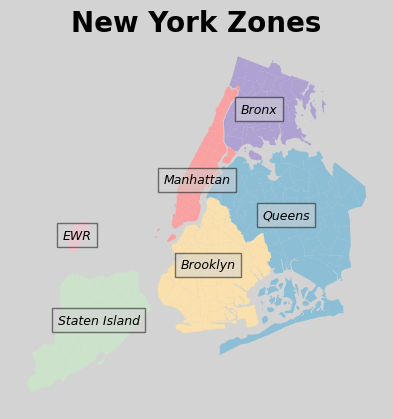

In [12]:
# Read the shapefile containing taxi zones
zone = gpd.read_file("D:/UNI/Term 9/Project/Data/Zone/taxi_zones.shp")

# Define a dictionary to map borough names to colors
color_dict = {
    'Manhattan': '#FAA0A0',
    'Bronx': '#B0A1D3',      
    'Queens': '#8CBED6',     
    'Staten Island': '#CCE2CB',  
    'Brooklyn': '#F9E0AC',  
    'EWR': '#FFC0CB'
}

# Create a figure and axis for plotting
fig, ax = plt.subplots(1, 1)
fig.patch.set_facecolor('lightgray')

# Plot the zones with colors based on the borough
zone.plot(ax=ax, color=[color_dict.get(name, 'gray') for name in zone['borough']])
plt.title('New York Zones', fontsize=20, color='black', weight='bold')
ax.set_xticks([])
ax.set_yticks([])
ax.set_frame_on(False)

# Annotate each borough with its name at the centroid of its region
for name, region in zone.groupby('borough'):
    if name in color_dict:
        region_centroid = region.geometry.centroid
        plt.text(x=region_centroid.x.mean(), y=region_centroid.y.mean(), s=name,
                 horizontalalignment='center', verticalalignment='center',
                 bbox=dict(facecolor='lightgrey', alpha=0.5, edgecolor='black'),
                 fontsize=9, style='italic')

# Save the plot as PNG and JPG files
plt.savefig('D:/UNI/Term 9/Project/Data/Figs/New York.png', dpi=300)
plt.savefig('D:/UNI/Term 9/Project/Data/Figs/New York.jpg', dpi=300)
plt.show()


-------------------------------------------------------------------------------------------------

### *Here we compare the number of taxi requests for these areas*

In [13]:
taxi_data = taxi2020.copy()
zoneID =  pd.read_csv("D:/UNI/Term 9/Project/Data/taxizone_lookup.csv")

zoneID

,LocationID,Borough,Zone,service_zone
0,1,EWR,Newark Airport,EWR
1,2,Queens,Jamaica Bay,Boro Zone
2,3,Bronx,Allerton/Pelham Gardens,Boro Zone
3,4,Manhattan,Alphabet City,Yellow Zone
4,5,Staten Island,Arden Heights,Boro Zone
...,...,...,...,...
260,261,Manhattan,World Trade Center,Yellow Zone
261,262,Manhattan,Yorkville East,Yellow Zone
262,263,Manhattan,Yorkville West,Yellow Zone
263,264,Unknown,NV,NaN


-------------------------------------------------------------------------------------------------

In [14]:
# Initialize a dictionary to count pickups for each borough
pickup_counts = {region: 0 for region in zoneID['Borough'].unique()}

# Loop through each location ID to count pickups
for location_id in zoneID['LocationID']:
    region_name = zoneID[zoneID['LocationID'] == location_id]['Borough'].iloc[0]
    pickup_counts[region_name] += taxi_data[taxi_data['PULocationID'] == location_id].shape[0]

# Sort the pickup counts in descending order
sorted_pickup_counts = dict(sorted(pickup_counts.items(), key=lambda item: item[1], reverse=True))
   

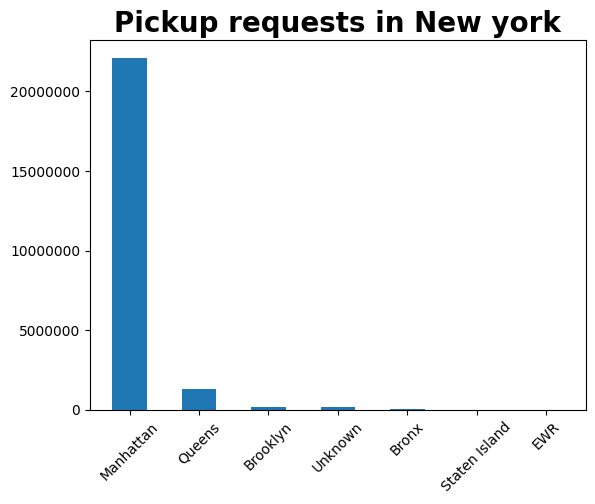

In [15]:
plt.bar(sorted_pickup_counts.keys(), sorted_pickup_counts.values(), width=0.5)
plt.title('Pickup requests in New york', fontsize=20, color='black', weight='bold')
plt.ticklabel_format(style='plain', axis='y')
plt.xticks(rotation=45)

plt.savefig('D:/UNI/Term 9/Project/Data/Figs/PUNY_req.png', dpi=300)
plt.savefig('D:/UNI/Term 9/Project/Data/Figs/PUNY_req.jpg', dpi=300)
plt.show()

-------------------------------------------------------------------------------------------------

### *According to the above chart, more than 90% of taxi requests are related to Manhattan.*

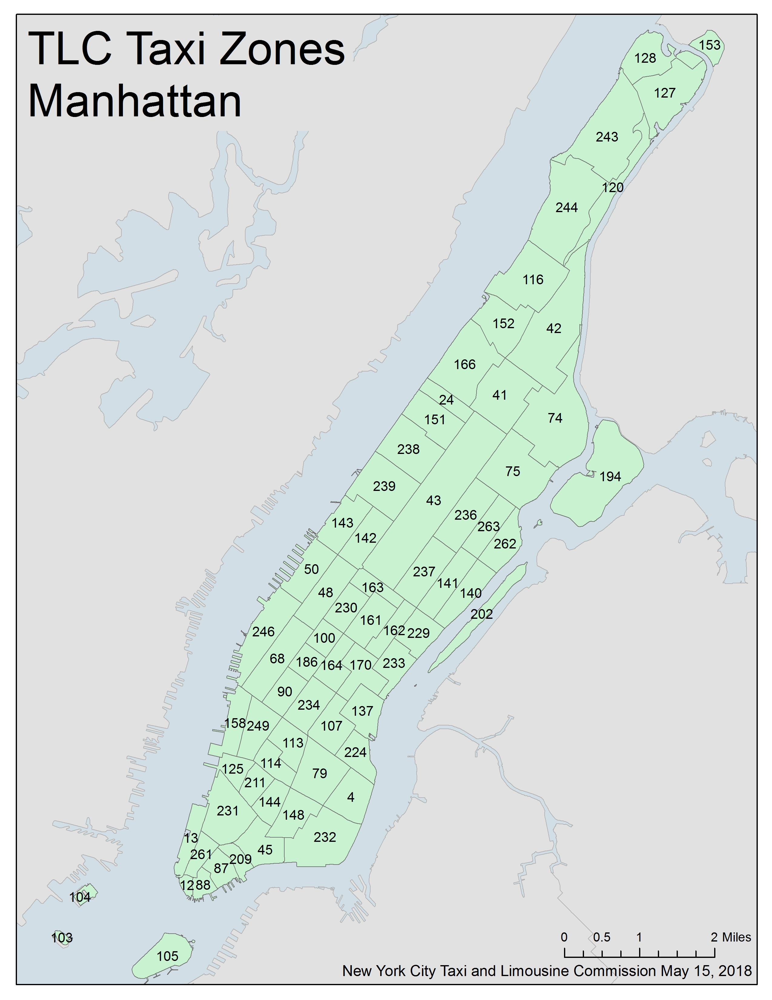

In [16]:
Image(filename = "C:/Users/ASUS/Downloads/taxi_zone_map_manhattan.jpg", width=500, height=500)

-------------------------------------------------------------------------------------------------

In [17]:
manhattanID = zoneID[zoneID['Borough'] == 'Manhattan']['LocationID'].tolist()

print('Number of Manhattan zones :', len(manhattanID))
print('\n', manhattanID)

Number of Manhattan zones : 69

 [4, 12, 13, 24, 41, 42, 43, 45, 48, 50, 68, 74, 75, 79, 87, 88, 90, 100, 103, 104, 105, 107, 113, 114, 116, 120, 125, 127, 128, 137, 140, 141, 142, 143, 144, 148, 151, 152, 153, 158, 161, 162, 163, 164, 166, 170, 186, 194, 202, 209, 211, 224, 229, 230, 231, 232, 233, 234, 236, 237, 238, 239, 243, 244, 246, 249, 261, 262, 263]


-------------------------------------------------------------------------------------------------

In [18]:
df_manhattan2020 = taxi2020[taxi2020['PULocationID'].isin(manhattanID)]

In [19]:
df_manhattan2021 = taxi2021[taxi2021['PULocationID'].isin(manhattanID)]

In [20]:
df_manhattan2022 = taxi2022[taxi2022['PULocationID'].isin(manhattanID)]
df_manhattan2022

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,airport_fee
0,1,2022-01-01 00:35:40,01/01/2022 12:53:29 AM,2.0,3.80,1.0,N,142.0,236.0,1.0,14.5,3.0,0.5,3.65,0.0,0.3,21.95,2.5,0.0
1,1,2022-01-01 00:33:43,01/01/2022 12:42:07 AM,1.0,2.10,1.0,N,236.0,42.0,1.0,8.0,0.5,0.5,4.00,0.0,0.3,13.30,0.0,0.0
2,2,2022-01-01 00:53:21,01/01/2022 01:02:19 AM,1.0,0.97,1.0,N,166.0,166.0,1.0,7.5,0.5,0.5,1.76,0.0,0.3,10.56,0.0,0.0
3,2,2022-01-01 00:25:21,01/01/2022 12:35:23 AM,1.0,1.09,1.0,N,114.0,68.0,2.0,8.0,0.5,0.5,0.00,0.0,0.3,11.80,2.5,0.0
4,2,2022-01-01 00:36:48,01/01/2022 01:14:20 AM,1.0,4.30,1.0,N,68.0,163.0,1.0,23.5,0.5,0.5,3.00,0.0,0.3,30.30,2.5,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27603222,2,2022-09-14 21:18:55,09/14/2022 09:21:56 PM,1.0,0.55,1.0,N,166.0,151.0,2.0,4.0,0.5,0.5,0.00,0.0,0.3,5.30,0.0,0.0
27603223,2,2022-09-14 21:32:10,09/14/2022 09:43:10 PM,1.0,1.96,1.0,N,239.0,263.0,1.0,9.5,0.5,0.5,2.66,0.0,0.3,15.96,2.5,0.0
27603224,2,2022-09-14 21:47:44,09/14/2022 09:59:52 PM,1.0,2.45,1.0,N,263.0,137.0,1.0,10.5,0.5,0.5,1.50,0.0,0.3,15.80,2.5,0.0
27603225,2,2022-09-14 21:06:13,09/14/2022 09:27:00 PM,1.0,7.20,1.0,N,161.0,13.0,1.0,23.0,0.5,0.5,5.36,0.0,0.3,32.16,2.5,0.0


-------------------------------------------------------------------------------------------------

### *To check the correctness of our process, we xan review the number of locations and records in each year.*

In [21]:
print('\nBefore ----> New york Location IDs  :', taxi2020['PULocationID'].nunique())
print('\nAfter  ----> Manhattan Location IDs :',df_manhattan2020['PULocationID'].nunique())
print('\nNumber of records in 2020 :', df_manhattan2020.shape[0])
print('--------------------------------------------------------------')

print('\nBefore ----> New york Location IDs  :', taxi2021['PULocationID'].nunique())
print('\nAfter  ----> Manhattan Location IDs :',df_manhattan2021['PULocationID'].nunique())
print('\nNumber of records in 2021 :', df_manhattan2021.shape[0])
print('--------------------------------------------------------------')

print('\nBefore ----> New york Location IDs  :', taxi2022['PULocationID'].nunique())
print('\nAfter  ----> Manhattan Location IDs :',df_manhattan2022['PULocationID'].nunique())
print('\nNumber of records in 2022 :', df_manhattan2022.shape[0])
print('--------------------------------------------------------------')

print('\nTotal records of New york  :',(taxi2020.shape[0] + taxi2021.shape[0] + taxi2022.shape[0])) 
print('\nTotal records of Manhattan :',(df_manhattan2020.shape[0] + df_manhattan2021.shape[0] + df_manhattan2022.shape[0])) 


Before ----> New york Location IDs  : 262

After  ----> Manhattan Location IDs : 67

Number of records in 2020 : 22102894
--------------------------------------------------------------

Before ----> New york Location IDs  : 263

After  ----> Manhattan Location IDs : 67

Number of records in 2021 : 26986903
--------------------------------------------------------------

Before ----> New york Location IDs  : 262

After  ----> Manhattan Location IDs : 67

Number of records in 2022 : 23883392
--------------------------------------------------------------

Total records of New york  : 79997267

Total records of Manhattan : 72973189


### *As we can see, almost 7 million records which included 8.5% of the dataset were deleted.*

-------------------------------------------------------------------------------------------------

In [22]:
del taxi2020
del taxi2021
del taxi2022
del dataframes
del taxi_data
del zoneID

gc.collect()

3367

-------------------------------------------------------------------------------------------------

### <span style="color:green;">1.3 Trip Distance</span>

### *Using the Google map, we made several navigations between different parts of Manhattan at different time intervals during the day and measured the navigation distance and the time it took to get from the origin to the destination.*

### *The maximum measured distance was 25 miles. Therefore, we consider the maximum length of the expected journey to be 25 miles and the minimum length is 0.5 miles. So we exclude the journeys whose length is out of these values.*

In [23]:
df_manhattan2020_trip = df_manhattan2020[(df_manhattan2020['trip_distance'] >= 0.5) & (df_manhattan2020['trip_distance'] <= 25)]
df_manhattan2020_trip

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge
0,1.0,2020-01-01 00:28:15,01/01/2020 12:33:03 AM,1.0,1.20,1.0,N,238,239,1.0,6.0,3.0,0.5,1.47,0.0,0.3,11.27,2.5
1,1.0,2020-01-01 00:35:39,01/01/2020 12:43:04 AM,1.0,1.20,1.0,N,239,238,1.0,7.0,3.0,0.5,1.50,0.0,0.3,12.30,2.5
2,1.0,2020-01-01 00:47:41,01/01/2020 12:53:52 AM,1.0,0.60,1.0,N,238,238,1.0,6.0,3.0,0.5,1.00,0.0,0.3,10.80,2.5
3,1.0,2020-01-01 00:55:23,01/01/2020 01:00:14 AM,1.0,0.80,1.0,N,238,151,1.0,5.5,0.5,0.5,1.36,0.0,0.3,8.16,0.0
9,1.0,2020-01-01 00:29:01,01/01/2020 12:40:28 AM,2.0,0.70,1.0,N,246,48,1.0,8.0,3.0,0.5,2.35,0.0,0.3,14.15,2.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24549234,2.0,2020-12-31 23:05:33,12/31/2020 11:31:36 PM,1.0,11.30,1.0,N,107,242,2.0,33.0,0.5,0.5,0.00,0.0,0.3,36.80,2.5
24549235,2.0,2020-12-31 22:57:20,12/31/2020 11:05:33 PM,1.0,2.18,1.0,N,236,161,1.0,9.0,0.5,0.5,2.56,0.0,0.3,15.36,2.5
24549236,2.0,2020-12-31 23:40:35,12/31/2020 11:48:43 PM,1.0,2.52,1.0,N,236,24,1.0,9.5,0.5,0.5,4.00,0.0,0.3,17.30,2.5
24549237,2.0,2020-12-31 23:54:57,12/31/2020 11:57:39 PM,1.0,0.59,1.0,N,238,239,1.0,4.5,0.5,0.5,2.08,0.0,0.3,10.38,2.5


In [24]:
df_manhattan2021_trip = df_manhattan2021[(df_manhattan2021['trip_distance'] >= 0.5) & (df_manhattan2021['trip_distance'] <= 25)]
df_manhattan2021_trip

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge
0,1.0,2021-01-01 00:30:10,01/01/2021 12:36:12 AM,1.0,2.10,1.0,N,142,43,2.0,8.0,3.0,0.5,0.00,0.0,0.3,11.80,2.5
4,2.0,2021-01-01 00:31:49,01/01/2021 12:48:21 AM,1.0,4.94,1.0,N,68,33,1.0,16.5,0.5,0.5,4.06,0.0,0.3,24.36,2.5
5,1.0,2021-01-01 00:16:29,01/01/2021 12:24:30 AM,1.0,1.60,1.0,N,224,68,1.0,8.0,3.0,0.5,2.35,0.0,0.3,14.15,2.5
7,1.0,2021-01-01 00:12:29,01/01/2021 12:30:34 AM,1.0,5.70,1.0,N,90,40,2.0,18.0,3.0,0.5,0.00,0.0,0.3,21.80,2.5
9,1.0,2021-01-01 00:26:12,01/01/2021 12:39:46 AM,2.0,2.70,1.0,N,263,142,1.0,12.0,3.0,0.5,3.15,0.0,0.3,18.95,2.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30801695,2.0,2021-12-31 23:11:13,12/31/2021 11:13:49 PM,2.0,0.61,1.0,N,113,234,1.0,4.0,0.5,0.5,1.56,0.0,0.3,9.36,2.5
30801696,2.0,2021-12-31 23:27:31,12/31/2021 11:32:32 PM,2.0,0.95,1.0,N,164,137,1.0,5.5,0.5,0.5,1.70,0.0,0.3,11.00,2.5
30801698,2.0,2021-12-31 23:07:23,12/31/2021 11:12:45 PM,2.0,1.05,1.0,N,237,229,1.0,6.0,0.5,0.5,2.45,0.0,0.3,12.25,2.5
30801699,2.0,2021-12-31 23:18:30,12/31/2021 11:31:20 PM,1.0,2.31,1.0,N,141,239,1.0,11.0,0.5,0.5,1.00,0.0,0.3,15.80,2.5


In [25]:
df_manhattan2022_trip = df_manhattan2022[(df_manhattan2022['trip_distance'] >= 0.5) & (df_manhattan2022['trip_distance'] <= 25)]
df_manhattan2022_trip

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,airport_fee
0,1,2022-01-01 00:35:40,01/01/2022 12:53:29 AM,2.0,3.80,1.0,N,142.0,236.0,1.0,14.5,3.0,0.5,3.65,0.0,0.3,21.95,2.5,0.0
1,1,2022-01-01 00:33:43,01/01/2022 12:42:07 AM,1.0,2.10,1.0,N,236.0,42.0,1.0,8.0,0.5,0.5,4.00,0.0,0.3,13.30,0.0,0.0
2,2,2022-01-01 00:53:21,01/01/2022 01:02:19 AM,1.0,0.97,1.0,N,166.0,166.0,1.0,7.5,0.5,0.5,1.76,0.0,0.3,10.56,0.0,0.0
3,2,2022-01-01 00:25:21,01/01/2022 12:35:23 AM,1.0,1.09,1.0,N,114.0,68.0,2.0,8.0,0.5,0.5,0.00,0.0,0.3,11.80,2.5,0.0
4,2,2022-01-01 00:36:48,01/01/2022 01:14:20 AM,1.0,4.30,1.0,N,68.0,163.0,1.0,23.5,0.5,0.5,3.00,0.0,0.3,30.30,2.5,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27603222,2,2022-09-14 21:18:55,09/14/2022 09:21:56 PM,1.0,0.55,1.0,N,166.0,151.0,2.0,4.0,0.5,0.5,0.00,0.0,0.3,5.30,0.0,0.0
27603223,2,2022-09-14 21:32:10,09/14/2022 09:43:10 PM,1.0,1.96,1.0,N,239.0,263.0,1.0,9.5,0.5,0.5,2.66,0.0,0.3,15.96,2.5,0.0
27603224,2,2022-09-14 21:47:44,09/14/2022 09:59:52 PM,1.0,2.45,1.0,N,263.0,137.0,1.0,10.5,0.5,0.5,1.50,0.0,0.3,15.80,2.5,0.0
27603225,2,2022-09-14 21:06:13,09/14/2022 09:27:00 PM,1.0,7.20,1.0,N,161.0,13.0,1.0,23.0,0.5,0.5,5.36,0.0,0.3,32.16,2.5,0.0


In [26]:
print('The Diffrence in year 2020 :', df_manhattan2020.shape[0] - df_manhattan2020_trip.shape[0])
print('\nThe Diffrence in year 2021 :', df_manhattan2021.shape[0] - df_manhattan2021_trip.shape[0])
print('\nThe Diffrence in year 2022 :', df_manhattan2022.shape[0] - df_manhattan2022_trip.shape[0])
print('--------------------------------------------------------------')
print('\nTotal records before trip analysis  :', (df_manhattan2020.shape[0] + df_manhattan2021.shape[0] + df_manhattan2022.shape[0])) 
print('\nTotal records after trip analysis   :', (df_manhattan2020_trip.shape[0] + df_manhattan2021_trip.shape[0] + df_manhattan2022_trip.shape[0])) 

The Diffrence in year 2020 : 1192994

The Diffrence in year 2021 : 1189157

The Diffrence in year 2022 : 974376
--------------------------------------------------------------

Total records before trip analysis  : 72973189

Total records after trip analysis   : 69616662


### *As we can see, almost 3.5 million records of the dataset were deleted.*

-------------------------------------------------------------------------------------------------

In [27]:
del df_manhattan2020
del df_manhattan2021
del df_manhattan2022

gc.collect()

0

-------------------------------------------------------------------------------------------------

### <span style="color:green;">1.4 Passenger count</span>

### *According to the capacity of cars that are used as yellow taxis in New York, a maximum of 5 passengers can ride in it. As a result, we delete the rows that have more than 5 and less than 1 passengers from our dataset.*

In [28]:
df_manhattan2020_pass = df_manhattan2020_trip[(df_manhattan2020_trip['passenger_count'] >= 1) & (df_manhattan2020_trip['passenger_count'] <= 5)]
df_manhattan2020_pass

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge
0,1.0,2020-01-01 00:28:15,01/01/2020 12:33:03 AM,1.0,1.20,1.0,N,238,239,1.0,6.0,3.0,0.5,1.47,0.0,0.3,11.27,2.5
1,1.0,2020-01-01 00:35:39,01/01/2020 12:43:04 AM,1.0,1.20,1.0,N,239,238,1.0,7.0,3.0,0.5,1.50,0.0,0.3,12.30,2.5
2,1.0,2020-01-01 00:47:41,01/01/2020 12:53:52 AM,1.0,0.60,1.0,N,238,238,1.0,6.0,3.0,0.5,1.00,0.0,0.3,10.80,2.5
3,1.0,2020-01-01 00:55:23,01/01/2020 01:00:14 AM,1.0,0.80,1.0,N,238,151,1.0,5.5,0.5,0.5,1.36,0.0,0.3,8.16,0.0
9,1.0,2020-01-01 00:29:01,01/01/2020 12:40:28 AM,2.0,0.70,1.0,N,246,48,1.0,8.0,3.0,0.5,2.35,0.0,0.3,14.15,2.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24549234,2.0,2020-12-31 23:05:33,12/31/2020 11:31:36 PM,1.0,11.30,1.0,N,107,242,2.0,33.0,0.5,0.5,0.00,0.0,0.3,36.80,2.5
24549235,2.0,2020-12-31 22:57:20,12/31/2020 11:05:33 PM,1.0,2.18,1.0,N,236,161,1.0,9.0,0.5,0.5,2.56,0.0,0.3,15.36,2.5
24549236,2.0,2020-12-31 23:40:35,12/31/2020 11:48:43 PM,1.0,2.52,1.0,N,236,24,1.0,9.5,0.5,0.5,4.00,0.0,0.3,17.30,2.5
24549237,2.0,2020-12-31 23:54:57,12/31/2020 11:57:39 PM,1.0,0.59,1.0,N,238,239,1.0,4.5,0.5,0.5,2.08,0.0,0.3,10.38,2.5


In [29]:
df_manhattan2021_pass = df_manhattan2021_trip[(df_manhattan2021_trip['passenger_count'] >= 1) & (df_manhattan2021_trip['passenger_count'] <= 5)]
df_manhattan2021_pass

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge
0,1.0,2021-01-01 00:30:10,01/01/2021 12:36:12 AM,1.0,2.10,1.0,N,142,43,2.0,8.0,3.0,0.5,0.00,0.0,0.3,11.80,2.5
4,2.0,2021-01-01 00:31:49,01/01/2021 12:48:21 AM,1.0,4.94,1.0,N,68,33,1.0,16.5,0.5,0.5,4.06,0.0,0.3,24.36,2.5
5,1.0,2021-01-01 00:16:29,01/01/2021 12:24:30 AM,1.0,1.60,1.0,N,224,68,1.0,8.0,3.0,0.5,2.35,0.0,0.3,14.15,2.5
7,1.0,2021-01-01 00:12:29,01/01/2021 12:30:34 AM,1.0,5.70,1.0,N,90,40,2.0,18.0,3.0,0.5,0.00,0.0,0.3,21.80,2.5
9,1.0,2021-01-01 00:26:12,01/01/2021 12:39:46 AM,2.0,2.70,1.0,N,263,142,1.0,12.0,3.0,0.5,3.15,0.0,0.3,18.95,2.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30801695,2.0,2021-12-31 23:11:13,12/31/2021 11:13:49 PM,2.0,0.61,1.0,N,113,234,1.0,4.0,0.5,0.5,1.56,0.0,0.3,9.36,2.5
30801696,2.0,2021-12-31 23:27:31,12/31/2021 11:32:32 PM,2.0,0.95,1.0,N,164,137,1.0,5.5,0.5,0.5,1.70,0.0,0.3,11.00,2.5
30801698,2.0,2021-12-31 23:07:23,12/31/2021 11:12:45 PM,2.0,1.05,1.0,N,237,229,1.0,6.0,0.5,0.5,2.45,0.0,0.3,12.25,2.5
30801699,2.0,2021-12-31 23:18:30,12/31/2021 11:31:20 PM,1.0,2.31,1.0,N,141,239,1.0,11.0,0.5,0.5,1.00,0.0,0.3,15.80,2.5


In [30]:
df_manhattan2022_pass = df_manhattan2022_trip[(df_manhattan2022_trip['passenger_count'] >= 1) & (df_manhattan2022_trip['passenger_count'] <= 5)]
df_manhattan2022_pass

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,airport_fee
0,1,2022-01-01 00:35:40,01/01/2022 12:53:29 AM,2.0,3.80,1.0,N,142.0,236.0,1.0,14.5,3.0,0.5,3.65,0.0,0.3,21.95,2.5,0.0
1,1,2022-01-01 00:33:43,01/01/2022 12:42:07 AM,1.0,2.10,1.0,N,236.0,42.0,1.0,8.0,0.5,0.5,4.00,0.0,0.3,13.30,0.0,0.0
2,2,2022-01-01 00:53:21,01/01/2022 01:02:19 AM,1.0,0.97,1.0,N,166.0,166.0,1.0,7.5,0.5,0.5,1.76,0.0,0.3,10.56,0.0,0.0
3,2,2022-01-01 00:25:21,01/01/2022 12:35:23 AM,1.0,1.09,1.0,N,114.0,68.0,2.0,8.0,0.5,0.5,0.00,0.0,0.3,11.80,2.5,0.0
4,2,2022-01-01 00:36:48,01/01/2022 01:14:20 AM,1.0,4.30,1.0,N,68.0,163.0,1.0,23.5,0.5,0.5,3.00,0.0,0.3,30.30,2.5,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27603222,2,2022-09-14 21:18:55,09/14/2022 09:21:56 PM,1.0,0.55,1.0,N,166.0,151.0,2.0,4.0,0.5,0.5,0.00,0.0,0.3,5.30,0.0,0.0
27603223,2,2022-09-14 21:32:10,09/14/2022 09:43:10 PM,1.0,1.96,1.0,N,239.0,263.0,1.0,9.5,0.5,0.5,2.66,0.0,0.3,15.96,2.5,0.0
27603224,2,2022-09-14 21:47:44,09/14/2022 09:59:52 PM,1.0,2.45,1.0,N,263.0,137.0,1.0,10.5,0.5,0.5,1.50,0.0,0.3,15.80,2.5,0.0
27603225,2,2022-09-14 21:06:13,09/14/2022 09:27:00 PM,1.0,7.20,1.0,N,161.0,13.0,1.0,23.0,0.5,0.5,5.36,0.0,0.3,32.16,2.5,0.0


In [31]:
print('The Diffrence in year 2020 :', df_manhattan2020_trip.shape[0] - df_manhattan2020_pass.shape[0])
print('\nThe Diffrence in year 2021 :', df_manhattan2021_trip.shape[0] - df_manhattan2021_pass.shape[0])
print('\nThe Diffrence in year 2022 :', df_manhattan2022_trip.shape[0] - df_manhattan2022_pass.shape[0])
print('--------------------------------------------------------------')
print('\nTotal records before passenger analysis  :', (df_manhattan2020_trip.shape[0] + df_manhattan2021_trip.shape[0] + df_manhattan2022_trip.shape[0])) 
print('\nTotal records after passenger analysis   :', (df_manhattan2020_pass.shape[0] + df_manhattan2021_pass.shape[0] + df_manhattan2022_pass.shape[0])) 

The Diffrence in year 2020 : 848867

The Diffrence in year 2021 : 997402

The Diffrence in year 2022 : 774166
--------------------------------------------------------------

Total records before passenger analysis  : 69616662

Total records after passenger analysis   : 66996227


### *As we can see, almost 2.7 million records of the dataset were deleted.*

-------------------------------------------------------------------------------------------------

In [32]:
del df_manhattan2020_trip
del df_manhattan2021_trip
del df_manhattan2022_trip

gc.collect()

0

-------------------------------------------------------------------------------------------------

### <span style="color:green;">1.5 Fare amount</span>

### *According to Google research, the minimum taxi fare in Manhattan, New York in 2020-2022 starts from 2.50 to 3 Dollars. For the maximum fare, based on more information such as the length of the trip and time stuck in traffic, this amount can reach up to $59.*

In [33]:
df_manhattan2020_fare = df_manhattan2020_pass[(df_manhattan2020_pass['fare_amount'] >= 3) & (df_manhattan2020_pass['fare_amount'] <= 59)]
df_manhattan2020_fare

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge
0,1.0,2020-01-01 00:28:15,01/01/2020 12:33:03 AM,1.0,1.20,1.0,N,238,239,1.0,6.0,3.0,0.5,1.47,0.0,0.3,11.27,2.5
1,1.0,2020-01-01 00:35:39,01/01/2020 12:43:04 AM,1.0,1.20,1.0,N,239,238,1.0,7.0,3.0,0.5,1.50,0.0,0.3,12.30,2.5
2,1.0,2020-01-01 00:47:41,01/01/2020 12:53:52 AM,1.0,0.60,1.0,N,238,238,1.0,6.0,3.0,0.5,1.00,0.0,0.3,10.80,2.5
3,1.0,2020-01-01 00:55:23,01/01/2020 01:00:14 AM,1.0,0.80,1.0,N,238,151,1.0,5.5,0.5,0.5,1.36,0.0,0.3,8.16,0.0
9,1.0,2020-01-01 00:29:01,01/01/2020 12:40:28 AM,2.0,0.70,1.0,N,246,48,1.0,8.0,3.0,0.5,2.35,0.0,0.3,14.15,2.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24549234,2.0,2020-12-31 23:05:33,12/31/2020 11:31:36 PM,1.0,11.30,1.0,N,107,242,2.0,33.0,0.5,0.5,0.00,0.0,0.3,36.80,2.5
24549235,2.0,2020-12-31 22:57:20,12/31/2020 11:05:33 PM,1.0,2.18,1.0,N,236,161,1.0,9.0,0.5,0.5,2.56,0.0,0.3,15.36,2.5
24549236,2.0,2020-12-31 23:40:35,12/31/2020 11:48:43 PM,1.0,2.52,1.0,N,236,24,1.0,9.5,0.5,0.5,4.00,0.0,0.3,17.30,2.5
24549237,2.0,2020-12-31 23:54:57,12/31/2020 11:57:39 PM,1.0,0.59,1.0,N,238,239,1.0,4.5,0.5,0.5,2.08,0.0,0.3,10.38,2.5


In [34]:
df_manhattan2021_fare = df_manhattan2021_pass[(df_manhattan2021_pass['fare_amount'] >= 3) & (df_manhattan2021_pass['fare_amount'] <= 59)]
df_manhattan2021_fare

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge
0,1.0,2021-01-01 00:30:10,01/01/2021 12:36:12 AM,1.0,2.10,1.0,N,142,43,2.0,8.0,3.0,0.5,0.00,0.0,0.3,11.80,2.5
4,2.0,2021-01-01 00:31:49,01/01/2021 12:48:21 AM,1.0,4.94,1.0,N,68,33,1.0,16.5,0.5,0.5,4.06,0.0,0.3,24.36,2.5
5,1.0,2021-01-01 00:16:29,01/01/2021 12:24:30 AM,1.0,1.60,1.0,N,224,68,1.0,8.0,3.0,0.5,2.35,0.0,0.3,14.15,2.5
7,1.0,2021-01-01 00:12:29,01/01/2021 12:30:34 AM,1.0,5.70,1.0,N,90,40,2.0,18.0,3.0,0.5,0.00,0.0,0.3,21.80,2.5
9,1.0,2021-01-01 00:26:12,01/01/2021 12:39:46 AM,2.0,2.70,1.0,N,263,142,1.0,12.0,3.0,0.5,3.15,0.0,0.3,18.95,2.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30801695,2.0,2021-12-31 23:11:13,12/31/2021 11:13:49 PM,2.0,0.61,1.0,N,113,234,1.0,4.0,0.5,0.5,1.56,0.0,0.3,9.36,2.5
30801696,2.0,2021-12-31 23:27:31,12/31/2021 11:32:32 PM,2.0,0.95,1.0,N,164,137,1.0,5.5,0.5,0.5,1.70,0.0,0.3,11.00,2.5
30801698,2.0,2021-12-31 23:07:23,12/31/2021 11:12:45 PM,2.0,1.05,1.0,N,237,229,1.0,6.0,0.5,0.5,2.45,0.0,0.3,12.25,2.5
30801699,2.0,2021-12-31 23:18:30,12/31/2021 11:31:20 PM,1.0,2.31,1.0,N,141,239,1.0,11.0,0.5,0.5,1.00,0.0,0.3,15.80,2.5


In [35]:
df_manhattan2022_fare = df_manhattan2022_pass[(df_manhattan2022_pass['fare_amount'] >= 3) & (df_manhattan2022_pass['fare_amount'] <= 59)]
df_manhattan2022_fare

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,airport_fee
0,1,2022-01-01 00:35:40,01/01/2022 12:53:29 AM,2.0,3.80,1.0,N,142.0,236.0,1.0,14.5,3.0,0.5,3.65,0.0,0.3,21.95,2.5,0.0
1,1,2022-01-01 00:33:43,01/01/2022 12:42:07 AM,1.0,2.10,1.0,N,236.0,42.0,1.0,8.0,0.5,0.5,4.00,0.0,0.3,13.30,0.0,0.0
2,2,2022-01-01 00:53:21,01/01/2022 01:02:19 AM,1.0,0.97,1.0,N,166.0,166.0,1.0,7.5,0.5,0.5,1.76,0.0,0.3,10.56,0.0,0.0
3,2,2022-01-01 00:25:21,01/01/2022 12:35:23 AM,1.0,1.09,1.0,N,114.0,68.0,2.0,8.0,0.5,0.5,0.00,0.0,0.3,11.80,2.5,0.0
4,2,2022-01-01 00:36:48,01/01/2022 01:14:20 AM,1.0,4.30,1.0,N,68.0,163.0,1.0,23.5,0.5,0.5,3.00,0.0,0.3,30.30,2.5,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27603222,2,2022-09-14 21:18:55,09/14/2022 09:21:56 PM,1.0,0.55,1.0,N,166.0,151.0,2.0,4.0,0.5,0.5,0.00,0.0,0.3,5.30,0.0,0.0
27603223,2,2022-09-14 21:32:10,09/14/2022 09:43:10 PM,1.0,1.96,1.0,N,239.0,263.0,1.0,9.5,0.5,0.5,2.66,0.0,0.3,15.96,2.5,0.0
27603224,2,2022-09-14 21:47:44,09/14/2022 09:59:52 PM,1.0,2.45,1.0,N,263.0,137.0,1.0,10.5,0.5,0.5,1.50,0.0,0.3,15.80,2.5,0.0
27603225,2,2022-09-14 21:06:13,09/14/2022 09:27:00 PM,1.0,7.20,1.0,N,161.0,13.0,1.0,23.0,0.5,0.5,5.36,0.0,0.3,32.16,2.5,0.0


In [36]:
print('The Diffrence in year 2020 :', df_manhattan2020_pass.shape[0] - df_manhattan2020_fare.shape[0])
print('\nThe Diffrence in year 2021 :', df_manhattan2021_pass.shape[0] - df_manhattan2021_fare.shape[0])
print('\nThe Diffrence in year 2022 :', df_manhattan2022_pass.shape[0] - df_manhattan2022_fare.shape[0])
print('--------------------------------------------------------------')
print('\nTotal records before fare analysis  :', (df_manhattan2020_pass.shape[0] + df_manhattan2021_pass.shape[0] + df_manhattan2022_pass.shape[0])) 
print('\nTotal records after fare analysis   :', (df_manhattan2020_fare.shape[0] + df_manhattan2021_fare.shape[0] + df_manhattan2022_fare.shape[0])) 

The Diffrence in year 2020 : 96780

The Diffrence in year 2021 : 136559

The Diffrence in year 2022 : 169400
--------------------------------------------------------------

Total records before fare analysis  : 66996227

Total records after fare analysis   : 66593488


### *As we can see, almost 400,000 records of the dataset were deleted.*

-------------------------------------------------------------------------------------------------

In [37]:
del df_manhattan2020_pass
del df_manhattan2021_pass
del df_manhattan2022_pass

gc.collect()

0

-------------------------------------------------------------------------------------------------

### *Now, save the files to use them for EDA in the next step.*

In [38]:
df_manhattan2020_fare.to_csv('D:/UNI/Term 9/Project/Data/df_manhattan2020.csv', index=False)

In [39]:
df_manhattan2021_fare.to_csv('D:/UNI/Term 9/Project/Data/df_manhattan2021.csv', index=False)

In [40]:
df_manhattan2022_fare.to_csv('D:/UNI/Term 9/Project/Data/df_manhattan2022.csv', index=False)

-------------------------------------------------------------------------------------------------

## <span style="color:green;">2. EDA</span>

### *In this section, we will analyze the data statistically and determine the appropriate columns based on the graphs obtained.*

In [3]:
dataframes = {}
variables = ['manhattan2020', 'manhattan2021', 'manhattan2022']

# List of file paths for the CSV files containing Manhattan taxi trip data
file_names = [
    'D:/UNI/Term 9/Project/Data/df_manhattan2020.csv',
    'D:/UNI/Term 9/Project/Data/df_manhattan2021.csv',
    'D:/UNI/Term 9/Project/Data/df_manhattan2022.csv'
]

# Loop through each file and corresponding variable name
for file_name, variable in zip(file_names, variables):
    print('\n')
    start_time = time.time()
    print(f'In Progress {file_name}...')
    total_rows = sum(1 for row in open(file_name, 'r', encoding='utf-8'))
    
    # Initialize a progress bar with the total number of rows
    with tqdm(total=total_rows, bar_format='{l_bar}{bar:50}{r_bar}{bar:-10b}', colour='green') as pbar:
        chunks = []
        
        # Read the CSV file in chunks
        for chunk in pd.read_csv(file_name, chunksize=10000, low_memory=False):
            chunks.append(chunk)
            pbar.update(len(chunk))
            
    df = pd.concat(chunks, ignore_index=True)
    dataframes[variable] = df




In Progress D:/UNI/Term 9/Project/Data/df_manhattan2020.csv...


100%|█████████████████████████████████████████████████▉| 19964253/19964254 [00:36<00:00, 542951.49it/s]                




In Progress D:/UNI/Term 9/Project/Data/df_manhattan2021.csv...


100%|█████████████████████████████████████████████████▉| 24663785/24663786 [00:54<00:00, 450562.74it/s]                




In Progress D:/UNI/Term 9/Project/Data/df_manhattan2022.csv...


100%|█████████████████████████████████████████████████▉| 21965450/21965451 [00:42<00:00, 514531.77it/s]                


-------------------------------------------------------------------------------------------------

### <span style="color:green;">2.1 Datetime</span>

### *first, we delete the records that are outside the 30-month period mentioned for the project.*

In [4]:
df_manhattan2020_fare = dataframes['manhattan2020']
df_manhattan2021_fare = dataframes['manhattan2021']
df_manhattan2022_fare = dataframes['manhattan2022']

In [5]:
start_date = '2020-01-01 00:00:00'
end_date = '2020-12-31 23:59:59'

df_manhattan2020_date = df_manhattan2020_fare[(df_manhattan2020_fare['tpep_pickup_datetime'] >= start_date) & (df_manhattan2020_fare['tpep_pickup_datetime'] <= end_date)]
df_manhattan2020_date

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge
0,1.0,2020-01-01 00:28:15,01/01/2020 12:33:03 AM,1.0,1.20,1.0,N,238,239,1.0,6.0,3.0,0.5,1.47,0.0,0.3,11.27,2.5
1,1.0,2020-01-01 00:35:39,01/01/2020 12:43:04 AM,1.0,1.20,1.0,N,239,238,1.0,7.0,3.0,0.5,1.50,0.0,0.3,12.30,2.5
2,1.0,2020-01-01 00:47:41,01/01/2020 12:53:52 AM,1.0,0.60,1.0,N,238,238,1.0,6.0,3.0,0.5,1.00,0.0,0.3,10.80,2.5
3,1.0,2020-01-01 00:55:23,01/01/2020 01:00:14 AM,1.0,0.80,1.0,N,238,151,1.0,5.5,0.5,0.5,1.36,0.0,0.3,8.16,0.0
4,1.0,2020-01-01 00:29:01,01/01/2020 12:40:28 AM,2.0,0.70,1.0,N,246,48,1.0,8.0,3.0,0.5,2.35,0.0,0.3,14.15,2.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19964248,2.0,2020-12-31 23:05:33,12/31/2020 11:31:36 PM,1.0,11.30,1.0,N,107,242,2.0,33.0,0.5,0.5,0.00,0.0,0.3,36.80,2.5
19964249,2.0,2020-12-31 22:57:20,12/31/2020 11:05:33 PM,1.0,2.18,1.0,N,236,161,1.0,9.0,0.5,0.5,2.56,0.0,0.3,15.36,2.5
19964250,2.0,2020-12-31 23:40:35,12/31/2020 11:48:43 PM,1.0,2.52,1.0,N,236,24,1.0,9.5,0.5,0.5,4.00,0.0,0.3,17.30,2.5
19964251,2.0,2020-12-31 23:54:57,12/31/2020 11:57:39 PM,1.0,0.59,1.0,N,238,239,1.0,4.5,0.5,0.5,2.08,0.0,0.3,10.38,2.5


In [6]:
start_date = '2021-01-01 00:00:00'
end_date = '2021-12-31 23:59:59'

df_manhattan2021_date = df_manhattan2021_fare[(df_manhattan2021_fare['tpep_pickup_datetime'] >= start_date) & (df_manhattan2021_fare['tpep_pickup_datetime'] <= end_date)]
df_manhattan2021_date

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge
0,1.0,2021-01-01 00:30:10,01/01/2021 12:36:12 AM,1.0,2.10,1.0,N,142,43,2.0,8.0,3.0,0.5,0.00,0.0,0.3,11.80,2.5
1,2.0,2021-01-01 00:31:49,01/01/2021 12:48:21 AM,1.0,4.94,1.0,N,68,33,1.0,16.5,0.5,0.5,4.06,0.0,0.3,24.36,2.5
2,1.0,2021-01-01 00:16:29,01/01/2021 12:24:30 AM,1.0,1.60,1.0,N,224,68,1.0,8.0,3.0,0.5,2.35,0.0,0.3,14.15,2.5
3,1.0,2021-01-01 00:12:29,01/01/2021 12:30:34 AM,1.0,5.70,1.0,N,90,40,2.0,18.0,3.0,0.5,0.00,0.0,0.3,21.80,2.5
4,1.0,2021-01-01 00:26:12,01/01/2021 12:39:46 AM,2.0,2.70,1.0,N,263,142,1.0,12.0,3.0,0.5,3.15,0.0,0.3,18.95,2.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24663780,2.0,2021-12-31 23:11:13,12/31/2021 11:13:49 PM,2.0,0.61,1.0,N,113,234,1.0,4.0,0.5,0.5,1.56,0.0,0.3,9.36,2.5
24663781,2.0,2021-12-31 23:27:31,12/31/2021 11:32:32 PM,2.0,0.95,1.0,N,164,137,1.0,5.5,0.5,0.5,1.70,0.0,0.3,11.00,2.5
24663782,2.0,2021-12-31 23:07:23,12/31/2021 11:12:45 PM,2.0,1.05,1.0,N,237,229,1.0,6.0,0.5,0.5,2.45,0.0,0.3,12.25,2.5
24663783,2.0,2021-12-31 23:18:30,12/31/2021 11:31:20 PM,1.0,2.31,1.0,N,141,239,1.0,11.0,0.5,0.5,1.00,0.0,0.3,15.80,2.5


In [7]:
start_date = '2022-01-01 00:00:00'
end_date = '2022-06-30 23:59:59'

df_manhattan2022_date = df_manhattan2022_fare[(df_manhattan2022_fare['tpep_pickup_datetime'] >= start_date) & (df_manhattan2022_fare['tpep_pickup_datetime'] <= end_date)]
df_manhattan2022_date

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,airport_fee
0,1,2022-01-01 00:35:40,01/01/2022 12:53:29 AM,2.0,3.80,1.0,N,142.0,236.0,1.0,14.5,3.0,0.5,3.65,0.0,0.3,21.95,2.5,0.0
1,1,2022-01-01 00:33:43,01/01/2022 12:42:07 AM,1.0,2.10,1.0,N,236.0,42.0,1.0,8.0,0.5,0.5,4.00,0.0,0.3,13.30,0.0,0.0
2,2,2022-01-01 00:53:21,01/01/2022 01:02:19 AM,1.0,0.97,1.0,N,166.0,166.0,1.0,7.5,0.5,0.5,1.76,0.0,0.3,10.56,0.0,0.0
3,2,2022-01-01 00:25:21,01/01/2022 12:35:23 AM,1.0,1.09,1.0,N,114.0,68.0,2.0,8.0,0.5,0.5,0.00,0.0,0.3,11.80,2.5,0.0
4,2,2022-01-01 00:36:48,01/01/2022 01:14:20 AM,1.0,4.30,1.0,N,68.0,163.0,1.0,23.5,0.5,0.5,3.00,0.0,0.3,30.30,2.5,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15823747,2,2022-06-30 23:56:28,07/01/2022 12:11:09 AM,1.0,2.93,1.0,N,233.0,249.0,1.0,12.0,0.5,0.5,3.16,0.0,0.3,18.96,2.5,0.0
15823907,2,2022-06-30 23:47:30,06/30/2022 11:49:46 PM,1.0,0.83,1.0,N,249.0,90.0,1.0,4.5,0.5,0.5,1.66,0.0,0.3,9.96,2.5,0.0
15823932,2,2022-06-30 23:14:27,06/30/2022 11:25:45 PM,1.0,2.34,1.0,N,74.0,236.0,2.0,10.0,0.5,0.5,0.00,0.0,0.3,13.80,2.5,0.0
15824792,2,2022-06-30 16:28:35,07/01/2022 03:35:35 PM,1.0,3.11,1.0,N,79.0,141.0,1.0,10.0,0.5,0.5,2.76,0.0,0.3,16.56,2.5,0.0


In [8]:
print('The Diffrence in year 2020 :', df_manhattan2020_fare.shape[0] - df_manhattan2020_date.shape[0])
print('\nThe Diffrence in year 2021 :', df_manhattan2021_fare.shape[0] - df_manhattan2021_date.shape[0])
print('\nThe Diffrence in year 2022 :', df_manhattan2022_fare.shape[0] - df_manhattan2022_date.shape[0])
print('--------------------------------------------------------------')
print('\nTotal records before datetime analysis  :', (df_manhattan2020_fare.shape[0] + df_manhattan2021_fare.shape[0] + df_manhattan2022_fare.shape[0])) 
print('\nTotal records after datetime analysis   :', (df_manhattan2020_date.shape[0] + df_manhattan2021_date.shape[0] + df_manhattan2022_date.shape[0])) 

The Diffrence in year 2020 : 181

The Diffrence in year 2021 : 257

The Diffrence in year 2022 : 6144492
--------------------------------------------------------------

Total records before datetime analysis  : 66593488

Total records after datetime analysis   : 60448558


### *As we can see, almost 6.5 million records of the dataset were deleted.*

-------------------------------------------------------------------------------------------------

In [11]:
del df_manhattan2020_fare
del df_manhattan2021_fare
del df_manhattan2022_fare

gc.collect()

973

-------------------------------------------------------------------------------------------------

### <span style="color:green;">2.2 Feature selection</span>

### *we delete the columns that are not required by this project from the files.*

In [12]:
col = ['VendorID', 'tpep_dropoff_datetime', 'RatecodeID','store_and_fwd_flag','congestion_surcharge',
       'payment_type', 'extra', 'tip_amount', 'tolls_amount', 'improvement_surcharge', 'total_amount', 'mta_tax']	

df_manhattan2020_drop = df_manhattan2020_date.drop(col, axis=1)
df_manhattan2021_drop = df_manhattan2021_date.drop(col, axis=1)

In [13]:
col = ['VendorID', 'tpep_dropoff_datetime', 'RatecodeID','store_and_fwd_flag','congestion_surcharge', 'airport_fee',
       'payment_type', 'extra', 'tip_amount', 'tolls_amount', 'improvement_surcharge', 'total_amount', 'mta_tax']	

df_manhattan2022_drop = df_manhattan2022_date.drop(col, axis=1)
df_manhattan2022_drop

,tpep_pickup_datetime,passenger_count,trip_distance,PULocationID,DOLocationID,fare_amount
0,2022-01-01 00:35:40,2.0,3.80,142.0,236.0,14.5
1,2022-01-01 00:33:43,1.0,2.10,236.0,42.0,8.0
2,2022-01-01 00:53:21,1.0,0.97,166.0,166.0,7.5
3,2022-01-01 00:25:21,1.0,1.09,114.0,68.0,8.0
4,2022-01-01 00:36:48,1.0,4.30,68.0,163.0,23.5
...,...,...,...,...,...,...
15823747,2022-06-30 23:56:28,1.0,2.93,233.0,249.0,12.0
15823907,2022-06-30 23:47:30,1.0,0.83,249.0,90.0,4.5
15823932,2022-06-30 23:14:27,1.0,2.34,74.0,236.0,10.0
15824792,2022-06-30 16:28:35,1.0,3.11,79.0,141.0,10.0


-------------------------------------------------------------------------------------------------

In [14]:
del df_manhattan2020_date
del df_manhattan2021_date
del df_manhattan2022_date

gc.collect()

0

-------------------------------------------------------------------------------------------------

### <span style="color:green;">2.3 Outlier detection</span>

### *In this step, we will calculate the outliers and statistical analysis of each column.*

### <span style="color:green;">2.3.1 Year 2020</span>

In [15]:
%matplotlib inline

In [16]:
# Set the default figure size for plots
plt.rcParams["figure.figsize"] = (15, 5)

# Set the theme for seaborn plots
sns.set_theme(style="darkgrid")

# Function to analyze a specific column in a DataFrame
def analyze_column(df, column_index):
    # Extract the column name and data based on the provided index
    column_name = df.columns[column_index]
    column_data = df.iloc[:, column_index]

    # Calculate the first quartile (Q1), third quartile (Q3), and interquartile range (IQR)
    Q1 = column_data.quantile(0.25)
    Q3 = column_data.quantile(0.75)
    IQR = Q3 - Q1

    # Identify outliers based on the IQR
    outliers = column_data[(column_data < (Q1 - 1.5 * IQR)) | (column_data > (Q3 + 1.5 * IQR))]
    
    # Create a boxplot for the column data
    plt.figure(figsize=(10, 6))
    sns.boxplot(y=column_data, color="skyblue", fliersize=10, linewidth=1.5)
    plt.title(f'({column_name}) Boxplot', fontsize=14, color='black', weight='bold', pad=10)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.ylabel('Values', fontsize=12, labelpad=10)
    plt.show()
    
    # Print descriptive statistics for the column
    print('\n---------------------------------------------------------------------------------------------------------------------------')
    print(f'Stats for {column_name}:\n')
    print(column_data.describe())
    print('\n------------------------------\n')
    
    # Print outliers if any are found
    if not outliers.empty:
        print(f'Outliers for {column_name}:\n')
        print(outliers)
        print('\n=====================================================================================================================\n')


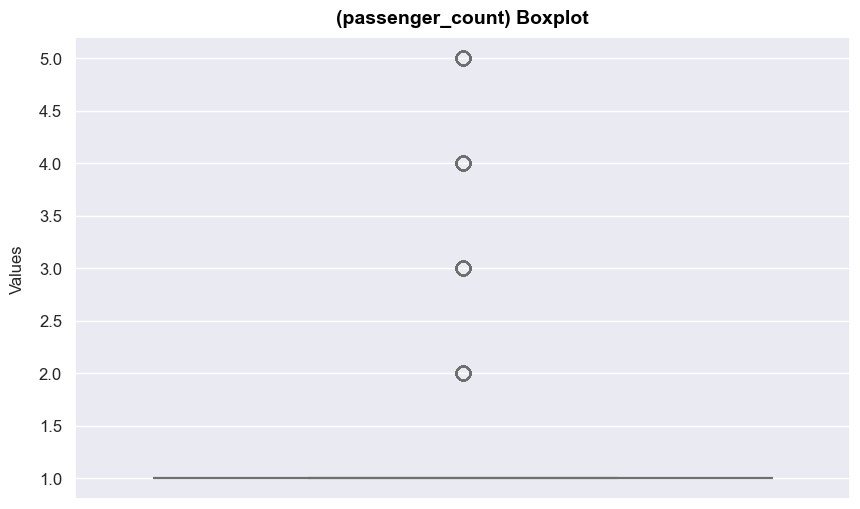


---------------------------------------------------------------------------------------------------------------------------
Stats for passenger_count:

count    1.996407e+07
mean     1.409476e+00
std      9.073296e-01
min      1.000000e+00
25%      1.000000e+00
50%      1.000000e+00
75%      1.000000e+00
max      5.000000e+00
Name: passenger_count, dtype: float64

------------------------------

Outliers for passenger_count:

4           2.0
5           2.0
10          3.0
17          2.0
21          2.0
           ... 
19964219    4.0
19964223    2.0
19964231    2.0
19964236    3.0
19964246    3.0
Name: passenger_count, Length: 4716147, dtype: float64




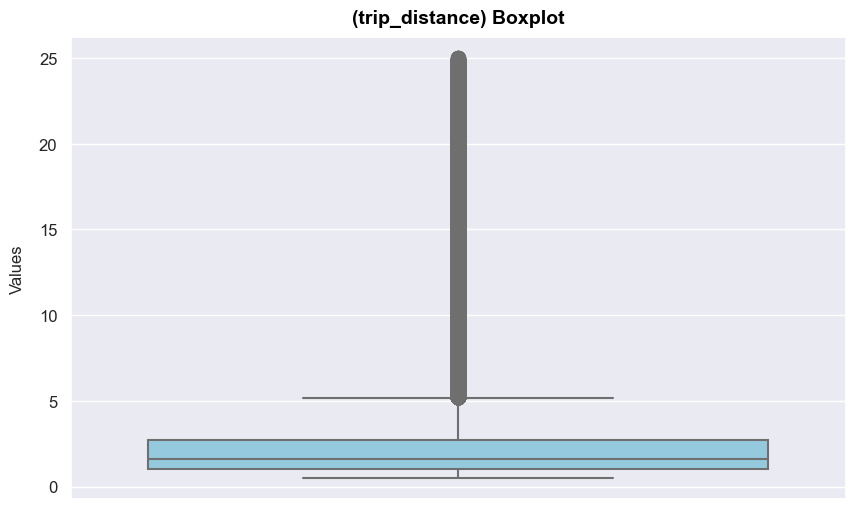


---------------------------------------------------------------------------------------------------------------------------
Stats for trip_distance:

count    1.996407e+07
mean     2.323167e+00
std      2.279871e+00
min      5.000000e-01
25%      1.020000e+00
50%      1.610000e+00
75%      2.690000e+00
max      2.500000e+01
Name: trip_distance, dtype: float64

------------------------------

Outliers for trip_distance:

9            7.76
19           5.73
22           5.70
45           8.70
50           5.20
            ...  
19964238     5.80
19964239     8.50
19964245     5.50
19964248    11.30
19964252     6.06
Name: trip_distance, Length: 1581421, dtype: float64




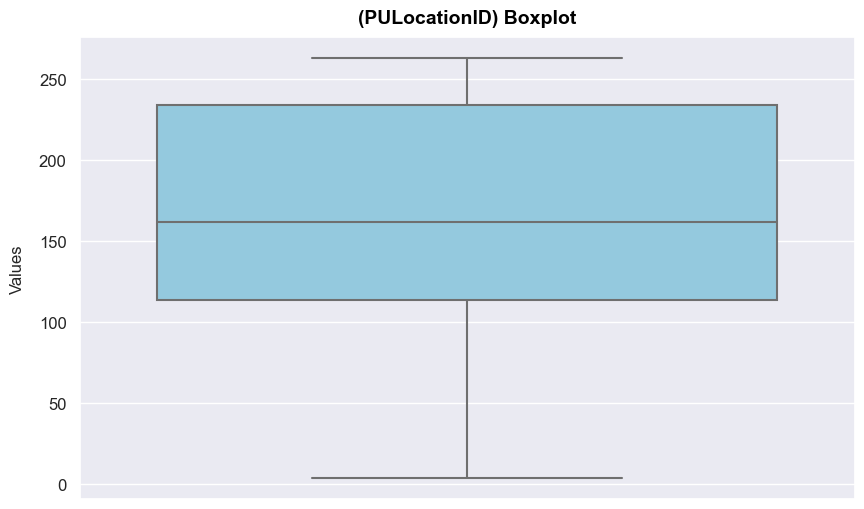


---------------------------------------------------------------------------------------------------------------------------
Stats for PULocationID:

count    1.996407e+07
mean     1.662015e+02
std      6.639656e+01
min      4.000000e+00
25%      1.140000e+02
50%      1.620000e+02
75%      2.340000e+02
max      2.630000e+02
Name: PULocationID, dtype: float64

------------------------------



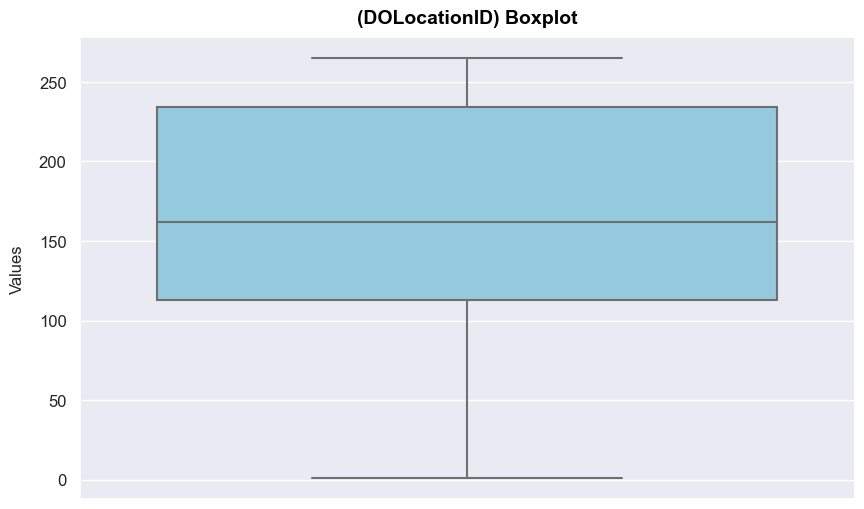


---------------------------------------------------------------------------------------------------------------------------
Stats for DOLocationID:

count    1.996407e+07
mean     1.627150e+02
std      6.969971e+01
min      1.000000e+00
25%      1.130000e+02
50%      1.620000e+02
75%      2.340000e+02
max      2.650000e+02
Name: DOLocationID, dtype: float64

------------------------------



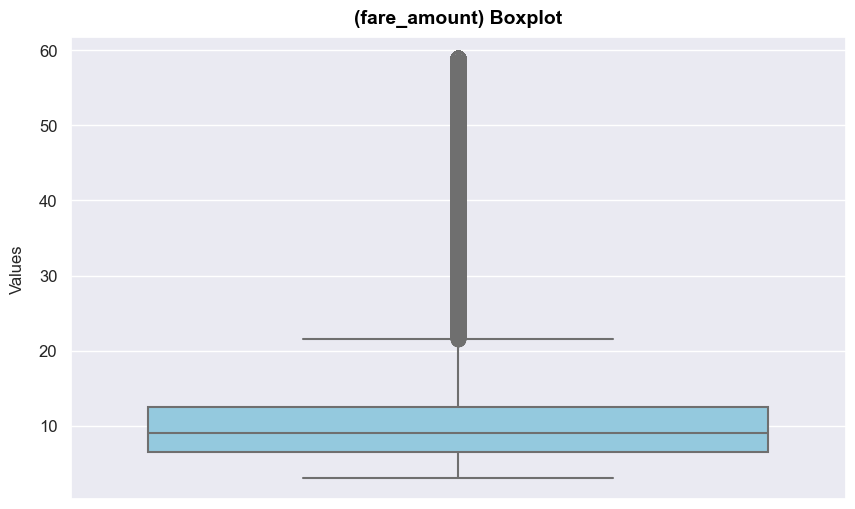


---------------------------------------------------------------------------------------------------------------------------
Stats for fare_amount:

count    1.996407e+07
mean     1.071426e+01
std      6.822808e+00
min      3.000000e+00
25%      6.500000e+00
50%      9.000000e+00
75%      1.250000e+01
max      5.900000e+01
Name: fare_amount, dtype: float64

------------------------------

Outliers for fare_amount:

9           28.5
22          25.5
41          22.5
45          28.0
50          25.5
            ... 
19964215    36.0
19964231    25.0
19964236    23.5
19964239    25.5
19964248    33.0
Name: fare_amount, Length: 1227979, dtype: float64




In [17]:
for i in range(1, 6):
    analyze_column(df_manhattan2020_drop, i)

### <span style="color:green;">2.3.2 Year 2021</span>

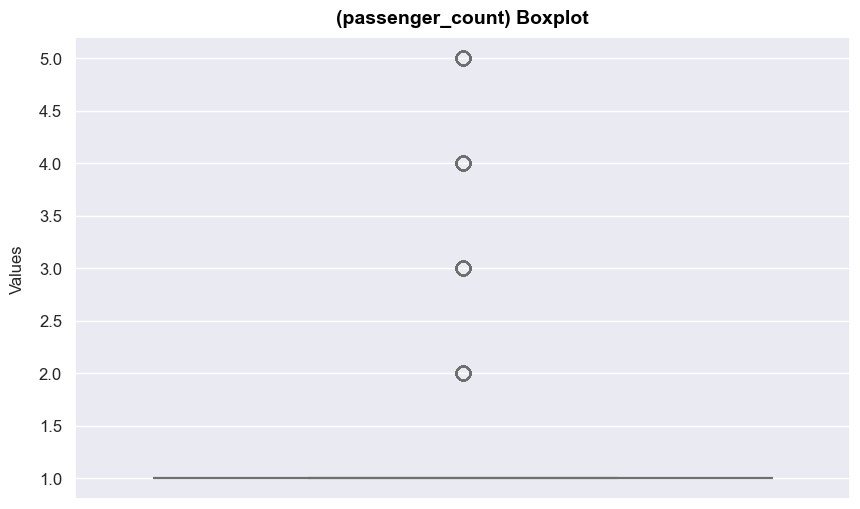


---------------------------------------------------------------------------------------------------------------------------
Stats for passenger_count:

count    2.466353e+07
mean     1.389358e+00
std      8.525199e-01
min      1.000000e+00
25%      1.000000e+00
50%      1.000000e+00
75%      1.000000e+00
max      5.000000e+00
Name: passenger_count, dtype: float64

------------------------------

Outliers for passenger_count:

4           2.0
5           3.0
6           5.0
7           5.0
12          2.0
           ... 
24663779    2.0
24663780    2.0
24663781    2.0
24663782    2.0
24663784    2.0
Name: passenger_count, Length: 5879385, dtype: float64




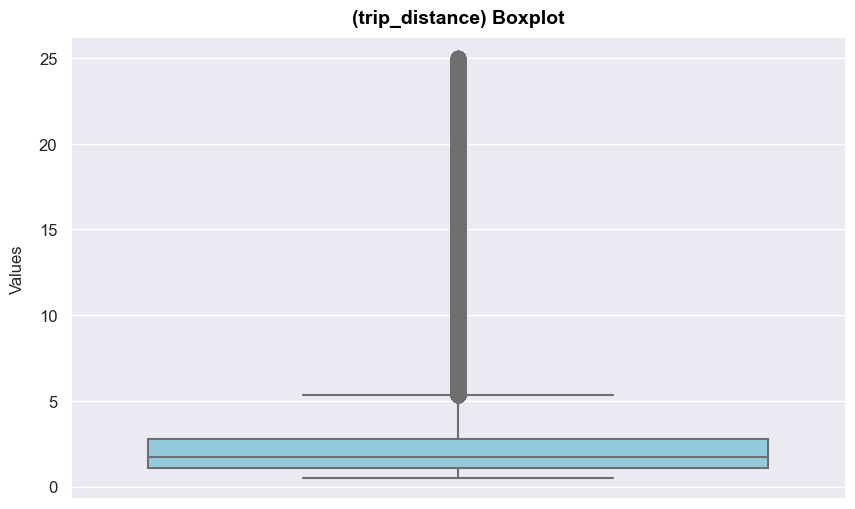


---------------------------------------------------------------------------------------------------------------------------
Stats for trip_distance:

count    2.466353e+07
mean     2.412691e+00
std      2.284017e+00
min      5.000000e-01
25%      1.100000e+00
50%      1.730000e+00
75%      2.800000e+00
max      2.500000e+01
Name: trip_distance, dtype: float64

------------------------------

Outliers for trip_distance:

3            5.70
5            6.11
15           5.40
23          13.67
24           6.10
            ...  
24663750    10.13
24663763     7.00
24663772     9.53
24663773    21.24
24663779     5.80
Name: trip_distance, Length: 1824574, dtype: float64




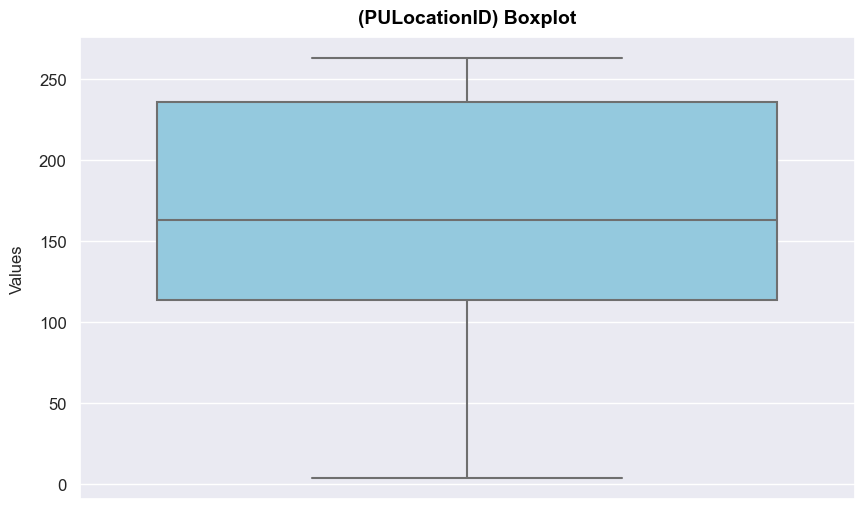


---------------------------------------------------------------------------------------------------------------------------
Stats for PULocationID:

count    2.466353e+07
mean     1.671467e+02
std      6.635282e+01
min      4.000000e+00
25%      1.140000e+02
50%      1.630000e+02
75%      2.360000e+02
max      2.630000e+02
Name: PULocationID, dtype: float64

------------------------------



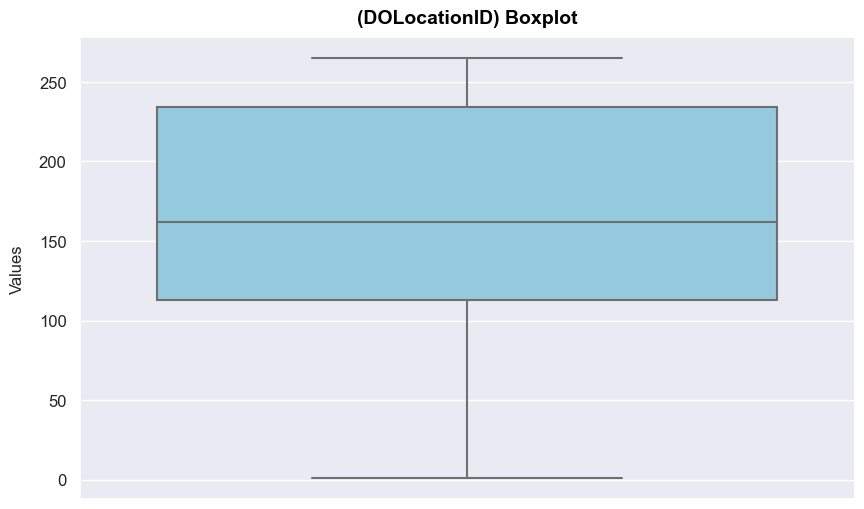


---------------------------------------------------------------------------------------------------------------------------
Stats for DOLocationID:

count    2.466353e+07
mean     1.640209e+02
std      6.950418e+01
min      1.000000e+00
25%      1.130000e+02
50%      1.620000e+02
75%      2.340000e+02
max      2.650000e+02
Name: DOLocationID, dtype: float64

------------------------------



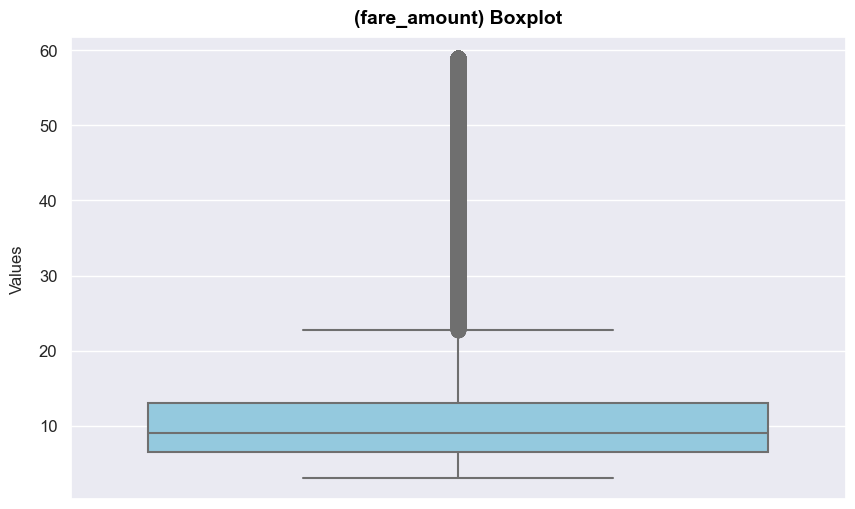


---------------------------------------------------------------------------------------------------------------------------
Stats for fare_amount:

count    2.466353e+07
mean     1.103314e+01
std      6.884828e+00
min      3.000000e+00
25%      6.500000e+00
50%      9.000000e+00
75%      1.300000e+01
max      5.900000e+01
Name: fare_amount, dtype: float64

------------------------------

Outliers for fare_amount:

23          38.0
67          24.5
95          24.5
98          27.0
100         28.0
            ... 
24663750    30.0
24663755    25.0
24663763    26.5
24663772    27.5
24663773    58.0
Name: fare_amount, Length: 1368184, dtype: float64




In [18]:
for i in range(1, 6):
    analyze_column(df_manhattan2021_drop, i)

### <span style="color:green;">2.3.3 Year 2022</span>

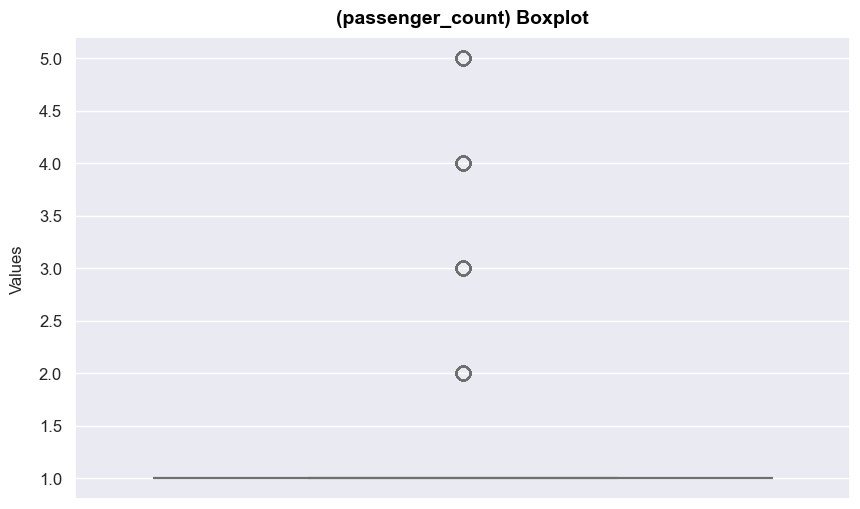


---------------------------------------------------------------------------------------------------------------------------
Stats for passenger_count:

count    1.582096e+07
mean     1.363152e+00
std      8.083066e-01
min      1.000000e+00
25%      1.000000e+00
50%      1.000000e+00
75%      1.000000e+00
max      5.000000e+00
Name: passenger_count, dtype: float64

------------------------------

Outliers for passenger_count:

0           2.0
10          3.0
11          3.0
12          2.0
13          4.0
           ... 
15822459    3.0
15822514    2.0
15822953    2.0
15823188    2.0
15823556    2.0
Name: passenger_count, Length: 3628026, dtype: float64




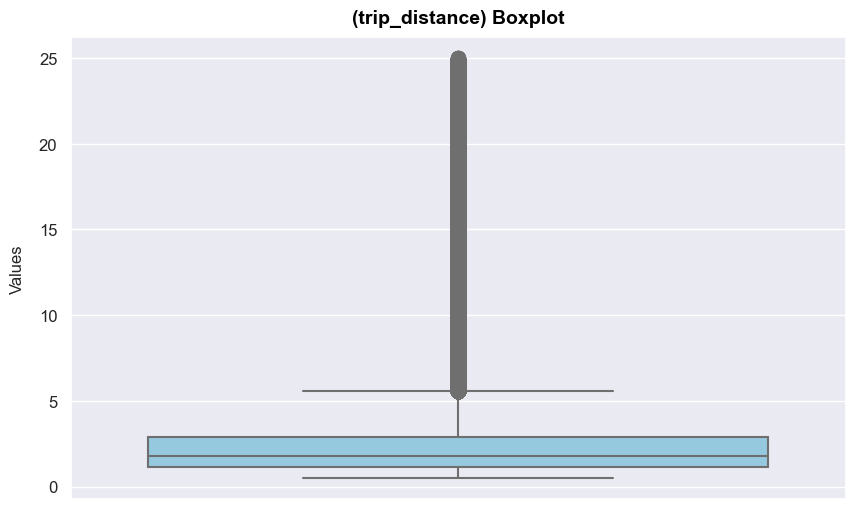


---------------------------------------------------------------------------------------------------------------------------
Stats for trip_distance:

count    1.582096e+07
mean     2.518742e+00
std      2.512772e+00
min      5.000000e-01
25%      1.120000e+00
50%      1.770000e+00
75%      2.900000e+00
max      2.500000e+01
Name: trip_distance, dtype: float64

------------------------------

Outliers for trip_distance:

57          6.29
58          6.50
78          7.60
82          7.37
90          5.88
            ... 
15821196    6.02
15822624    5.92
15822739    7.69
15823188    7.05
15823578    7.47
Name: trip_distance, Length: 1220040, dtype: float64




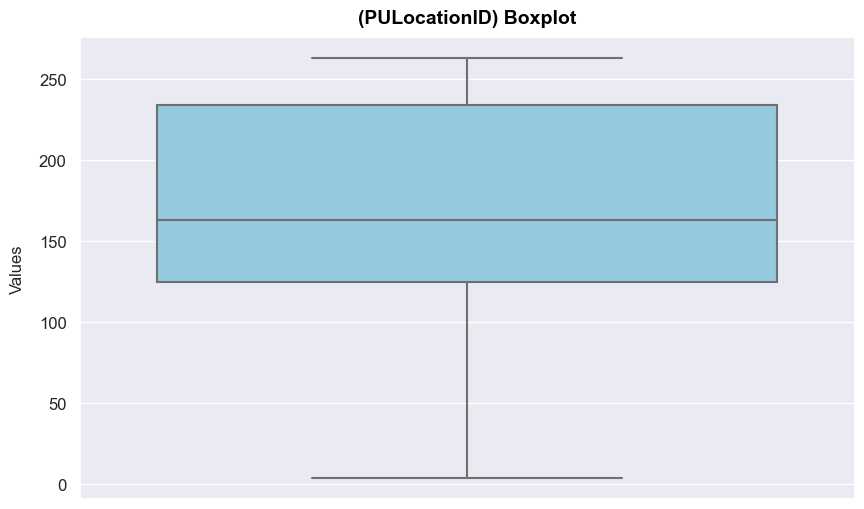


---------------------------------------------------------------------------------------------------------------------------
Stats for PULocationID:

count    1.582096e+07
mean     1.671861e+02
std      6.597122e+01
min      4.000000e+00
25%      1.250000e+02
50%      1.630000e+02
75%      2.340000e+02
max      2.630000e+02
Name: PULocationID, dtype: float64

------------------------------



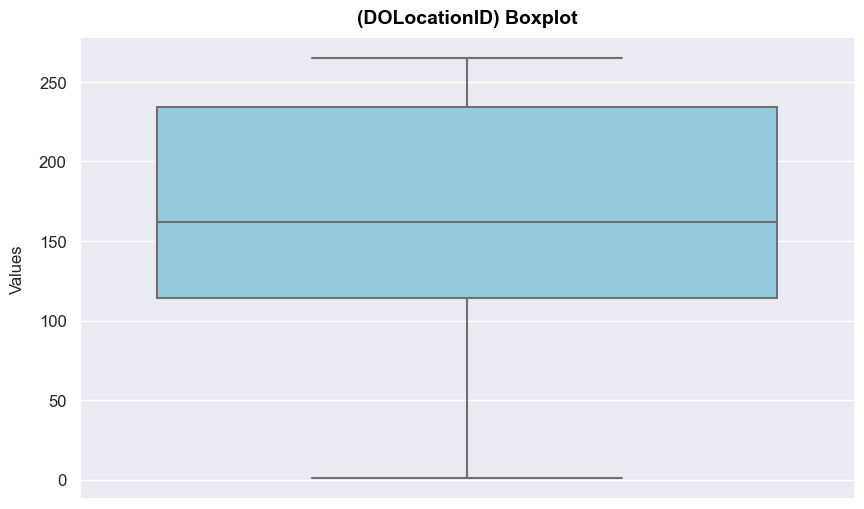


---------------------------------------------------------------------------------------------------------------------------
Stats for DOLocationID:

count    1.582096e+07
mean     1.640295e+02
std      6.905013e+01
min      1.000000e+00
25%      1.140000e+02
50%      1.620000e+02
75%      2.340000e+02
max      2.650000e+02
Name: DOLocationID, dtype: float64

------------------------------



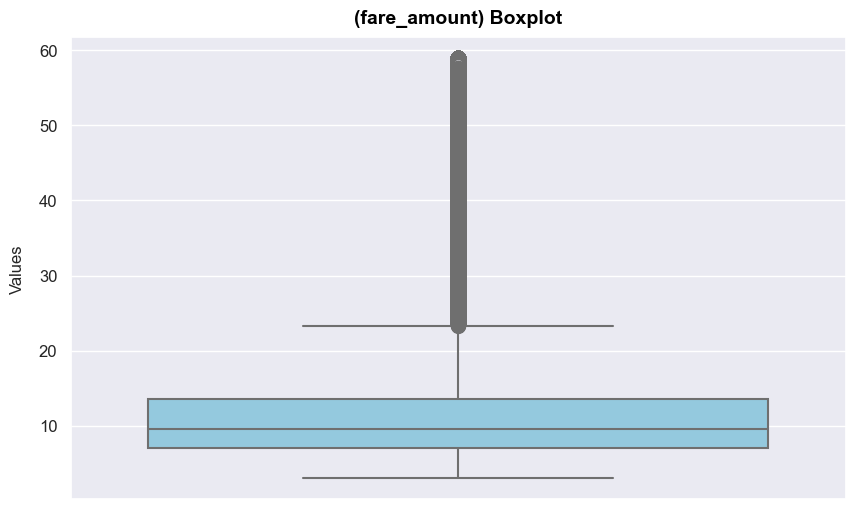


---------------------------------------------------------------------------------------------------------------------------
Stats for fare_amount:

count    1.582096e+07
mean     1.150716e+01
std      7.441542e+00
min      3.000000e+00
25%      7.000000e+00
50%      9.500000e+00
75%      1.350000e+01
max      5.900000e+01
Name: fare_amount, dtype: float64

------------------------------

Outliers for fare_amount:

4           23.5
57          24.5
78          24.0
98          23.5
106         24.0
            ... 
15821150    24.5
15821187    54.5
15821196    24.0
15822739    26.5
15823188    24.0
Name: fare_amount, Length: 964850, dtype: float64




In [19]:
for i in range(1, 6):
    analyze_column(df_manhattan2022_drop, i)

### *Based on the information we have from the data. Things that are sometimes known as outliers are not outliers and are possible. Here, the datasets were checked statistically and there is no problem in any of the records. So the data cleaning process is done correctly.*

In [20]:
df_manhattan2020_drop.to_csv('D:/UNI/Term 9/Project/Data/df_manhattan2020_clean.csv', index=False)

In [21]:
df_manhattan2021_drop.to_csv('D:/UNI/Term 9/Project/Data/df_manhattan2021_clean.csv', index=False)

In [22]:
df_manhattan2022_drop.to_csv('D:/UNI/Term 9/Project/Data/df_manhattan2022_clean.csv', index=False)

-------------------------------------------------------------------------------------------------

### *In the next step, we will go to data preprocessing.*

In [23]:
del df_manhattan2020_drop
del df_manhattan2021_drop
del df_manhattan2022_drop

gc.collect()

26536

-------------------------------------------------------------------------------------------------

## <span style="color:green;">3. Data preprocessing</span>

### *In this section, we perform the necessary processing to convert the data into the format that the input of the model should have.*

In [3]:
dataframes = {}
variables = ['df_manhattan2020_clean', 'df_manhattan2021_clean', 'df_manhattan2022_clean']

file_names = [
    'D:/UNI/Term 9/Project/Data/df_manhattan2020_clean.csv',
    'D:/UNI/Term 9/Project/Data/df_manhattan2021_clean.csv',
    'D:/UNI/Term 9/Project/Data/df_manhattan2022_clean.csv'
]

# Loop through each file and corresponding variable name
for file_name, variable in zip(file_names, variables):
    print('\n')
    start_time = time.time()
    print(f'In Progress {file_name}...')
    
    # Calculate the total number of rows in the file
    total_rows = sum(1 for row in open(file_name, 'r', encoding='utf-8'))
    
    # Initialize a progress bar with the total number of rows
    with tqdm(total=total_rows, bar_format='{l_bar}{bar:50}{r_bar}{bar:-10b}', colour='green') as pbar:
        chunks = []
        
        # Read the CSV file in chunks
        for chunk in pd.read_csv(file_name, chunksize=10000, low_memory=False):
            chunks.append(chunk)
            pbar.update(len(chunk))
            
    # Concatenate all chunks into a single DataFrame
    df = pd.concat(chunks, ignore_index=True)
    dataframes[variable] = df




In Progress D:/UNI/Term 9/Project/Data/df_manhattan2020_clean.csv...


100%|█████████████████████████████████████████████████▉| 19964072/19964073 [00:17<00:00, 1142700.19it/s]               




In Progress D:/UNI/Term 9/Project/Data/df_manhattan2021_clean.csv...


100%|█████████████████████████████████████████████████▉| 24663528/24663529 [00:22<00:00, 1077581.36it/s]               




In Progress D:/UNI/Term 9/Project/Data/df_manhattan2022_clean.csv...


100%|█████████████████████████████████████████████████▉| 15820958/15820959 [00:11<00:00, 1333121.95it/s]               


-------------------------------------------------------------------------------------------------

### <span style="color:green;">3.1 Feature engineering</span>

### *First, we remove irrelevant features so that the model is properly trained.*

In [4]:
df_manhattan2020_clean = dataframes['df_manhattan2020_clean']
df_manhattan2021_clean = dataframes['df_manhattan2021_clean']
df_manhattan2022_clean = dataframes['df_manhattan2022_clean']

df_manhattan2020_clean.rename(columns={'tpep_pickup_datetime': 'pickup_datetime'}, inplace=True)
df_manhattan2021_clean.rename(columns={'tpep_pickup_datetime': 'pickup_datetime'}, inplace=True)
df_manhattan2022_clean.rename(columns={'tpep_pickup_datetime': 'pickup_datetime'}, inplace=True)

df_manhattan2020_clean.rename(columns={'PULocationID': 'pickup_locationID'}, inplace=True)
df_manhattan2021_clean.rename(columns={'PULocationID': 'pickup_locationID'}, inplace=True)
df_manhattan2022_clean.rename(columns={'PULocationID': 'pickup_locationID'}, inplace=True)
df_manhattan2022_clean

,pickup_datetime,passenger_count,trip_distance,pickup_locationID,DOLocationID,fare_amount
0,2022-01-01 00:35:40,2.0,3.80,142.0,236.0,14.5
1,2022-01-01 00:33:43,1.0,2.10,236.0,42.0,8.0
2,2022-01-01 00:53:21,1.0,0.97,166.0,166.0,7.5
3,2022-01-01 00:25:21,1.0,1.09,114.0,68.0,8.0
4,2022-01-01 00:36:48,1.0,4.30,68.0,163.0,23.5
...,...,...,...,...,...,...
15820953,2022-06-30 23:56:28,1.0,2.93,233.0,249.0,12.0
15820954,2022-06-30 23:47:30,1.0,0.83,249.0,90.0,4.5
15820955,2022-06-30 23:14:27,1.0,2.34,74.0,236.0,10.0
15820956,2022-06-30 16:28:35,1.0,3.11,79.0,141.0,10.0


In [5]:
col = ['trip_distance', 'fare_amount', 'DOLocationID']	

manhattan2020_clean = df_manhattan2020_clean.drop(col, axis=1)
manhattan2021_clean = df_manhattan2021_clean.drop(col, axis=1)
manhattan2022_clean = df_manhattan2022_clean.drop(col, axis=1)
manhattan2020_clean

,pickup_datetime,passenger_count,pickup_locationID
0,2020-01-01 00:28:15,1.0,238
1,2020-01-01 00:35:39,1.0,239
2,2020-01-01 00:47:41,1.0,238
3,2020-01-01 00:55:23,1.0,238
4,2020-01-01 00:29:01,2.0,246
...,...,...,...
19964067,2020-12-31 23:05:33,1.0,107
19964068,2020-12-31 22:57:20,1.0,236
19964069,2020-12-31 23:40:35,1.0,236
19964070,2020-12-31 23:54:57,1.0,238


-------------------------------------------------------------------------------------------------

### <span style="color:green;">3.1.1 Passengers</span>

### *Now, separate the passenger column to get the total number of passengers for each 1-hour period.*

In [6]:
df_count2020 = manhattan2020_clean.iloc[:, :2]
df_count2021 = manhattan2021_clean.iloc[:, :2]
df_count2022 = manhattan2022_clean.iloc[:, :2]
df_count2022

,pickup_datetime,passenger_count
0,2022-01-01 00:35:40,2.0
1,2022-01-01 00:33:43,1.0
2,2022-01-01 00:53:21,1.0
3,2022-01-01 00:25:21,1.0
4,2022-01-01 00:36:48,1.0
...,...,...
15820953,2022-06-30 23:56:28,1.0
15820954,2022-06-30 23:47:30,1.0
15820955,2022-06-30 23:14:27,1.0
15820956,2022-06-30 16:28:35,1.0


-------------------------------------------------------------------------------------------------

In [7]:
def pop(df, s, e):
    """
    Aggregates passenger counts by hour within a specified date range.

    Parameters:
    df (pd.DataFrame): DataFrame containing taxi trip data with a 'pickup_datetime' column.
    s (str): Start date and time in the format 'YYYY-MM-DD HH:MM'.
    e (str): End date and time in the format 'YYYY-MM-DD HH:MM'.

    Returns:
    pd.DataFrame: DataFrame with hourly passenger counts within the specified date range.
                  The DataFrame has 'datetime' as the index and 'passenger_count' as the column.
    """

    # Convert 'pickup_datetime' column to datetime format
    df['pickup_datetime'] = pd.to_datetime(df['pickup_datetime'])
    
    # Group data by hour and sum passenger counts
    df_grouped = df.groupby(df['pickup_datetime'].dt.floor('H')).agg({'passenger_count': 'sum'}).reset_index()
    df_grouped['pickup_datetime'] = df_grouped['pickup_datetime'].dt.strftime('%Y-%m-%d %H:00')
    
    # Create a date range with hourly frequency
    start = s
    end = e
    date_range = pd.date_range(start=start, end=end, freq='H')
    
    # Create a DataFrame with the date range
    final_df = pd.DataFrame(date_range, columns=['pickup_datetime'])
    final_df['pickup_datetime'] = final_df['pickup_datetime'].dt.strftime('%Y-%m-%d %H:00')
    
    # Merge the grouped data with the date range DataFrame
    final_df = final_df.merge(df_grouped, how='left', left_on='pickup_datetime', right_on='pickup_datetime').fillna(0)
    final_df['passenger_count'] = final_df['passenger_count'].astype(int)
    
    # Rename the 'pickup_datetime' column to 'datetime' and set it as the index
    final_df.rename(columns={'pickup_datetime': 'datetime'}, inplace=True)
    final_df.set_index('datetime', inplace=True)

    return final_df


In [8]:
start = '2020-01-01 00:00:00'
end = '2020-12-31 23:00:00'

df_pop2020 = pop(df_count2020, start, end)

In [9]:
start = '2021-01-01 00:00:00'
end = '2021-12-31 23:00:00'

df_pop2021 = pop(df_count2021, start, end)

In [10]:
start = '2022-01-01 00:00:00'
end = '2022-06-30 23:00:00'

df_pop2022 = pop(df_count2022, start, end)
df_pop2022

,passenger_count
datetime,
2022-01-01 00:00,5635
2022-01-01 01:00,6284
2022-01-01 02:00,4751
2022-01-01 03:00,3355
2022-01-01 04:00,1964
...,...
2022-06-30 19:00,8304
2022-06-30 20:00,6801
2022-06-30 21:00,7293


-------------------------------------------------------------------------------------------------

### <span style="color:green;">3.1.2 Time based parameters</span>

### *After that, we write a function to get the time parameters, and its steps are as follows.*

>*1. Dataset grouping into 1-hour intervals*

>*2. Creating year, month, day and hour columns based on the existing datetime*

>*3. Add weekday, weekend and holiday columns based on the first column*

>*4. Creating columns related to each ID location and summing up the number of its requests in each desired time period*

In [11]:
def feature_eng(df):
    """
    Performs feature engineering on the taxi trip data.

    Parameters:
    df (pd.DataFrame): DataFrame containing taxi trip data with 'pickup_datetime' and 'pickup_locationID' columns.

    Returns:
    pd.DataFrame: DataFrame with engineered features including time-based features and location-based pickup counts.
    """

    # Convert 'pickup_locationID' to integer type
    df['pickup_locationID'] = df['pickup_locationID'].astype(float).astype('int64')
    
    # Convert 'pickup_datetime' to datetime format and set it as the index
    df['datetime'] = pd.to_datetime(df['pickup_datetime'])
    df.set_index('datetime', inplace=True)
    
    # Group data by hour and 'pickup_locationID', then unstack to create columns for each location ID
    df = df.groupby([pd.Grouper(freq='H'), 'pickup_locationID']).size().unstack(fill_value=0)
    
    # Extract time-based features from the index
    df['year'] = df.index.year
    df['month'] = df.index.month
    df['day'] = df.index.day
    df['hour'] = df.index.hour
    df['weekday'] = df.index.dayofweek + 1
    df['weekend'] = np.where(df['weekday'].isin([6, 7]), 1, 0)
    
    # Identify holidays within the date range and create a holiday feature
    cal = USFederalHolidayCalendar()
    holidays = cal.holidays(start=df.index.min(), end=df.index.max())
    df['holiday'] = np.where(df.index.isin(holidays), 1, 0)
    
    # Rename location columns to a more readable format
    location_columns = {loc: f'LID_{loc}' for loc in df.columns if isinstance(loc, int)}
    df.rename(columns=location_columns, inplace=True)
    
    # Sort location columns numerically and reorder DataFrame columns
    sorted_columns = sorted([col for col in df.columns if col.startswith('LID_')], key=lambda x: int(x.split('_')[1]))
    df = df[['year', 'month', 'day', 'hour', 'weekday', 'weekend', 'holiday'] + sorted_columns]
    
    return df


In [12]:
manhattan2020_feature = feature_eng(manhattan2020_clean)
manhattan2020_feature

pickup_locationID,year,month,day,hour,weekday,weekend,holiday,LID_4,LID_12,LID_13,...,LID_237,LID_238,LID_239,LID_243,LID_244,LID_246,LID_249,LID_261,LID_262,LID_263
datetime,,,,,,,,,,,,,,,,,,,,,
2020-01-01 00:00:00,2020,1,1,0,3,0,1,49,4,52,...,497,316,434,9,18,192,388,49,135,361
2020-01-01 01:00:00,2020,1,1,1,3,0,0,101,4,63,...,462,275,448,15,44,222,253,49,132,438
2020-01-01 02:00:00,2020,1,1,2,3,0,0,128,2,30,...,195,174,301,13,37,219,282,48,67,336
2020-01-01 03:00:00,2020,1,1,3,3,0,0,89,1,10,...,85,85,130,7,26,233,344,29,39,216
2020-01-01 04:00:00,2020,1,1,4,3,0,0,53,0,11,...,26,53,67,1,17,159,202,11,17,140
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-31 19:00:00,2020,12,31,19,4,0,0,1,0,7,...,81,72,65,0,11,33,46,8,33,80
2020-12-31 20:00:00,2020,12,31,20,4,0,0,0,0,5,...,43,51,65,1,5,20,32,5,21,55
2020-12-31 21:00:00,2020,12,31,21,4,0,0,2,0,5,...,44,32,49,1,0,12,39,3,15,46


In [13]:
manhattan2021_feature = feature_eng(manhattan2021_clean)
manhattan2021_feature

pickup_locationID,year,month,day,hour,weekday,weekend,holiday,LID_4,LID_12,LID_13,...,LID_237,LID_238,LID_239,LID_243,LID_244,LID_246,LID_249,LID_261,LID_262,LID_263
datetime,,,,,,,,,,,,,,,,,,,,,
2021-01-01 00:00:00,2021,1,1,0,5,0,1,3,0,2,...,32,35,26,0,2,8,19,2,12,46
2021-01-01 01:00:00,2021,1,1,1,5,0,0,1,0,2,...,13,19,40,1,2,10,31,5,14,45
2021-01-01 02:00:00,2021,1,1,2,5,0,0,1,0,2,...,15,22,20,0,3,11,17,5,4,23
2021-01-01 03:00:00,2021,1,1,3,5,0,0,2,0,0,...,6,8,8,0,1,2,8,1,1,10
2021-01-01 04:00:00,2021,1,1,4,5,0,0,0,0,0,...,2,3,6,0,2,4,1,2,1,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-31 19:00:00,2021,12,31,19,5,0,0,8,0,13,...,141,107,127,1,1,63,87,35,70,123
2021-12-31 20:00:00,2021,12,31,20,5,0,0,1,2,19,...,144,85,118,0,2,44,94,26,58,110
2021-12-31 21:00:00,2021,12,31,21,5,0,0,5,1,17,...,91,76,82,0,5,45,99,17,46,116


In [14]:
manhattan2022_feature = feature_eng(manhattan2022_clean)
manhattan2022_feature

pickup_locationID,year,month,day,hour,weekday,weekend,holiday,LID_4,LID_12,LID_13,...,LID_237,LID_238,LID_239,LID_243,LID_244,LID_246,LID_249,LID_261,LID_262,LID_263
datetime,,,,,,,,,,,,,,,,,,,,,
2022-01-01 00:00:00,2022,1,1,0,6,1,0,10,2,11,...,170,72,131,1,3,67,146,13,30,106
2022-01-01 01:00:00,2022,1,1,1,6,1,0,9,0,7,...,152,61,108,0,2,76,120,16,25,147
2022-01-01 02:00:00,2022,1,1,2,6,1,0,21,0,3,...,52,34,54,1,0,56,124,11,19,79
2022-01-01 03:00:00,2022,1,1,3,6,1,0,7,0,0,...,17,16,19,0,2,77,116,10,5,59
2022-01-01 04:00:00,2022,1,1,4,6,1,0,5,0,1,...,10,7,18,1,1,43,55,1,6,35
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-30 19:00:00,2022,6,30,19,4,0,0,3,2,68,...,288,109,151,0,1,135,126,36,61,114
2022-06-30 20:00:00,2022,6,30,20,4,0,0,4,2,41,...,236,79,147,2,3,98,144,27,45,96
2022-06-30 21:00:00,2022,6,30,21,4,0,0,6,2,31,...,218,62,139,0,4,99,161,20,34,106


### *In the next step, we add the number of passengers column as population to our taxi data.*

In [15]:
l11 = df_pop2020['passenger_count'].tolist()
l22 = df_pop2021['passenger_count'].tolist()
l33 = df_pop2022['passenger_count'].tolist()

random_index1 = random.randint(0, len(l11) - 1)
l11.pop(random_index1)

random_index2 = random.randint(0, len(l22) - 1)
l22.pop(random_index2)

random_index3 = random.randint(0, len(l33) - 1)
l33.pop(random_index3)

print('\nLen pop2020  =', len(l11))
print('Len taxi2020 =', manhattan2020_feature.shape[0])

print('\nLen pop2021  =', len(l22))
print('Len taxi2021 =', manhattan2021_feature.shape[0])

print('\nLen pop2022  =', len(l33))
print('Len taxi2022 =', manhattan2022_feature.shape[0])

Len pop2020  = 8783
Len taxi2020 = 8783

Len pop2021  = 8759
Len taxi2021 = 8759

Len pop2022  = 4343
Len taxi2022 = 4343


-------------------------------------------------------------------------------------------------

In [16]:
manhattan2020_feature['pop'] = l11
manhattan2020_feature

pickup_locationID,year,month,day,hour,weekday,weekend,holiday,LID_4,LID_12,LID_13,...,LID_238,LID_239,LID_243,LID_244,LID_246,LID_249,LID_261,LID_262,LID_263,pop
datetime,,,,,,,,,,,,,,,,,,,,,
2020-01-01 00:00:00,2020,1,1,0,3,0,1,49,4,52,...,316,434,9,18,192,388,49,135,361,18480
2020-01-01 01:00:00,2020,1,1,1,3,0,0,101,4,63,...,275,448,15,44,222,253,49,132,438,20517
2020-01-01 02:00:00,2020,1,1,2,3,0,0,128,2,30,...,174,301,13,37,219,282,48,67,336,17652
2020-01-01 03:00:00,2020,1,1,3,3,0,0,89,1,10,...,85,130,7,26,233,344,29,39,216,12607
2020-01-01 04:00:00,2020,1,1,4,3,0,0,53,0,11,...,53,67,1,17,159,202,11,17,140,7899
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-31 19:00:00,2020,12,31,19,4,0,0,1,0,7,...,72,65,0,11,33,46,8,33,80,2729
2020-12-31 20:00:00,2020,12,31,20,4,0,0,0,0,5,...,51,65,1,5,20,32,5,21,55,2065
2020-12-31 21:00:00,2020,12,31,21,4,0,0,2,0,5,...,32,49,1,0,12,39,3,15,46,1644


In [17]:
manhattan2021_feature['pop'] = l22
manhattan2021_feature

pickup_locationID,year,month,day,hour,weekday,weekend,holiday,LID_4,LID_12,LID_13,...,LID_238,LID_239,LID_243,LID_244,LID_246,LID_249,LID_261,LID_262,LID_263,pop
datetime,,,,,,,,,,,,,,,,,,,,,
2021-01-01 00:00:00,2021,1,1,0,5,0,1,3,0,2,...,35,26,0,2,8,19,2,12,46,1285
2021-01-01 01:00:00,2021,1,1,1,5,0,0,1,0,2,...,19,40,1,2,10,31,5,14,45,1565
2021-01-01 02:00:00,2021,1,1,2,5,0,0,1,0,2,...,22,20,0,3,11,17,5,4,23,1010
2021-01-01 03:00:00,2021,1,1,3,5,0,0,2,0,0,...,8,8,0,1,2,8,1,1,10,464
2021-01-01 04:00:00,2021,1,1,4,5,0,0,0,0,0,...,3,6,0,2,4,1,2,1,10,266
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-31 19:00:00,2021,12,31,19,5,0,0,8,0,13,...,107,127,1,1,63,87,35,70,123,5650
2021-12-31 20:00:00,2021,12,31,20,5,0,0,1,2,19,...,85,118,0,2,44,94,26,58,110,5343
2021-12-31 21:00:00,2021,12,31,21,5,0,0,5,1,17,...,76,82,0,5,45,99,17,46,116,4994


-------------------------------------------------------------------------------------------------

In [18]:
manhattan2022_feature['pop'] = l33
manhattan2022_feature

pickup_locationID,year,month,day,hour,weekday,weekend,holiday,LID_4,LID_12,LID_13,...,LID_238,LID_239,LID_243,LID_244,LID_246,LID_249,LID_261,LID_262,LID_263,pop
datetime,,,,,,,,,,,,,,,,,,,,,
2022-01-01 00:00:00,2022,1,1,0,6,1,0,10,2,11,...,72,131,1,3,67,146,13,30,106,5635
2022-01-01 01:00:00,2022,1,1,1,6,1,0,9,0,7,...,61,108,0,2,76,120,16,25,147,6284
2022-01-01 02:00:00,2022,1,1,2,6,1,0,21,0,3,...,34,54,1,0,56,124,11,19,79,4751
2022-01-01 03:00:00,2022,1,1,3,6,1,0,7,0,0,...,16,19,0,2,77,116,10,5,59,3355
2022-01-01 04:00:00,2022,1,1,4,6,1,0,5,0,1,...,7,18,1,1,43,55,1,6,35,1964
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-30 19:00:00,2022,6,30,19,4,0,0,3,2,68,...,109,151,0,1,135,126,36,61,114,8304
2022-06-30 20:00:00,2022,6,30,20,4,0,0,4,2,41,...,79,147,2,3,98,144,27,45,96,6801
2022-06-30 21:00:00,2022,6,30,21,4,0,0,6,2,31,...,62,139,0,4,99,161,20,34,106,7293


-------------------------------------------------------------------------------------------------

### *After completing the preparation of taxi data for each year, we will merge them with the consolidator so that it becomes one file and we will use this file for analysis and other processes from now on.*

In [19]:
manhattan_taxi = pd.concat([manhattan2020_feature, manhattan2021_feature, manhattan2022_feature])
manhattan_taxi

pickup_locationID,year,month,day,hour,weekday,weekend,holiday,LID_4,LID_12,LID_13,...,LID_238,LID_239,LID_243,LID_244,LID_246,LID_249,LID_261,LID_262,LID_263,pop
datetime,,,,,,,,,,,,,,,,,,,,,
2020-01-01 00:00:00,2020,1,1,0,3,0,1,49,4,52,...,316,434,9,18,192,388,49,135,361,18480
2020-01-01 01:00:00,2020,1,1,1,3,0,0,101,4,63,...,275,448,15,44,222,253,49,132,438,20517
2020-01-01 02:00:00,2020,1,1,2,3,0,0,128,2,30,...,174,301,13,37,219,282,48,67,336,17652
2020-01-01 03:00:00,2020,1,1,3,3,0,0,89,1,10,...,85,130,7,26,233,344,29,39,216,12607
2020-01-01 04:00:00,2020,1,1,4,3,0,0,53,0,11,...,53,67,1,17,159,202,11,17,140,7899
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-30 19:00:00,2022,6,30,19,4,0,0,3,2,68,...,109,151,0,1,135,126,36,61,114,8304
2022-06-30 20:00:00,2022,6,30,20,4,0,0,4,2,41,...,79,147,2,3,98,144,27,45,96,6801
2022-06-30 21:00:00,2022,6,30,21,4,0,0,6,2,31,...,62,139,0,4,99,161,20,34,106,7293


In [20]:
manhattan_taxi.to_csv('D:/UNI/Term 9/Project/Data/manhattan_taxi.csv', index=True)

In [23]:
del manhattan2020_feature
del manhattan2021_feature
del manhattan2022_feature
del manhattan2020_clean
del manhattan2021_clean
del manhattan2022_clean

gc.collect()

26536

-------------------------------------------------------------------------------------------------

### <span style="color:green;">3.2 Visualiation</span>

### *In this section, we will display the status map and check dataset's charts in different time periods.*

### *First, we create a Tree heatmap for the areas of Manhattan in order to have an analysis of the volume of taxi requests in each region at a glance.*

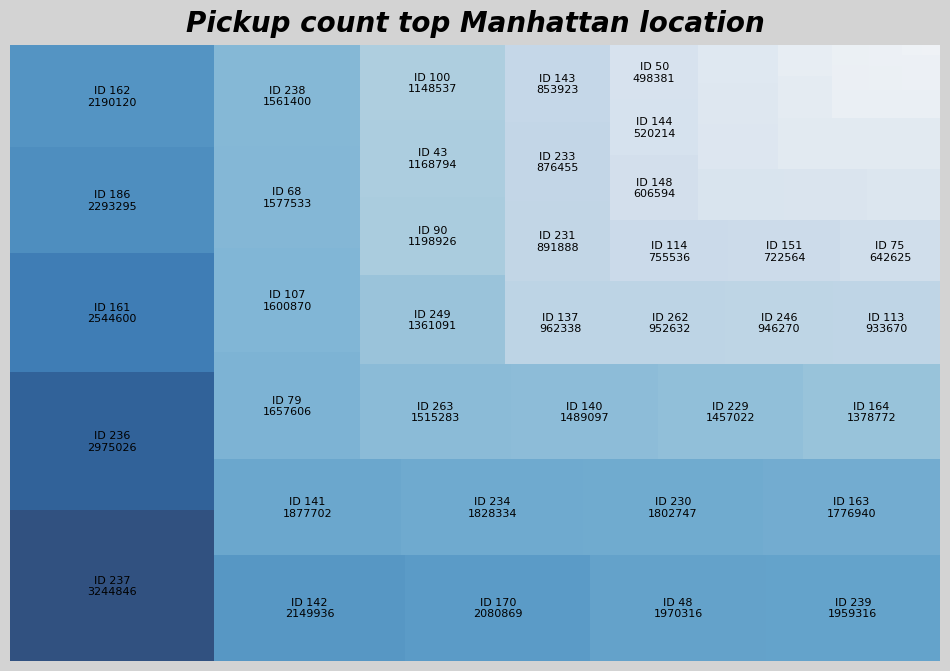

In [21]:
# Calculate the sum of pickups for each location ID in Manhattan
location_sums = manhattan_taxi.iloc[:, 7:74].sum()

# Sort the pickup sums in descending order
location_sums_sorted = location_sums.sort_values(ascending=False)

# Create labels for the top locations, showing the ID and count
labels = [f'ID {location_id[4:]}\n{count}' if idx < len(location_sums_sorted) - 29 else ''
          for idx, (location_id, count) in enumerate(zip(location_sums_sorted.index, location_sums_sorted.values))]

plt.rc('font', size=8)
colors = [plt.cm.Blues(count/max(location_sums_sorted.values)) for count in location_sums_sorted.values]

fig = plt.figure(figsize=(12, 8))
fig.patch.set_facecolor('lightgray')

# Plot the data using a treemap
squarify.plot(sizes=location_sums_sorted.values, label=labels, color=colors, alpha=0.8)
plt.title('Pickup count top Manhattan location', fontsize=20, color='black', weight='bold', style='italic', pad=10)
plt.axis('off')
plt.savefig('D:/UNI/Term 9/Project/Data/Figs/Heatmap.png', dpi=300)
plt.savefig('D:/UNI/Term 9/Project/Data/Figs/Heatmap.jpg', dpi=300)

plt.show()


-------------------------------------------------------------------------------------------------

### *Then we also draw the geographic map of Manhattan as a choropleth.*

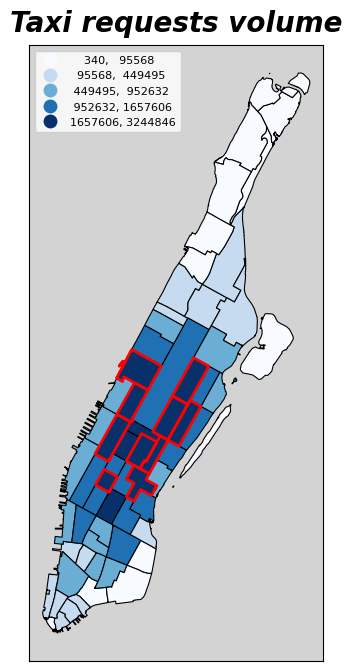

In [22]:
gdf = gpd.read_file("D:/UNI/Term 9/Project/Data/Zone/taxi_zones.shp")

# Summarize taxi requests for each location ID in Manhattan
manhattan_data = manhattan_taxi.filter(regex='LID_').sum().rename_axis('LocationID').reset_index()
manhattan_data['LocationID'] = manhattan_data['LocationID'].str.extract('(\d+)').astype(int)
manhattan_data.rename(columns={0: 'taxi_requests'}, inplace=True)

# Filter the GeoDataFrame to include only the relevant location IDs and merge with the summarized data
manhattan_gdf = gdf[gdf['LocationID'].isin(manhattan_data['LocationID'])]
manhattan_gdf = manhattan_gdf.merge(manhattan_data, on='LocationID')

# Identify the top 10 locations with the highest taxi requests
top10 = manhattan_gdf.sort_values(by='taxi_requests', ascending=False).head(10)

fig, ax = plt.subplots(1, 1, figsize=(8, 8))

# Plot the data using a choropleth map
base = manhattan_gdf.plot(column='taxi_requests', ax=ax, cmap='Blues', scheme='quantiles', legend=True, edgecolor='black', linewidth=0.8, legend_kwds={'fmt': "{:.0f}"})
plt.title('Taxi requests volume', fontsize=20, color='black', weight='bold', style='italic', pad=10)

# Adjust the legend position
leg = ax.get_legend()
leg.set_bbox_to_anchor((0, 1))
leg.set_loc('upper left')

# Customize the plot appearance
ax.set_facecolor('lightgray')
ax.grid(True, color='black')
ax.set_xticks([])
ax.set_yticks([])

# Highlight the top 10 locations with red borders
for idx, row in top10.iterrows():
    geom = row['geometry']
    x, y = geom.exterior.xy
    ax.plot(x, y, color='red', linewidth=2)

plt.savefig('D:/UNI/Term 9/Project/Data/Figs/choropleth.png', dpi=300)
plt.savefig('D:/UNI/Term 9/Project/Data/Figs/choropleth.jpg', dpi=300)

plt.show()


-------------------------------------------------------------------------------------------------

### *Now we display the volume of taxi requests for each months of the year, days of the week and hours of the day*

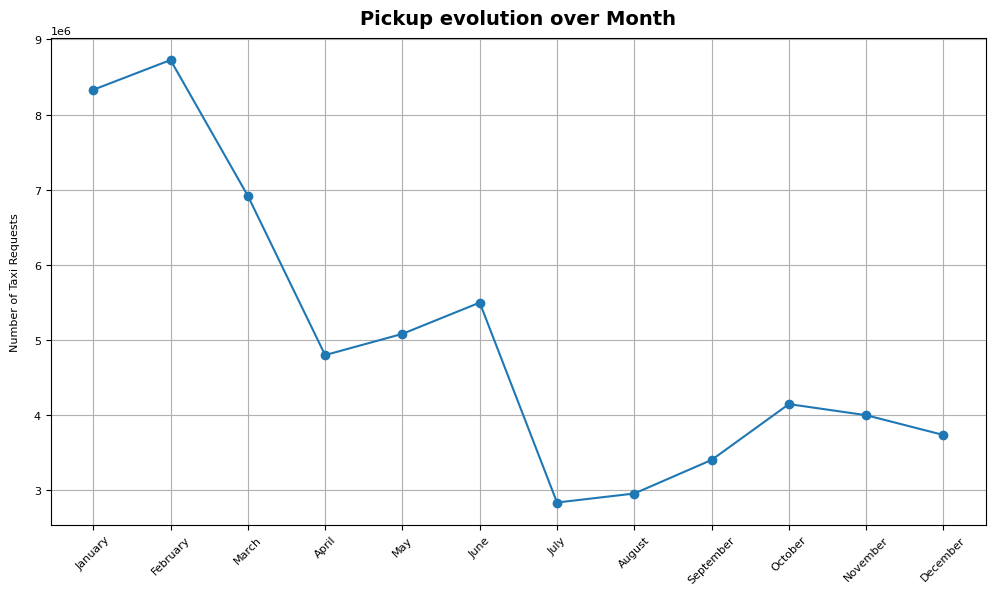

In [23]:
# Select the columns corresponding to taxi requests for each location ID
taxi_request_columns = manhattan_taxi.columns[7:74]

# Group the data by month and sum the taxi requests for each location, then sum across all locations
monthly_requests = manhattan_taxi.groupby('month')[taxi_request_columns].sum().sum(axis=1)

# Plot the data using a linear map
plt.figure(figsize=(10, 6))
plt.plot(monthly_requests.index, monthly_requests.values, marker='o')

plt.xticks(monthly_requests.index, ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'], rotation=45)
plt.ylabel('Number of Taxi Requests', labelpad=10)

plt.title('Pickup evolution over Month', fontsize=14, color='black', weight='bold', pad=10)
plt.grid(True)
plt.tight_layout()

plt.savefig('D:/UNI/Term 9/Project/Data/Figs/Month.png', dpi=300)
plt.savefig('D:/UNI/Term 9/Project/Data/Figs/Month.jpg', dpi=300)
plt.show()

### *As we can see, the most requests are related to the first two months, which are related to holidays like Christmas and then the start of working days, and the lowest amount is related to the months of July and August.*

-------------------------------------------------------------------------------------------------

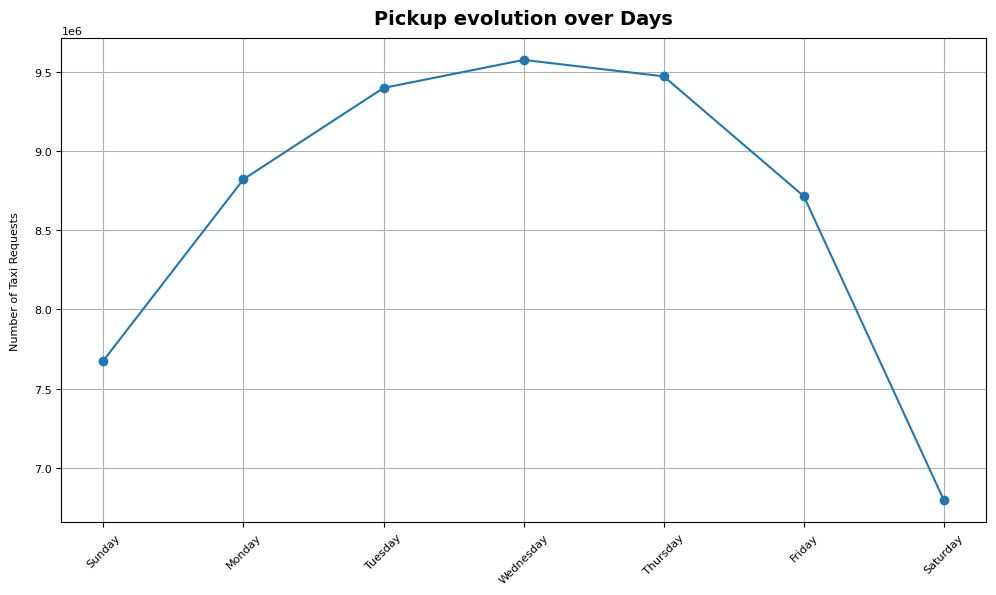

In [24]:
# Group the data by week and sum the taxi requests for each location, then sum across all locations
weekly_requests = manhattan_taxi.groupby('weekday')[taxi_request_columns].sum().sum(axis=1)

plt.figure(figsize=(10, 6))
plt.plot(weekly_requests.index, weekly_requests.values, marker='o')

plt.xticks(weekly_requests.index, ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday'], rotation=45)
plt.ylabel('Number of Taxi Requests', labelpad=10)

plt.title('Pickup evolution over Days', fontsize=14, color='black', weight='bold', pad=10)
plt.grid(True)
plt.tight_layout()

plt.savefig('D:/UNI/Term 9/Project/Data/Figs/Day.png', dpi=300)
plt.savefig('D:/UNI/Term 9/Project/Data/Figs/Day.jpg', dpi=300)
plt.show()

### *As we expected, the highest demand for taxis was in the middle of the week and the lowest demand was in the weekends.*

-------------------------------------------------------------------------------------------------

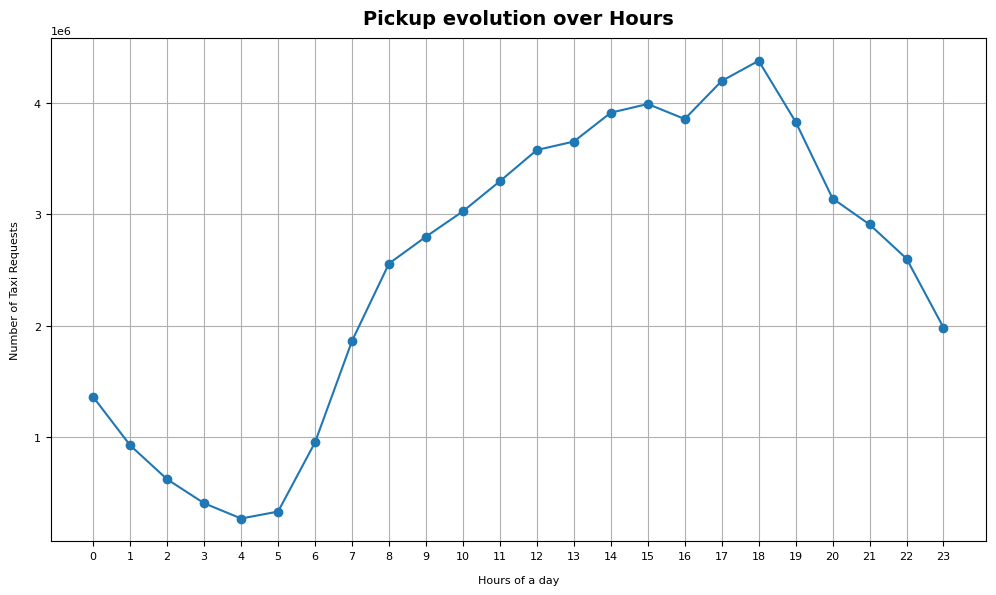

In [25]:
# Group the data by hour and sum the taxi requests for each location, then sum across all locations
hourly_requests = manhattan_taxi.groupby('hour')[taxi_request_columns].sum().sum(axis=1)

plt.figure(figsize=(10, 6))
plt.plot(hourly_requests.index, hourly_requests.values, marker='o')

plt.xticks(hourly_requests.index, [str(i) for i in range(24)])
plt.xlabel('Hours of a day', labelpad=10)
plt.ylabel('Number of Taxi Requests', labelpad=10)

plt.title('Pickup evolution over Hours', fontsize=14, color='black', weight='bold', pad=10)
plt.grid(True)
plt.tight_layout()

plt.savefig('D:/UNI/Term 9/Project/Data/Figs/Hour.png', dpi=300)
plt.savefig('D:/UNI/Term 9/Project/Data/Figs/Hour.jpg', dpi=300)
plt.show()

### *As you can see, the highest demand for taxis is at 18 and 19, which is obviously related to the vacation time of offices and other service centers, and the lowest demand is at 4 and 5, when people are naturally sleeping.*

### *Through the checks, we find that there are no Problem in the prepared dataset and the data looks reasonable.So with the checks done, we can add weather data to the dataset in the next step to complete the features.*

-------------------------------------------------------------------------------------------------

### <span style="color:green;">3.3 Weather data</span>

### *In this section, we enter the data related to New York's Central Park meteorological stations obtained through web scraping on the NOAA website and perform the necessary processing such as the specific time frame of the project and other things.*

In [26]:
df = pd.read_csv('D:/UNI/Term 9/Project/Data/new york_weather.csv')

df['datetime'] = pd.to_datetime(df['datetime'])

start_date = '2020-01-01 00:00:00'
end_date = '2022-06-30 23:59:59'

filtered_df = df[(df['datetime'] >= start_date) & (df['datetime'] <= end_date)]
filtered_df.set_index('datetime', inplace=True)
filtered_df

,name,temp,feelslike,dew,humidity,precip,precipprob,preciptype,snow,snowdepth,...,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,severerisk,conditions,icon,stations
datetime,,,,,,,,,,,,,,,,,,,,,
2020-01-01 00:00:00,new york,5.1,1.3,-2.3,58.68,0.0,0,NaN,0.0,0.0,...,1003.7,91.5,16.0,0.0,NaN,0,NaN,Overcast,cloudy,"72505394728,KEWR,KLGA,72502014734,KNYC,7250301..."
2020-01-01 01:00:00,new york,4.4,0.7,-3.2,57.83,0.0,0,NaN,0.0,0.0,...,1003.8,88.0,16.0,0.0,NaN,0,NaN,Partially cloudy,partly-cloudy-night,"72505394728,KEWR,KLGA,72502014734,KNYC,7250301..."
2020-01-01 02:00:00,new york,4.0,0.1,-2.7,61.40,0.0,0,NaN,0.0,0.0,...,1004.1,87.4,16.0,0.0,NaN,0,NaN,Partially cloudy,partly-cloudy-night,"72505394728,KEWR,KLGA,72502014734,KNYC,7250301..."
2020-01-01 03:00:00,new york,4.0,-0.5,-3.2,59.42,0.0,0,NaN,0.0,0.0,...,1004.5,59.3,16.0,0.0,NaN,0,NaN,Partially cloudy,partly-cloudy-night,"72505394728,KEWR,KLGA,72502014734,KNYC,7250301..."
2020-01-01 04:00:00,new york,3.9,-0.4,-4.3,55.18,0.0,0,NaN,0.0,0.0,...,1004.9,91.5,16.0,0.0,NaN,0,NaN,Overcast,cloudy,"72505394728,KEWR,KLGA,72502014734,KNYC,7250301..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-30 19:00:00,new york,28.3,28.0,13.8,41.06,0.0,0,NaN,0.0,0.0,...,1019.6,15.6,16.0,105.0,0.4,1,10.0,Clear,clear-day,"72505394728,KEWR,KLGA,72502014734,F1417,KNYC,7..."
2022-06-30 20:00:00,new york,26.9,27.0,13.8,44.43,0.0,0,NaN,0.0,0.0,...,1019.9,10.5,16.0,18.0,0.1,0,10.0,Clear,clear-day,"72505394728,KEWR,KLGA,72502014734,F1417,KNYC,7..."
2022-06-30 21:00:00,new york,25.6,25.6,16.0,55.43,0.0,0,NaN,0.0,0.0,...,1019.8,10.5,16.0,8.0,0.0,0,10.0,Clear,clear-night,"72505394728,KEWR,KLGA,72502014734,F1417,KNYC,7..."


### *For this project, only temperature, cloudcover and precipitation parameters can be suitable features, so we remove the rest of the columns.*

In [28]:
df_weather = filtered_df.iloc[:, [1, 5, 14]]
df_weather 

,temp,precip,cloudcover
datetime,,,
2020-01-01 00:00:00,5.1,0.0,91.5
2020-01-01 01:00:00,4.4,0.0,88.0
2020-01-01 02:00:00,4.0,0.0,87.4
2020-01-01 03:00:00,4.0,0.0,59.3
2020-01-01 04:00:00,3.9,0.0,91.5
...,...,...,...
2022-06-30 19:00:00,28.3,0.0,15.6
2022-06-30 20:00:00,26.9,0.0,10.5
2022-06-30 21:00:00,25.6,0.0,10.5


-------------------------------------------------------------------------------------------------

### *Finally, by combining this data with taxi data, the final dataset is prepared before feature extraction.*

In [29]:
manhattan_weather = df_weather
combined_df = pd.concat([manhattan_taxi, manhattan_weather], axis=1)

In [30]:
manhattan_clean = combined_df
manhattan_clean

,year,month,day,hour,weekday,weekend,holiday,LID_4,LID_12,LID_13,...,LID_244,LID_246,LID_249,LID_261,LID_262,LID_263,pop,temp,precip,cloudcover
datetime,,,,,,,,,,,,,,,,,,,,,
2020-01-01 00:00:00,2020.0,1.0,1.0,0.0,3.0,0.0,1.0,49.0,4.0,52.0,...,18.0,192.0,388.0,49.0,135.0,361.0,18480.0,5.1,0.0,91.5
2020-01-01 01:00:00,2020.0,1.0,1.0,1.0,3.0,0.0,0.0,101.0,4.0,63.0,...,44.0,222.0,253.0,49.0,132.0,438.0,20517.0,4.4,0.0,88.0
2020-01-01 02:00:00,2020.0,1.0,1.0,2.0,3.0,0.0,0.0,128.0,2.0,30.0,...,37.0,219.0,282.0,48.0,67.0,336.0,17652.0,4.0,0.0,87.4
2020-01-01 03:00:00,2020.0,1.0,1.0,3.0,3.0,0.0,0.0,89.0,1.0,10.0,...,26.0,233.0,344.0,29.0,39.0,216.0,12607.0,4.0,0.0,59.3
2020-01-01 04:00:00,2020.0,1.0,1.0,4.0,3.0,0.0,0.0,53.0,0.0,11.0,...,17.0,159.0,202.0,11.0,17.0,140.0,7899.0,3.9,0.0,91.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-30 19:00:00,2022.0,6.0,30.0,19.0,4.0,0.0,0.0,3.0,2.0,68.0,...,1.0,135.0,126.0,36.0,61.0,114.0,8304.0,28.3,0.0,15.6
2022-06-30 20:00:00,2022.0,6.0,30.0,20.0,4.0,0.0,0.0,4.0,2.0,41.0,...,3.0,98.0,144.0,27.0,45.0,96.0,6801.0,26.9,0.0,10.5
2022-06-30 21:00:00,2022.0,6.0,30.0,21.0,4.0,0.0,0.0,6.0,2.0,31.0,...,4.0,99.0,161.0,20.0,34.0,106.0,7293.0,25.6,0.0,10.5


In [31]:
manhattan_weather.to_csv('D:/UNI/Term 9/Project/Data/manhattan_weather.csv', index=True)
manhattan_clean.to_csv('D:/UNI/Term 9/Project/Data/manhattan_clean.csv', index=True)

In [32]:
manhattan_clean.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 21888 entries, 2020-01-01 00:00:00 to 2022-06-30 23:00:00
Freq: H
Data columns (total 78 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   year        21885 non-null  float64
 1   month       21885 non-null  float64
 2   day         21885 non-null  float64
 3   hour        21885 non-null  float64
 4   weekday     21885 non-null  float64
 5   weekend     21885 non-null  float64
 6   holiday     21885 non-null  float64
 7   LID_4       21885 non-null  float64
 8   LID_12      21885 non-null  float64
 9   LID_13      21885 non-null  float64
 10  LID_24      21885 non-null  float64
 11  LID_41      21885 non-null  float64
 12  LID_42      21885 non-null  float64
 13  LID_43      21885 non-null  float64
 14  LID_45      21885 non-null  float64
 15  LID_48      21885 non-null  float64
 16  LID_50      21885 non-null  float64
 17  LID_68      21885 non-null  float64
 18  LID_74      21885 non-n

-------------------------------------------------------------------------------------------------

### <span style="color:green;">3.4 Feature extraction</span>

### *In this section, we will analyze the features and create suitable features.*

### *First, we will have the general diagram of the relationship of the features with each other like Pairwise plot. Then we will check the correlation of the features with respect to the amount of taxi demand.*

In [34]:
df = manhattan_clean.copy()
df['total_demand'] = df.iloc[:, 7:74].sum(axis=1)
df

,year,month,day,hour,weekday,weekend,holiday,LID_4,LID_12,LID_13,...,LID_246,LID_249,LID_261,LID_262,LID_263,pop,temp,precip,cloudcover,total_demand
datetime,,,,,,,,,,,,,,,,,,,,,
2020-01-01 00:00:00,2020.0,1.0,1.0,0.0,3.0,0.0,1.0,49.0,4.0,52.0,...,192.0,388.0,49.0,135.0,361.0,18480.0,5.1,0.0,91.5,11368.0
2020-01-01 01:00:00,2020.0,1.0,1.0,1.0,3.0,0.0,0.0,101.0,4.0,63.0,...,222.0,253.0,49.0,132.0,438.0,20517.0,4.4,0.0,88.0,12583.0
2020-01-01 02:00:00,2020.0,1.0,1.0,2.0,3.0,0.0,0.0,128.0,2.0,30.0,...,219.0,282.0,48.0,67.0,336.0,17652.0,4.0,0.0,87.4,11061.0
2020-01-01 03:00:00,2020.0,1.0,1.0,3.0,3.0,0.0,0.0,89.0,1.0,10.0,...,233.0,344.0,29.0,39.0,216.0,12607.0,4.0,0.0,59.3,8004.0
2020-01-01 04:00:00,2020.0,1.0,1.0,4.0,3.0,0.0,0.0,53.0,0.0,11.0,...,159.0,202.0,11.0,17.0,140.0,7899.0,3.9,0.0,91.5,5003.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-30 19:00:00,2022.0,6.0,30.0,19.0,4.0,0.0,0.0,3.0,2.0,68.0,...,135.0,126.0,36.0,61.0,114.0,8304.0,28.3,0.0,15.6,6055.0
2022-06-30 20:00:00,2022.0,6.0,30.0,20.0,4.0,0.0,0.0,4.0,2.0,41.0,...,98.0,144.0,27.0,45.0,96.0,6801.0,26.9,0.0,10.5,4946.0
2022-06-30 21:00:00,2022.0,6.0,30.0,21.0,4.0,0.0,0.0,6.0,2.0,31.0,...,99.0,161.0,20.0,34.0,106.0,7293.0,25.6,0.0,10.5,5168.0


-------------------------------------------------------------------------------------------------

<Figure size 640x480 with 0 Axes>

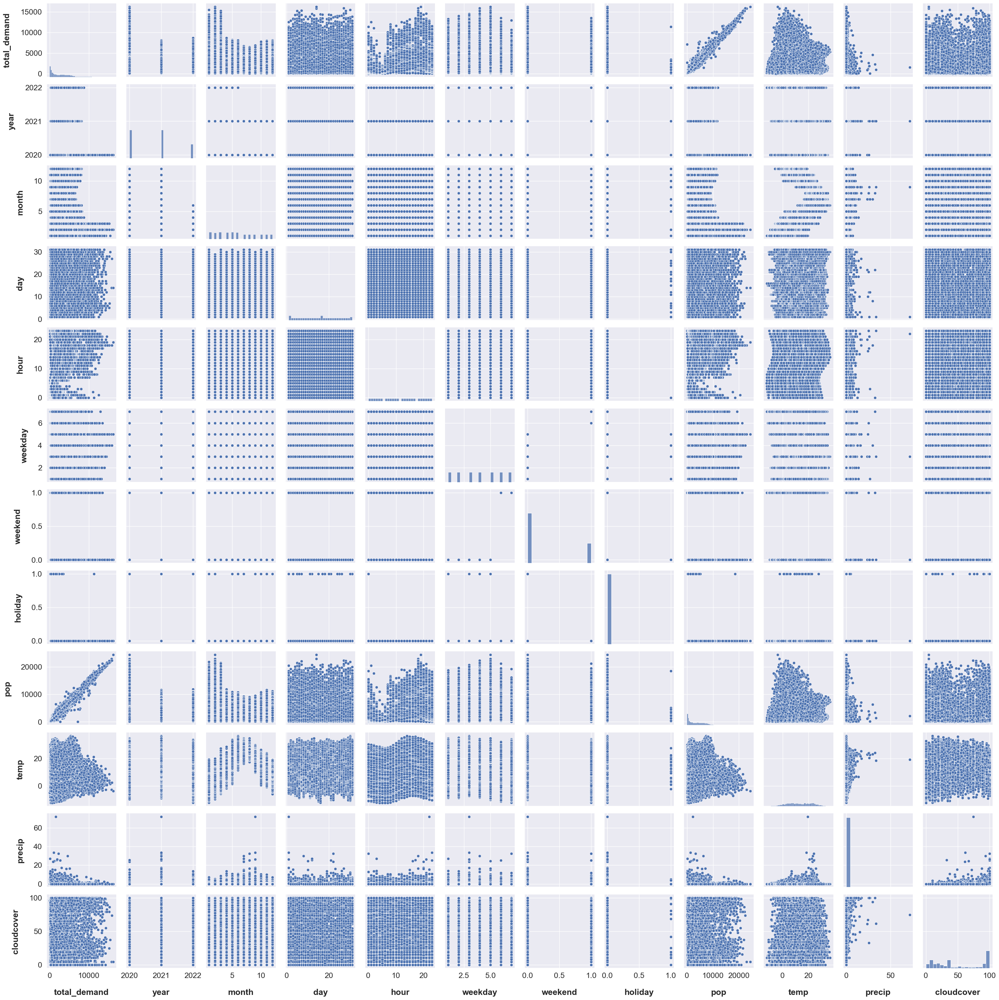

In [35]:
# Define the columns to be included in the pair plot
columns = ['total_demand', 'year', 'month', 'day', 'hour', 'weekday', 'weekend', 'holiday', 'pop', 'temp', 'precip', 'cloudcover']
df_to_plot = df[columns]

# Set the style and appearance for seaborn plots
sns.set(style="ticks", font_scale=1.5)
sns.set_style("darkgrid")

fig.patch.set_facecolor('lightgray')
plt.subplots_adjust(wspace=0.8, hspace=0.8)
g = sns.pairplot(df_to_plot)

for ax in g.axes.flatten():
    ax.set_xlabel(ax.get_xlabel(), labelpad=20, weight='bold')
    ax.set_ylabel(ax.get_ylabel(), labelpad=20, weight='bold')

plt.savefig('D:/UNI/Term 9/Project/Data/Figs/Pairwise.png', dpi=300)
plt.savefig('D:/UNI/Term 9/Project/Data/Figs/Pairwise.jpg', dpi=300)

plt.show()


-------------------------------------------------------------------------------------------------

### *We can use this diagram to understand the relationships between features to remove or change some features if necessary*

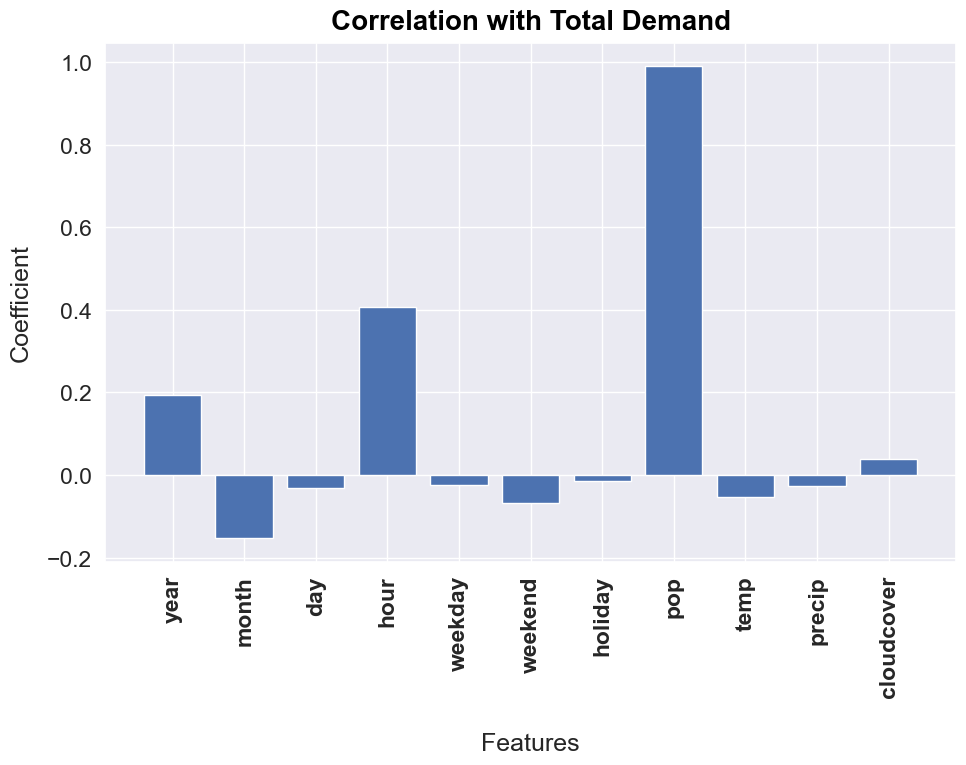

In [36]:
# Calculate the correlation of 'total_demand' with other columns
correlation = df[columns[1:] + ['total_demand']].corr().dropna(how='any')['total_demand'].drop('total_demand')

plt.figure(figsize=(10, 8))
plt.bar(correlation.index, correlation.values, width=0.8)
plt.title('Correlation with Total Demand', fontsize=20, color='black', weight='bold', pad=10)
plt.ylabel('Coefficient', labelpad=10)
plt.xlabel('Features', labelpad=25)
plt.xticks(weight='bold', rotation=90)
plt.tight_layout()

plt.savefig('D:/UNI/Term 9/Project/Data/Figs/Correlation.png', dpi=300)
plt.savefig('D:/UNI/Term 9/Project/Data/Figs/Correlation.jpg', dpi=300)
plt.show()

-------------------------------------------------------------------------------------------------

### *By analyzing the results of these two graphs and the previous statistical comparisons, as expected, we can find out :*

>*1. the characteristics of the population, hour and month had the greatest impact.*

>*2. the situations of cloudy and official holidays due to their small amount does not have much relationship with the number of taxi requests throughout the year.*

>*3. So we can ignore the characteristics of the day, since the days of the week have a greater impact, and also remove the parameters of rainfall and holidays.*

### *Now we will extract time features using the following class. This class encodes the year, month, day of the week and hour columns so that the values ​​of the attributes are the same.*

In [37]:
class feature_ext:
    """
    A class used to perform feature encoding on a DataFrame.

    Attributes:
    df (pd.DataFrame): The DataFrame containing the data to be encoded.

    Methods:
    hourly_encode():
        Encodes the 'hour' column into 24 binary columns, one for each hour of the day.

    weekday_encode():
        Encodes the 'weekday' column into 7 binary columns, one for each day of the week.

    monthly_encode():
        Encodes the 'month' column into 12 binary columns, one for each month of the year.

    year_encode():
        Encodes the 'year' column into binary columns for the years 2020, 2021, and 2022.

    final_dataframe():
        Returns the DataFrame with all the encoded features.
    """
    
    def __init__(self, df):
        self.df = df

    def hourly_encode(self):
        for i in range(24):
            self.df[f'H{i}'] = (self.df['hour'] == i).astype(int)
        return self
        
    def weekday_encode(self):
        for i in range(1, 8):
            self.df[f'D{i}'] = (self.df['weekday'] == i).astype(int)
        return self
        
    def monthly_encode(self):
        for i in range(1, 13):
            self.df[f'M{i}'] = (self.df['month'] == i).astype(int)
        return self

    def year_encode(self):
        for i in range(2020, 2023):
            self.df[f'Y{i-2019}'] = (self.df['year'] == i).astype(int)
        return self    

    def final_dataframe(self):
        return self.df


In [38]:
time = feature_ext(manhattan_clean)
manhattan_extract = (time.hourly_encode()
                         .weekday_encode()
                         .monthly_encode()
                         .year_encode() 
                         .final_dataframe())
manhattan_extract

,year,month,day,hour,weekday,weekend,holiday,LID_4,LID_12,LID_13,...,M6,M7,M8,M9,M10,M11,M12,Y1,Y2,Y3
datetime,,,,,,,,,,,,,,,,,,,,,
2020-01-01 00:00:00,2020.0,1.0,1.0,0.0,3.0,0.0,1.0,49.0,4.0,52.0,...,0,0,0,0,0,0,0,1,0,0
2020-01-01 01:00:00,2020.0,1.0,1.0,1.0,3.0,0.0,0.0,101.0,4.0,63.0,...,0,0,0,0,0,0,0,1,0,0
2020-01-01 02:00:00,2020.0,1.0,1.0,2.0,3.0,0.0,0.0,128.0,2.0,30.0,...,0,0,0,0,0,0,0,1,0,0
2020-01-01 03:00:00,2020.0,1.0,1.0,3.0,3.0,0.0,0.0,89.0,1.0,10.0,...,0,0,0,0,0,0,0,1,0,0
2020-01-01 04:00:00,2020.0,1.0,1.0,4.0,3.0,0.0,0.0,53.0,0.0,11.0,...,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-30 19:00:00,2022.0,6.0,30.0,19.0,4.0,0.0,0.0,3.0,2.0,68.0,...,1,0,0,0,0,0,0,0,0,1
2022-06-30 20:00:00,2022.0,6.0,30.0,20.0,4.0,0.0,0.0,4.0,2.0,41.0,...,1,0,0,0,0,0,0,0,0,1
2022-06-30 21:00:00,2022.0,6.0,30.0,21.0,4.0,0.0,0.0,6.0,2.0,31.0,...,1,0,0,0,0,0,0,0,0,1


-------------------------------------------------------------------------------------------------

### *Then, we delete the extra features from the dataset and sort the remaining columns so that the taxi demand columns are at the end of the dataset.*

In [42]:
cols = ['year', 'month', 'day', 'hour', 'weekday', 'cloudcover']	

# Drop the specified columns from the DataFrame
manhattan_extract.drop(cols, axis=1, inplace=True)

# Identify columns that start with 'LID_' (location IDs)
lid_columns = [col for col in manhattan_extract.columns if col.startswith('LID_')]

# Sort the location ID columns numerically
lid_sorted = sorted(lid_columns, key=lambda x: int(x.split('_')[1]))

# Define the desired order of columns for the final DataFrame
order = ['Y1', 'Y2', 'Y3',
         'M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'M10', 'M11', 'M12',
         'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7',
         'H0', 'H1', 'H2', 'H3', 'H4', 'H5', 'H6', 'H7', 'H8', 'H9', 'H10', 'H11', 'H12', 'H13', 'H14', 'H15', 'H16', 'H17', 'H18', 'H19', 'H20', 'H21', 'H22', 'H23',
         'weekend', 'holiday', 'precip', 'temp', 'pop'] + lid_sorted

manhattan_model = manhattan_extract[order]
manhattan_model


,Y1,Y2,Y3,M1,M2,M3,M4,M5,M6,M7,...,LID_237,LID_238,LID_239,LID_243,LID_244,LID_246,LID_249,LID_261,LID_262,LID_263
datetime,,,,,,,,,,,,,,,,,,,,,
2020-01-01 00:00:00,1,0,0,1,0,0,0,0,0,0,...,497.0,316.0,434.0,9.0,18.0,192.0,388.0,49.0,135.0,361.0
2020-01-01 01:00:00,1,0,0,1,0,0,0,0,0,0,...,462.0,275.0,448.0,15.0,44.0,222.0,253.0,49.0,132.0,438.0
2020-01-01 02:00:00,1,0,0,1,0,0,0,0,0,0,...,195.0,174.0,301.0,13.0,37.0,219.0,282.0,48.0,67.0,336.0
2020-01-01 03:00:00,1,0,0,1,0,0,0,0,0,0,...,85.0,85.0,130.0,7.0,26.0,233.0,344.0,29.0,39.0,216.0
2020-01-01 04:00:00,1,0,0,1,0,0,0,0,0,0,...,26.0,53.0,67.0,1.0,17.0,159.0,202.0,11.0,17.0,140.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-30 19:00:00,0,0,1,0,0,0,0,0,1,0,...,288.0,109.0,151.0,0.0,1.0,135.0,126.0,36.0,61.0,114.0
2022-06-30 20:00:00,0,0,1,0,0,0,0,0,1,0,...,236.0,79.0,147.0,2.0,3.0,98.0,144.0,27.0,45.0,96.0
2022-06-30 21:00:00,0,0,1,0,0,0,0,0,1,0,...,218.0,62.0,139.0,0.0,4.0,99.0,161.0,20.0,34.0,106.0


-------------------------------------------------------------------------------------------------

### *In the last step, we normalize the features which their values ​​should be between 0 and 1 like temperature and population.*

In [52]:
scaler = MinMaxScaler()
manhattan_model.iloc[:, 48:51] = scaler.fit_transform(manhattan_model.iloc[:, 48:51])
manhattan_model

,Y1,Y2,Y3,M1,M2,M3,M4,M5,M6,M7,...,LID_237,LID_238,LID_239,LID_243,LID_244,LID_246,LID_249,LID_261,LID_262,LID_263
datetime,,,,,,,,,,,,,,,,,,,,,
2020-01-01 00:00:00,1,0,0,1,0,0,0,0,0,0,...,497.0,316.0,434.0,9.0,18.0,192.0,388.0,49.0,135.0,361.0
2020-01-01 01:00:00,1,0,0,1,0,0,0,0,0,0,...,462.0,275.0,448.0,15.0,44.0,222.0,253.0,49.0,132.0,438.0
2020-01-01 02:00:00,1,0,0,1,0,0,0,0,0,0,...,195.0,174.0,301.0,13.0,37.0,219.0,282.0,48.0,67.0,336.0
2020-01-01 03:00:00,1,0,0,1,0,0,0,0,0,0,...,85.0,85.0,130.0,7.0,26.0,233.0,344.0,29.0,39.0,216.0
2020-01-01 04:00:00,1,0,0,1,0,0,0,0,0,0,...,26.0,53.0,67.0,1.0,17.0,159.0,202.0,11.0,17.0,140.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-30 19:00:00,0,0,1,0,0,0,0,0,1,0,...,288.0,109.0,151.0,0.0,1.0,135.0,126.0,36.0,61.0,114.0
2022-06-30 20:00:00,0,0,1,0,0,0,0,0,1,0,...,236.0,79.0,147.0,2.0,3.0,98.0,144.0,27.0,45.0,96.0
2022-06-30 21:00:00,0,0,1,0,0,0,0,0,1,0,...,218.0,62.0,139.0,0.0,4.0,99.0,161.0,20.0,34.0,106.0


-------------------------------------------------------------------------------------------------

In [53]:
manhattan_model.iloc[:, 48:51].describe()

,precip,temp,pop
count,21888.000000,21888.000000,21885.000000
mean,0.001965,0.523329,0.157074
std,0.014342,0.193534,0.149689
min,0.000000,0.000000,0.000000
25%,0.000000,0.370143,0.028947
50%,0.000000,0.519427,0.122298
75%,0.000000,0.689162,0.245496
max,1.000000,1.000000,1.000000


-------------------------------------------------------------------------------------------------

### *By doing this step, practically the dataset is completely prepared for machine learning models. But due to the inherent temporal nature of this project, only the final part remains, which is related to the conversion of the dataset into the time series format, which we will do in the next part.*

In [54]:
manhattan_model.to_csv('D:/UNI/Term 9/Project/Data/manhattan_model.csv', index=True)

In [55]:
del manhattan_model
del manhattan_extract
del manhattan_clean
del manhattan_weather
del manhattan_taxi
del gdf
del df

gc.collect()

24196

-------------------------------------------------------------------------------------------------

### <span style="color:green;">3.5 Time series dataset</span>

### *In this section, we need to create our training data and label based on the time step we determine. For this project, we have specified a time step of one week for training and one day for our label.*

### *Since the time interval of the dataset is 1 hour, we can consider the 168-hour gap for training and the next 24-hour gap for prediction, and we will produce the next arrays with 24-hour overlap and with the same process.*

In [3]:
manhattan_final = pd.read_csv("D:/UNI/Term 9/Project/Data/manhattan_model.csv", index_col=0, parse_dates=True, low_memory=False)

In [4]:
cols = ['Y1', 'Y2', 'Y3']	

manhattan_final.drop(cols, axis=1, inplace=True)
manhattan_final.dropna(inplace = True)
manhattan_final

,M1,M2,M3,M4,M5,M6,M7,M8,M9,M10,...,LID_237,LID_238,LID_239,LID_243,LID_244,LID_246,LID_249,LID_261,LID_262,LID_263
datetime,,,,,,,,,,,,,,,,,,,,,
2020-01-01 00:00:00,1,0,0,0,0,0,0,0,0,0,...,497.0,316.0,434.0,9.0,18.0,192.0,388.0,49.0,135.0,361.0
2020-01-01 01:00:00,1,0,0,0,0,0,0,0,0,0,...,462.0,275.0,448.0,15.0,44.0,222.0,253.0,49.0,132.0,438.0
2020-01-01 02:00:00,1,0,0,0,0,0,0,0,0,0,...,195.0,174.0,301.0,13.0,37.0,219.0,282.0,48.0,67.0,336.0
2020-01-01 03:00:00,1,0,0,0,0,0,0,0,0,0,...,85.0,85.0,130.0,7.0,26.0,233.0,344.0,29.0,39.0,216.0
2020-01-01 04:00:00,1,0,0,0,0,0,0,0,0,0,...,26.0,53.0,67.0,1.0,17.0,159.0,202.0,11.0,17.0,140.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-30 19:00:00,0,0,0,0,0,1,0,0,0,0,...,288.0,109.0,151.0,0.0,1.0,135.0,126.0,36.0,61.0,114.0
2022-06-30 20:00:00,0,0,0,0,0,1,0,0,0,0,...,236.0,79.0,147.0,2.0,3.0,98.0,144.0,27.0,45.0,96.0
2022-06-30 21:00:00,0,0,0,0,0,1,0,0,0,0,...,218.0,62.0,139.0,0.0,4.0,99.0,161.0,20.0,34.0,106.0


-------------------------------------------------------------------------------------------------

### *After some investigations, we realized that the taxi demand values ​​should also be normalized for better learning of the model in order to get a more accurate prediction.*

In [5]:
max_values = manhattan_final.iloc[:, -67:].max().tolist()

scaler = MinMaxScaler()
manhattan_final.iloc[:, -67:] = scaler.fit_transform(manhattan_final.iloc[:, -67:])

manhattan_final.to_csv('D:/UNI/Term 9/Project/manhattan_final.csv', index=True)
manhattan_final

,M1,M2,M3,M4,M5,M6,M7,M8,M9,M10,...,LID_237,LID_238,LID_239,LID_243,LID_244,LID_246,LID_249,LID_261,LID_262,LID_263
datetime,,,,,,,,,,,,,,,,,,,,,
2020-01-01 00:00:00,1,0,0,0,0,0,0,0,0,0,...,0.574566,0.634538,0.847656,0.600000,0.315789,0.354244,0.571429,0.355072,0.372928,0.824201
2020-01-01 01:00:00,1,0,0,0,0,0,0,0,0,0,...,0.534104,0.552209,0.875000,1.000000,0.771930,0.409594,0.372607,0.355072,0.364641,1.000000
2020-01-01 02:00:00,1,0,0,0,0,0,0,0,0,0,...,0.225434,0.349398,0.587891,0.866667,0.649123,0.404059,0.415317,0.347826,0.185083,0.767123
2020-01-01 03:00:00,1,0,0,0,0,0,0,0,0,0,...,0.098266,0.170683,0.253906,0.466667,0.456140,0.429889,0.506627,0.210145,0.107735,0.493151
2020-01-01 04:00:00,1,0,0,0,0,0,0,0,0,0,...,0.030058,0.106426,0.130859,0.066667,0.298246,0.293358,0.297496,0.079710,0.046961,0.319635
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-30 19:00:00,0,0,0,0,0,1,0,0,0,0,...,0.332948,0.218876,0.294922,0.000000,0.017544,0.249077,0.185567,0.260870,0.168508,0.260274
2022-06-30 20:00:00,0,0,0,0,0,1,0,0,0,0,...,0.272832,0.158635,0.287109,0.133333,0.052632,0.180812,0.212077,0.195652,0.124309,0.219178
2022-06-30 21:00:00,0,0,0,0,0,1,0,0,0,0,...,0.252023,0.124498,0.271484,0.000000,0.070175,0.182657,0.237113,0.144928,0.093923,0.242009


-------------------------------------------------------------------------------------------------

### *Now, we divide the dataset into 3 categories : training, validation, and tests.*

In [6]:
train = manhattan_final['2020-01-01':'2021-12-31']
val = manhattan_final['2022-01-01':'2022-03-31']
test = manhattan_final['2022-04-01':'2022-06-30']

In [7]:
dir = ['D:/UNI/Term 9/Project/Train', 'D:/UNI/Term 9/Project/Validation', 'D:/UNI/Term 9/Project/Test']

for d in dir:
    os.makedirs(d, exist_ok=True)
    os.makedirs(f'{d}/Input', exist_ok=True)
    os.makedirs(f'{d}/Label', exist_ok=True)

test

,M1,M2,M3,M4,M5,M6,M7,M8,M9,M10,...,LID_237,LID_238,LID_239,LID_243,LID_244,LID_246,LID_249,LID_261,LID_262,LID_263
datetime,,,,,,,,,,,,,,,,,,,,,
2022-04-01 00:00:00,0,0,0,1,0,0,0,0,0,0,...,0.099422,0.022088,0.058594,0.000000,0.017544,0.053506,0.270987,0.079710,0.008287,0.077626
2022-04-01 01:00:00,0,0,0,1,0,0,0,0,0,0,...,0.031214,0.006024,0.039062,0.000000,0.017544,0.027675,0.192931,0.050725,0.005525,0.070776
2022-04-01 02:00:00,0,0,0,1,0,0,0,0,0,0,...,0.013873,0.016064,0.015625,0.000000,0.000000,0.031365,0.119293,0.057971,0.008287,0.063927
2022-04-01 03:00:00,0,0,0,1,0,0,0,0,0,0,...,0.002312,0.008032,0.009766,0.000000,0.000000,0.011070,0.051546,0.007246,0.002762,0.027397
2022-04-01 04:00:00,0,0,0,1,0,0,0,0,0,0,...,0.008092,0.016064,0.007812,0.000000,0.000000,0.005535,0.019146,0.007246,0.013812,0.029680
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-30 19:00:00,0,0,0,0,0,1,0,0,0,0,...,0.332948,0.218876,0.294922,0.000000,0.017544,0.249077,0.185567,0.260870,0.168508,0.260274
2022-06-30 20:00:00,0,0,0,0,0,1,0,0,0,0,...,0.272832,0.158635,0.287109,0.133333,0.052632,0.180812,0.212077,0.195652,0.124309,0.219178
2022-06-30 21:00:00,0,0,0,0,0,1,0,0,0,0,...,0.252023,0.124498,0.271484,0.000000,0.070175,0.182657,0.237113,0.144928,0.093923,0.242009


-------------------------------------------------------------------------------------------------

### *Then we write a function to create Numpy arrays in the form of time series using data frames, and by storing them in the desired address, the data preparation process for the deep learning model  finally ends.*

In [8]:
def TimeSeries(data, time_step, forecast_step, main_folder):
    """
    Generates time series data for training and forecasting.

    Parameters:
    data (pd.DataFrame): The input DataFrame containing the time series data.
    time_step (int): The number of time steps to use for each input sequence.
    forecast_step (int): The number of time steps to forecast.
    main_folder (str): The main directory where the input and label files will be saved.

    Returns:
    None: This function saves the generated input and label arrays as .npy files in the specified directory.
    """

    print('\n')
    max_values_array = np.array(max_values)
    
    for i in tqdm(range(len(data) - time_step - forecast_step + 1), desc='Processing'):
        # Extract the input sequence for the current time step
        input_array = data.iloc[i:(i + time_step)].to_numpy().astype(np.float64)
        
        # Extract the label sequence for the forecast period and scale it by max values
        label_array = data.iloc[(i + time_step):(i + time_step + forecast_step), 48:].to_numpy().astype(np.float64)
        label_array = np.multiply(label_array, max_values_array.reshape(1, -1))
        
        # Define the file paths for saving the input and label arrays
        output_input = os.path.join(main_folder, "Input", f"i{i+1}.npy")
        output_label = os.path.join(main_folder, "Label", f"l{i+1}.npy")
        
        # Save the input and label arrays as .npy files
        np.save(output_input, input_array)
        np.save(output_label, label_array)


In [9]:
time_step = 168 
forecast_step = 1

TimeSeries(train, time_step, forecast_step, dir[0])
TimeSeries(val, time_step, forecast_step, dir[1])
TimeSeries(test, time_step, forecast_step, dir[2])

Processing: 100%|███████████████████████████████████████████████████████████████| 17374/17374 [00:56<00:00, 307.95it/s]


Processing: 100%|█████████████████████████████████████████████████████████████████| 1991/1991 [00:03<00:00, 503.20it/s]


Processing: 100%|█████████████████████████████████████████████████████████████████| 2016/2016 [00:03<00:00, 668.03it/s]


-------------------------------------------------------------------------------------------------

## <span style="color:green;">4. Data generator</span>

### *In this section, we must define a class to enter the data into the model in some Batch size to avoid allocate memory errors.*

In [9]:
class DataGenerator(Sequence):
    def __init__(self, input_dir, label_dir, batch_size=32, dim_input=(168, 115), dim_label=(1, 67), shuffle=True):
        # 'Initialization'
        self.dim_input = dim_input
        self.dim_label = dim_label
        self.batch_size = batch_size
        self.input_paths = [os.path.join(input_dir, f) for f in sorted(os.listdir(input_dir)) if f.startswith('i')]
        self.label_paths = [os.path.join(label_dir, f) for f in sorted(os.listdir(label_dir)) if f.startswith('l')]
        self.shuffle = shuffle
        self.on_epoch_end()

    def __len__(self):
        # 'Denotes the number of batches per epoch'
        return int(np.floor(len(self.input_paths) / self.batch_size))

    def __getitem__(self, index):
        # 'Generate one batch of data' and Generate indexes of the batch
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]

        # Find list of IDs
        input_temp_paths = [self.input_paths[k] for k in indexes]
        label_temp_paths = [self.label_paths[k] for k in indexes]

        # Generate data
        X, y = self.__data_generation(input_temp_paths, label_temp_paths)

        return X, y

    def on_epoch_end(self):
        # 'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.input_paths))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)

    def __data_generation(self, input_temp_paths, label_temp_paths):
        # 'Generates data containing batch_size samples'
        X = np.empty((self.batch_size, *self.dim_input), dtype = np.float32)
        y = np.empty((self.batch_size, *self.dim_label), dtype = np.float32)

        # Generate data
        for i, (input_path, label_path) in enumerate(zip(input_temp_paths, label_temp_paths)):
            # Store sample
            X[i,] = np.load(input_path)

            # Store label
            y[i,] = np.load(label_path)

        return X, y

In [10]:
rain_generator = DataGenerator(input_dir='D:/UNI/Term 9/Project/Train/Input', label_dir='D:/UNI/Term 9/Project/Train/Label')
val_generator = DataGenerator(input_dir='D:/UNI/Term 9/Project/Validation/Input', label_dir='D:/UNI/Term 9/Project/Validation/Label')
test_generator = DataGenerator(input_dir='D:/UNI/Term 9/Project/Test/Input', label_dir='D:/UNI/Term 9/Project/Test/Label')

In [11]:
batch_index = 1
sample_input, sample_label = test_generator.__getitem__(batch_index)

print('Shape of the input data for model :', sample_input.shape)
print('Shape of the input data for model :', sample_label.shape)

Shape of the input data for model : (32, 168, 115)
Shape of the input data for model : (32, 1, 67)


-------------------------------------------------------------------------------------------------

## <span style="color:green;">5. Model design</span>

### *In this step, we design the neural network model using CNN-LSTM layers and combined that with Multihead Attention mechanism.*

In [16]:
# Define the input shape and output shape for the model
input_shape = (168, 115)
output_shape = 67

# Input layer
input_layer = Input(shape=input_shape)

# First convolutional layer with dropout
conv1 = Conv1D(filters=128, kernel_size=3, activation='relu')(input_layer)
conv1 = Dropout(0.1)(conv1)

# Second convolutional layer with dropout and batch normalization
conv2 = Conv1D(filters=64, kernel_size=3, activation='relu')(conv1)
conv2 = Dropout(0.1)(conv2)
conv2 = BatchNormalization()(conv2)

# First bidirectional LSTM layer with dropout
lstm1 = Bidirectional(LSTM(128, return_sequences=True))(conv2)
lstm1 = Dropout(0.1)(lstm1)

# Second bidirectional LSTM layer with dropout
lstm2 = Bidirectional(LSTM(128, return_sequences=True))(lstm1)
lstm2 = Dropout(0.1)(lstm2)

# Third bidirectional LSTM layer with dropout and batch normalization
lstm3 = Bidirectional(LSTM(64, return_sequences=True))(lstm2)
lstm3 = Dropout(0.1)(lstm3)
lstm3 = BatchNormalization()(lstm3)

# Multi-head attention layer
multi_head = MultiHeadAttention(num_heads=2, key_dim=64)(lstm3, lstm3)

# Flatten the output from the multi-head attention layer
flat = Flatten()(multi_head)

# Dense layers with dropout
dense1 = Dense(256, activation='relu')(flat)
dense1 = Dropout(0.1)(dense1)
dense2 = Dense(128, activation='relu')(dense1)
dense2 = Dropout(0.1)(dense2)
dense3 = Dense(64, activation='relu')(dense2)

# Output layer with reshape
output_layer = Dense(output_shape, activation='relu')(dense3)
output = Reshape((1, 67))(output_layer)


### *First, for this basic model, we determine the default parameters such as batch size and Adam's optimization and compile it. Then we run it with 100 epochs on our training and validation data to obtain the initial accuracy of the architecture.*

In [17]:
# Create the model with the specified input and output layers
model = Model(inputs=input_layer, outputs=output)

# Define the optimizer and hyperparameters
optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)
early_stopping = EarlyStopping(monitor='val_loss', patience=100)
model_checkpoint = ModelCheckpoint('D:/UNI/Term 9/Project/Model/best_model.h5', verbose=1, save_best_only=True)

# Define evaluation metrics
rmse = RootMeanSquaredError(name='rmse')
msle = MeanSquaredLogarithmicError(name='msle')

# Compile the model with the specified optimizer, loss function, and metrics
model.compile(optimizer=optimizer, loss='mae', metrics=['mse', rmse, msle])
model.summary()


Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 168, 115)]   0                                            
__________________________________________________________________________________________________
conv1d_8 (Conv1D)               (None, 166, 128)     44288       input_5[0][0]                    
__________________________________________________________________________________________________
dropout_23 (Dropout)            (None, 166, 128)     0           conv1d_8[0][0]                   
__________________________________________________________________________________________________
conv1d_9 (Conv1D)               (None, 164, 64)      24640       dropout_23[0][0]                 
____________________________________________________________________________________________

In [18]:
history1 = model.fit(train_generator, epochs=100, validation_data=val_generator, callbacks=[early_stopping, model_checkpoint])

Epoch 1/100
271/271 [==============================] - 27s 85ms/step - loss: 29.0243 - mse: 3662.4106 - rmse: 60.5179 - msle: 3.2524 - val_loss: 38.9198 - val_mse: 4550.5312 - val_rmse: 67.4576 - val_msle: 2.4146

Epoch 00001: val_loss improved from inf to 38.91984, saving model to D:/UNI/Term 9/Project/Model\best_model.h5
Epoch 2/100
271/271 [==============================] - 21s 77ms/step - loss: 21.7113 - mse: 2026.5031 - rmse: 45.0167 - msle: 1.8524 - val_loss: 24.8744 - val_mse: 1951.5439 - val_rmse: 44.1763 - val_msle: 1.4307

Epoch 00002: val_loss improved from 38.91984 to 24.87436, saving model to D:/UNI/Term 9/Project/Model\best_model.h5
Epoch 3/100
271/271 [==============================] - 21s 78ms/step - loss: 15.6708 - mse: 1241.7913 - rmse: 35.2391 - msle: 1.2571 - val_loss: 16.5480 - val_mse: 1115.3964 - val_rmse: 33.3976 - val_msle: 1.0340

Epoch 00003: val_loss improved from 24.87436 to 16.54803, saving model to D:/UNI/Term 9/Project/Model\best_model.h5
Epoch 4/100
271

-------------------------------------------------------------------------------------------------

### *After running the model, we save it in the necessary formats and display the Loss chart and its evaluation metric to find the best epoch.*

In [19]:
np.save('D:/UNI/Term 9/Project/Model/best_model.npy', history1.history)

In [20]:
history = np.load('D:/UNI/Term 9/Project/Model/best_model.npy', allow_pickle='TRUE').item()

In [21]:
df = pd.DataFrame(history)
df.to_csv('D:/UNI/Term 9/Project/Model/best_model.csv')

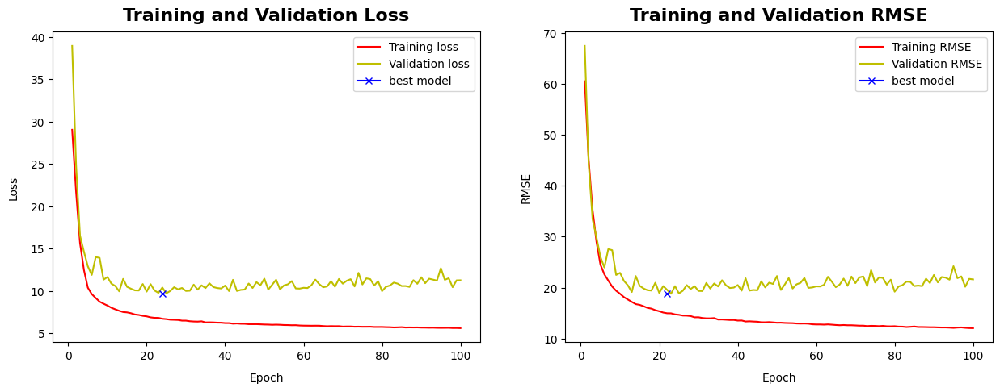

In [22]:
#training-validation loss curve
loss = history['loss']
val_loss = history['val_loss']
epochs = range(1, len(loss) + 1)

#training-validation accuracy curve
acc = history['rmse']
val_acc = history['val_rmse']

fig, axes = plt.subplots(1, 2, figsize=(15,5))

axes[0].plot(epochs, loss, 'r', label='Training loss')
axes[0].plot(epochs, val_loss, 'y', label='Validation loss')
axes[0].plot(np.argmin(history["val_loss"]), np.min(history["val_loss"]), marker="x", color="b", label="best model")
axes[0].set_title('Training and Validation Loss', fontsize=16, color='black', weight='bold', pad=10)
axes[0].set_xlabel('Epoch', labelpad=10)
axes[0].set_ylabel('Loss', labelpad=10)
axes[0].legend()
plt.savefig('D:/UNI/Term 9/Project/Data/Figs/Training_loss.png',dpi=300)

axes[1].plot(epochs, acc, 'r', label='Training RMSE')
axes[1].plot(epochs, val_acc, 'y', label='Validation RMSE')
axes[1].plot(np.argmin(history["val_rmse"]), np.min(history["val_rmse"]), marker="x", color="b", label="best model")
axes[1].set_title('Training and Validation RMSE', fontsize=16, color='black', weight='bold', pad=10)
axes[1].set_xlabel('Epoch', labelpad=10)
axes[1].set_ylabel('RMSE', labelpad=10)
axes[1].legend()

plt.savefig('D:/UNI/Term 9/Project/Data/Figs/Training_accuracies.png',dpi=300)
plt.show()

-------------------------------------------------------------------------------------------------

### <span style="color:green;">5.1 Hyperparameter Tuning</span>

### *before the final execution of the model, we go to the hyperparameter setting to find the most optimal state of the model. Before anything else, the batch size value was checked first, and initial testing was done between 16, 32, 64, and 128 modes. Based on the results obtained from the accuracy and execution time of the model in this test, the batch size of 64 is the best.*

### *In this optimization, the following items are checked.*

>*1. The number of convolutional layer filters*

>*2. Amount of random removal of neurons*

>*3. The number of neurons in the LSTM layers*

>*4. LSTM layer dropout value*

>*5. The numbecr of neurons in hidden or dense layers*

>*6. Output layer activation function*

>*7. Model optimizer for compilation*

In [23]:
class TaxiDemandHyperModel(HyperModel):
    """
    A class used to build and tune a neural network model for predicting taxi demand using hyperparameter optimization.

    Attributes:
    input_shape (tuple): The shape of the input data.
    output_shape (int): The shape of the output data.

    Methods:
    build(hp):
        Builds the neural network model with hyperparameters specified by the HyperParameters object.
    """
    
    def __init__(self, input_shape, output_shape):
        """
        Initializes the TaxiDemandHyperModel with the given input and output shapes.

        Parameters:
        input_shape (tuple): The shape of the input data.
        output_shape (int): The shape of the output data.
        """
        self.input_shape = input_shape
        self.output_shape = output_shape

    def build(self, hp):
        """
        Builds the neural network model with hyperparameters specified by the HyperParameters object.

        Parameters:
        hp (HyperParameters): The hyperparameters for tuning the model.

        Returns:
        Model: A compiled Keras model ready for training.
        """
        input_layer = Input(shape=self.input_shape)

        conv1 = Conv1D(
            filters=hp.Int('conv1_filters', min_value=128, max_value=256, step=64),
            kernel_size=3,
            activation=hp.Choice('conv1_activation', values=['relu']))(input_layer)
        conv1 = Dropout(0.1)(conv1)
        
        conv2 = Conv1D(
            filters=hp.Int('conv2_filters', min_value=64, max_value=128, step=64),
            kernel_size=3,
            activation=hp.Choice('conv2_activation', values=['relu']))(conv1)
        
        conv2 = Dropout(hp.Float('conv2_dropout', min_value=0.1, max_value=0.2, step=0.1))(conv2)
        conv2 = BatchNormalization()(conv2)

        lstm1 = Bidirectional(LSTM(hp.Int('lstm1_units', min_value=64, max_value=256, step=64), return_sequences=True))(conv2)
        lstm1 = Dropout(0.1)(lstm1)
        lstm2 = Bidirectional(LSTM(hp.Int('lstm2_units', min_value=64, max_value=256, step=64), return_sequences=True))(lstm1)
        lstm2 = Dropout(0.1)(lstm2)
        lstm3 = Bidirectional(LSTM(64, return_sequences=True))(lstm2)
        
        lstm3 = Dropout(hp.Float('lstm3_dropout', min_value=0.1, max_value=0.2, step=0.1))(lstm3)
        lstm3 = BatchNormalization()(lstm3)

        multi_head = MultiHeadAttention(num_heads=2, key_dim=64)(lstm3, lstm3)

        flat = Flatten()(multi_head)

        dense1 = Dense(hp.Int('dense1_units', min_value=128, max_value=256, step=128), activation='relu')(flat)
        dense1 = Dropout(0.1)(dense1)
        dense2 = Dense(hp.Int('dense2_units', min_value=64, max_value=128, step=64), activation='relu')(dense1)
        dense2 = Dropout(0.1)(dense2)
        dense3 = Dense(hp.Int('dense3_units', min_value=32, max_value=64, step=32), activation='relu')(dense2)

        output_layer = Dense(self.output_shape, activation=hp.Choice('output_activation', values=['relu', 'tanh', 'linear']))(dense3)
        output = Reshape((1, self.output_shape))(output_layer)
        
        model = Model(inputs=input_layer, outputs=output)

        optimizer = hp.Choice('optimizer', values=['adam', 'rmsprop', 'sgd'])
        model.compile(optimizer=optimizer, loss='mae', metrics=['mse', RootMeanSquaredError(name='rmse'), MeanSquaredLogarithmicError(name='msle')])

        return model


In [24]:
# Set up early stopping to monitor validation loss and stop training if it doesn't improve for 100 epochs
early_stopping1 = EarlyStopping(monitor='val_loss', patience=100)

# Initialize the hypermodel with the specified input and output shapes
hypermodel1 = TaxiDemandHyperModel(input_shape=(168, 115), output_shape=67)

# Set up the RandomSearch tuner for hyperparameter tuning
tuner1 = RandomSearch(
    hypermodel1,
    objective='val_loss',
    max_trials=72,
    executions_per_trial=1,
    directory='D:/UNI/Term 9/Project/Model/Tuner',
    project_name='parametr_tuning'
)

# Perform the hyperparameter search with the specified training and validation data, and early stopping callback
tuner1.search(train_generator, epochs=5, validation_data=val_generator, callbacks=[early_stopping1])


Trial 72 Complete [00h 02m 01s]
val_loss: 11.730659484863281

Best val_loss So Far: 9.132865905761719
Total elapsed time: 02h 19m 26s


-------------------------------------------------------------------------------------------------

### *After running the random search mode between parameters and after 72 models, the most optimal parameters were found, whose values ​​can be seen in the report below.*

In [25]:
tuner1.results_summary()

Results summary
Results in D:/UNI/Term 9/Project/Model/Tuner\parametr_tuning
Showing 10 best trials
Objective(name="val_loss", direction="min")

Trial 59 summary
Hyperparameters:
conv1_filters: 256
conv1_activation: relu
conv2_filters: 128
conv2_activation: relu
conv2_dropout: 0.2
lstm1_units: 256
lstm2_units: 128
lstm3_dropout: 0.2
dense1_units: 256
dense2_units: 64
dense3_units: 32
output_activation: relu
optimizer: adam
Score: 9.132865905761719

Trial 36 summary
Hyperparameters:
conv1_filters: 128
conv1_activation: relu
conv2_filters: 128
conv2_activation: relu
conv2_dropout: 0.1
lstm1_units: 256
lstm2_units: 192
lstm3_dropout: 0.2
dense1_units: 128
dense2_units: 64
dense3_units: 64
output_activation: linear
optimizer: rmsprop
Score: 9.564534187316895

Trial 06 summary
Hyperparameters:
conv1_filters: 256
conv1_activation: relu
conv2_filters: 128
conv2_activation: relu
conv2_dropout: 0.2
lstm1_units: 128
lstm2_units: 192
lstm3_dropout: 0.1
dense1_units: 128
dense2_units: 128
dense3_u

-------------------------------------------------------------------------------------------------

In [28]:
# Get the optimal hyperparameters
best_hps = tuner1.get_best_hyperparameters(num_trials=1)[0]

print(f"The best number of filters for conv1 ----------> {best_hps.get('conv1_filters')}")
print(f"The best number of filters for conv2 ----------> {best_hps.get('conv2_filters')}")
print(f"The best value for dropout_conv2 --------------> {best_hps.get('conv2_dropout')}")
print(f"The best number of units for lstm1 ------------> {best_hps.get('lstm1_units')}")
print(f"The best number of units for lstm2 ------------> {best_hps.get('lstm2_units')}")
print(f"The best value for dropout_lstm3 --------------> {best_hps.get('lstm3_dropout')}")
print(f"The best number of units for dense1 -----------> {best_hps.get('dense1_units')}")
print(f"The best number of units for dense2 -----------> {best_hps.get('dense2_units')}")
print(f"The best number of units for dense3 -----------> {best_hps.get('dense3_units')}")
print(f"The best activation for the output layer ------> {best_hps.get('output_activation')}")
print(f"The best optimizer ----------------------------> {best_hps.get('optimizer')}")

The best number of filters for conv1 ----------> 256
The best number of filters for conv2 ----------> 128
The best value for dropout_conv2 --------------> 0.2
The best number of units for lstm1 ------------> 256
The best number of units for lstm2 ------------> 128
The best value for dropout_lstm3 --------------> 0.2
The best number of units for dense1 -----------> 256
The best number of units for dense2 -----------> 64
The best number of units for dense3 -----------> 32
The best activation for the output layer ------> relu
The best optimizer ----------------------------> adam


-------------------------------------------------------------------------------------------------

### *Then, as before, we create the optimal model and compile it.*

In [29]:
early_stopping2 = EarlyStopping(monitor='val_loss', patience=50)
model_checkpoint2 = ModelCheckpoint('D:/UNI/Term 9/Project/Model/opt_model.h5', verbose =1, save_best_only=True)

model_opt = tuner1.hypermodel.build(best_hps)
model_opt.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 168, 115)]   0                                            
__________________________________________________________________________________________________
conv1d_2 (Conv1D)               (None, 166, 256)     88576       input_2[0][0]                    
__________________________________________________________________________________________________
dropout_7 (Dropout)             (None, 166, 256)     0           conv1d_2[0][0]                   
__________________________________________________________________________________________________
conv1d_3 (Conv1D)               (None, 164, 128)     98432       dropout_7[0][0]                  
____________________________________________________________________________________________

### *To check and compare the activation functions, we run the model with 3 states of Adam, SGD and RMSprop and plot its Loss diagram.*

Epoch 1/10
271/271 [==============================] - 31s 94ms/step - loss: 20.6750 - rmse: 45.1685 - val_loss: 28.6348 - val_rmse: 52.5916
Epoch 2/10
271/271 [==============================] - 25s 90ms/step - loss: 13.0318 - rmse: 32.4200 - val_loss: 15.6660 - val_rmse: 33.4692
Epoch 3/10
271/271 [==============================] - 25s 93ms/step - loss: 11.7467 - rmse: 29.6252 - val_loss: 14.1969 - val_rmse: 29.8797
Epoch 4/10
271/271 [==============================] - 25s 93ms/step - loss: 11.2422 - rmse: 28.5420 - val_loss: 13.6647 - val_rmse: 29.9605
Epoch 5/10
271/271 [==============================] - 24s 90ms/step - loss: 10.5333 - rmse: 27.3505 - val_loss: 22.2347 - val_rmse: 45.8342
Epoch 6/10
271/271 [==============================] - 24s 88ms/step - loss: 10.0649 - rmse: 26.5521 - val_loss: 16.3358 - val_rmse: 34.4164
Epoch 7/10
271/271 [==============================] - 25s 91ms/step - loss: 9.7683 - rmse: 26.0966 - val_loss: 14.0481 - val_rmse: 30.9893
Epoch 8/10
271/271 [=

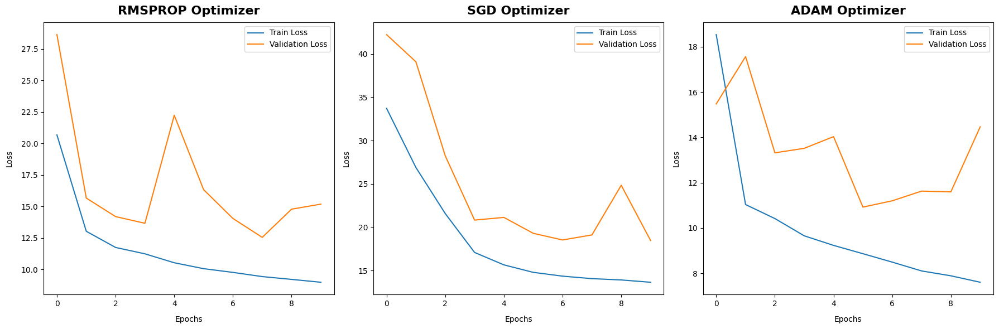

In [30]:
optimizers = ['rmsprop', 'sgd', 'adam']

# Early stopping callback to monitor validation loss and stop training if it doesn't improve for 10 epochs
early_stopping3 = EarlyStopping(monitor='val_loss', patience=10)

plt.figure(figsize=(18, 6))

# Loop through each optimizer and train the model
for i, opt in enumerate(optimizers, 1):
    # Build and compile the model with the current optimizer
    model_opt1 = tuner1.hypermodel.build(best_hps)
    model_opt1.compile(optimizer=opt, loss='mae', metrics=[rmse])
    
    # Train the model and store the training history
    history_opt1 = model_opt1.fit(train_generator, epochs=10, validation_data=val_generator, callbacks=[early_stopping3])
    
    # Create a subplot for the current optimizer
    plt.subplot(1, 3, i)
    plt.plot(history_opt1.history['loss'], label='Train Loss')
    plt.plot(history_opt1.history['val_loss'], label='Validation Loss')
    plt.title(f'{opt.upper()} Optimizer', fontsize=16, color='black', weight='bold', pad=10)
    plt.xlabel('Epochs', labelpad=10)
    plt.ylabel('Loss', labelpad=10)
    plt.legend()
    print('\n')
    
print('----------------------------------------------------------------------------------------------------------------------\n')

plt.savefig('D:/UNI/Term 9/Project/Data/Figs/Optimizers.png', dpi=300)
plt.subplots_adjust(wspace=0.2)
plt.tight_layout()
plt.show()


-------------------------------------------------------------------------------------------------

### *As expected, Adam's model had less error from the beginning and the convergence of the model happened more smoothly.*

In [31]:
model_opt.compile(optimizer=opt, loss='mae', metrics=['mse', rmse, msle])

history2 = model_opt.fit(train_generator, epochs=100, validation_data=val_generator, callbacks=[early_stopping2, model_checkpoint2])

Epoch 1/100
271/271 [==============================] - 28s 88ms/step - loss: 20.6324 - mse: 2121.8503 - rmse: 44.4839 - msle: 1.5786 - val_loss: 17.1518 - val_mse: 1176.0361 - val_rmse: 34.2934 - val_msle: 0.6874

Epoch 00001: val_loss improved from inf to 17.15179, saving model to D:/UNI/Term 9/Project/Model\opt_model.h5
Epoch 2/100
271/271 [==============================] - 23s 84ms/step - loss: 12.8681 - mse: 924.4101 - rmse: 30.4041 - msle: 0.6305 - val_loss: 26.2919 - val_mse: 2254.7229 - val_rmse: 47.4839 - val_msle: 0.8145

Epoch 00002: val_loss did not improve from 17.15179
Epoch 3/100
271/271 [==============================] - 23s 86ms/step - loss: 11.4502 - mse: 716.9648 - rmse: 26.7762 - msle: 0.4713 - val_loss: 13.3298 - val_mse: 708.6223 - val_rmse: 26.6200 - val_msle: 0.3691

Epoch 00003: val_loss improved from 17.15179 to 13.32980, saving model to D:/UNI/Term 9/Project/Model\opt_model.h5
Epoch 4/100
271/271 [==============================] - 23s 85ms/step - loss: 9.7073 

-------------------------------------------------------------------------------------------------

### *Now we save the final trained model, which has a better accuracy than the initial model, and display its Los and RMSE charts.*

In [32]:
np.save('D:/UNI/Term 9/Project/Model/opt_model.npy', history2.history)

In [33]:
history3 = np.load('D:/UNI/Term 9/Project/Model/opt_model.npy', allow_pickle='TRUE').item()

In [34]:
df = pd.DataFrame(history3)
df.to_csv('D:/UNI/Term 9/Project/Model/opt_model.csv')

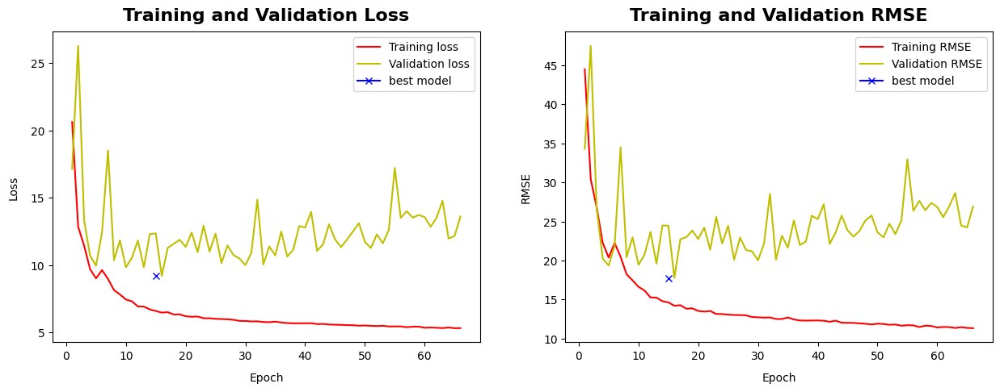

In [35]:
#training-validation loss curve
loss = history3['loss']
val_loss = history3['val_loss']
epochs = range(1, len(loss) + 1)

#training-validation accuracy curve
acc = history3['rmse']
val_acc = history3['val_rmse']

fig, axes = plt.subplots(1, 2, figsize=(15,5))

axes[0].plot(epochs, loss, 'r', label='Training loss')
axes[0].plot(epochs, val_loss, 'y', label='Validation loss')
axes[0].plot(np.argmin(history3["val_loss"]), np.min(history3["val_loss"]), marker="x", color="b", label="best model")
axes[0].set_title('Training and Validation Loss', fontsize=16, color='black', weight='bold', pad=10)
axes[0].set_xlabel('Epoch', labelpad=10)
axes[0].set_ylabel('Loss', labelpad=10)
axes[0].legend()
plt.savefig('D:/UNI/Term 9/Project/Data/Figs/Training_loss_opt.png',dpi=300)

axes[1].plot(epochs, acc, 'r', label='Training RMSE')
axes[1].plot(epochs, val_acc, 'y', label='Validation RMSE')
axes[1].plot(np.argmin(history3["val_rmse"]), np.min(history3["val_rmse"]), marker="x", color="b", label="best model")
axes[1].set_title('Training and Validation RMSE', fontsize=16, color='black', weight='bold', pad=10)
axes[1].set_xlabel('Epoch', labelpad=10)
axes[1].set_ylabel('RMSE', labelpad=10)
axes[1].legend()

plt.savefig('D:/UNI/Term 9/Project/Data/Figs/Training_rmse_opt.png',dpi=300)
plt.show()

-------------------------------------------------------------------------------------------------

## <span style="color:green;">6. Evaluation</span>

### *In this step, we load the models from the previous step and run them on our test data to get the real accuracy of the model.*

In [12]:
MyModel = load_model('D:/UNI/Term 9/Project/Model/opt_model.h5')

In [13]:
label_pred = MyModel.predict(test_generator)

In [14]:
MyModel.evaluate(test_generator)

63/63 [==============================] - 3s 31ms/step - loss: 9.7939 - mse: 327.5211 - rmse: 18.0975 - msle: 0.1845


[9.793886184692383, 327.5211486816406, 18.09754180908203, 0.1845143735408783]

-------------------------------------------------------------------------------------------------

In [15]:
MyModel1 = load_model('D:/UNI/Term 9/Project/Model/best_model.h5')
label_pred1 = MyModel1.predict(test_generator)
MyModel1.evaluate(test_generator)

63/63 [==============================] - 3s 31ms/step - loss: 11.2077 - mse: 415.0338 - rmse: 20.3724 - msle: 0.5004


[11.207698822021484, 415.0338439941406, 20.372377395629883, 0.5003563165664673]

-------------------------------------------------------------------------------------------------

### *As we see. The optimized model has better results in all the criteria of MSE, RMSE and MSLE.*

In [4]:
df = pd.read_csv('D:/UNI/Term 9/Project/Data/manhattan_model.csv', index_col=0, parse_dates=True, low_memory=False)
test = df['2022-04-08':'2022-06-30'].iloc[:, -67:]
test

,LID_4,LID_12,LID_13,LID_24,LID_41,LID_42,LID_43,LID_45,LID_48,LID_50,...,LID_237,LID_238,LID_239,LID_243,LID_244,LID_246,LID_249,LID_261,LID_262,LID_263
datetime,,,,,,,,,,,,,,,,,,,,,
2022-04-08 00:00:00,6.0,1.0,2.0,6.0,7.0,1.0,12.0,3.0,141.0,24.0,...,70.0,8.0,31.0,0.0,0.0,35.0,138.0,5.0,8.0,30.0
2022-04-08 01:00:00,1.0,0.0,2.0,0.0,5.0,2.0,3.0,3.0,102.0,13.0,...,23.0,5.0,12.0,0.0,0.0,21.0,117.0,4.0,0.0,33.0
2022-04-08 02:00:00,2.0,0.0,0.0,0.0,2.0,0.0,3.0,1.0,77.0,15.0,...,7.0,2.0,3.0,0.0,1.0,11.0,58.0,3.0,1.0,14.0
2022-04-08 03:00:00,0.0,0.0,1.0,0.0,1.0,0.0,0.0,2.0,47.0,10.0,...,4.0,3.0,3.0,0.0,0.0,12.0,37.0,0.0,0.0,7.0
2022-04-08 04:00:00,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,31.0,5.0,...,5.0,4.0,4.0,0.0,0.0,3.0,4.0,3.0,4.0,13.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-30 19:00:00,3.0,2.0,68.0,11.0,9.0,1.0,91.0,7.0,175.0,47.0,...,288.0,109.0,151.0,0.0,1.0,135.0,126.0,36.0,61.0,114.0
2022-06-30 20:00:00,4.0,2.0,41.0,9.0,10.0,2.0,67.0,8.0,187.0,22.0,...,236.0,79.0,147.0,2.0,3.0,98.0,144.0,27.0,45.0,96.0
2022-06-30 21:00:00,6.0,2.0,31.0,12.0,13.0,4.0,106.0,6.0,227.0,42.0,...,218.0,62.0,139.0,0.0,4.0,99.0,161.0,20.0,34.0,106.0


### *Now, to compare the actual and predicted values ​​intuitively and more accurately, we make changes in the data.*

In [5]:
test_pred = test.copy()

In [15]:
reshaped_label = label_pred.reshape(-1, np.prod(label_pred.shape[1:]))
reshaped_label.shape

(2016, 67)

-------------------------------------------------------------------------------------------------

In [16]:
test_pred.loc[:, :] = 0
test_pred.values[:] = reshaped_label

In [17]:
test_pred = np.ceil(test_pred)
test_pred

,LID_4,LID_12,LID_13,LID_24,LID_41,LID_42,LID_43,LID_45,LID_48,LID_50,...,LID_237,LID_238,LID_239,LID_243,LID_244,LID_246,LID_249,LID_261,LID_262,LID_263
datetime,,,,,,,,,,,,,,,,,,,,,
2022-04-08 00:00:00,3.0,0.0,41.0,13.0,10.0,4.0,83.0,7.0,142.0,31.0,...,294.0,100.0,145.0,0.0,2.0,96.0,95.0,29.0,46.0,92.0
2022-04-08 01:00:00,3.0,0.0,36.0,20.0,16.0,6.0,150.0,8.0,111.0,38.0,...,419.0,154.0,202.0,0.0,5.0,87.0,75.0,31.0,91.0,118.0
2022-04-08 02:00:00,4.0,0.0,19.0,12.0,11.0,3.0,56.0,6.0,149.0,27.0,...,141.0,72.0,112.0,0.0,3.0,56.0,116.0,18.0,35.0,88.0
2022-04-08 03:00:00,1.0,0.0,0.0,1.0,2.0,1.0,1.0,1.0,44.0,6.0,...,5.0,5.0,7.0,0.0,1.0,8.0,39.0,2.0,0.0,15.0
2022-04-08 04:00:00,9.0,0.0,35.0,15.0,15.0,5.0,83.0,8.0,210.0,45.0,...,256.0,104.0,171.0,0.0,3.0,87.0,197.0,26.0,52.0,140.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-30 19:00:00,3.0,0.0,18.0,17.0,17.0,7.0,47.0,2.0,95.0,26.0,...,109.0,96.0,102.0,0.0,4.0,25.0,40.0,10.0,70.0,86.0
2022-06-30 20:00:00,0.0,0.0,0.0,1.0,2.0,1.0,2.0,0.0,29.0,4.0,...,2.0,4.0,4.0,0.0,0.0,6.0,24.0,2.0,0.0,10.0
2022-06-30 21:00:00,4.0,0.0,34.0,18.0,12.0,5.0,95.0,5.0,123.0,38.0,...,295.0,128.0,150.0,0.0,4.0,61.0,67.0,21.0,105.0,111.0


### *For the last evaluation, we implement the MAE metric as a percentage to calculate the prediction accuracy of the model in total and find out how close the forecasted data is to the actual data..*

In [18]:
# Calculate the Mean Absolute Error (MAE) between the actual and predicted values
mae = mean_absolute_error(test.values.flatten(), test_pred.values.flatten())

# Find the maximum and minimum values in the actual data
max_value = test.max().max()
min_value = test.min().min()

# Scale the MAE by the range of the actual data
scaled_mae = mae / (max_value - min_value)
match_percentage = (1 - scaled_mae) * 100

print("Percentage of match between actual and predicted data: {:.2f}%".format(match_percentage))


Percentage of match between actual and predicted data: 92.86%


-------------------------------------------------------------------------------------------------

### *As a first visual comparison, for 5 random one-hour periods and 30 regions with different demand distributions, we display the graph of actual and predicted values.*

In [65]:
dates_18 = test.between_time('18:00', '18:59').index.date
unique_dates = np.unique(dates_18)
selected_dates = np.random.choice(unique_dates, 5, replace=False)
selected_col = np.random.choice(test.columns, 30, replace=False)

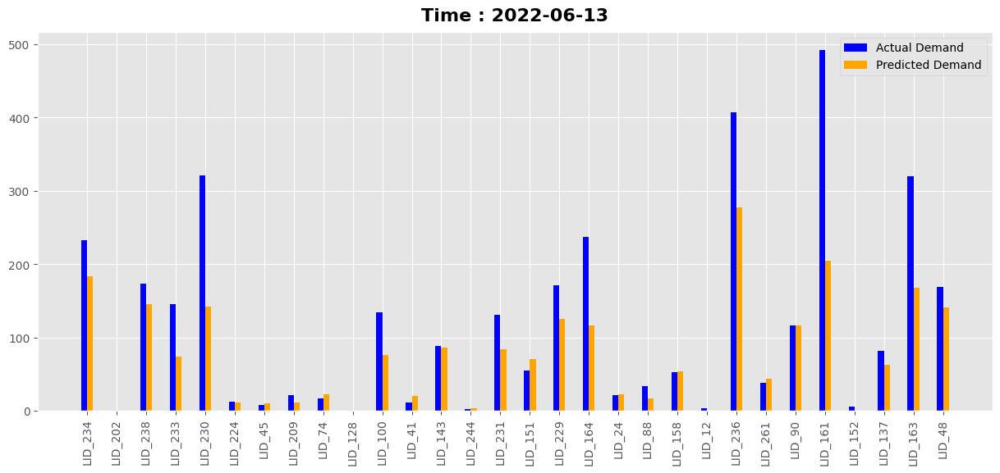

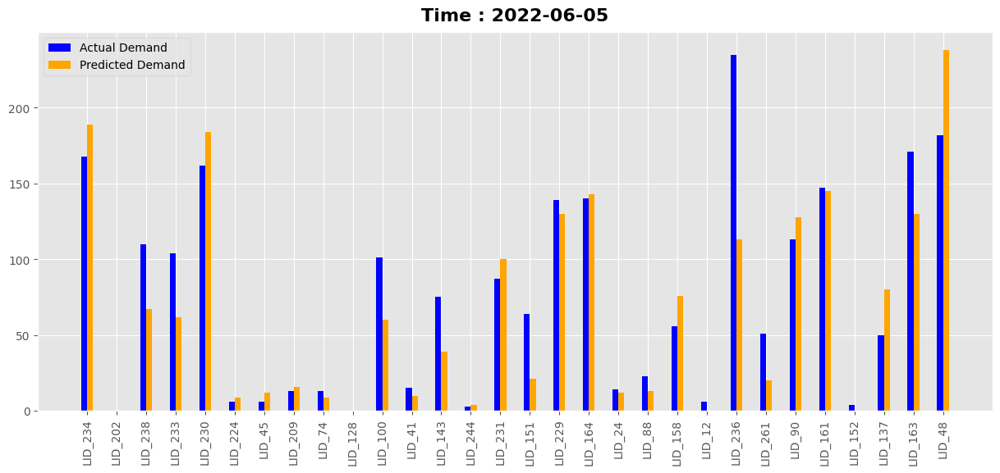

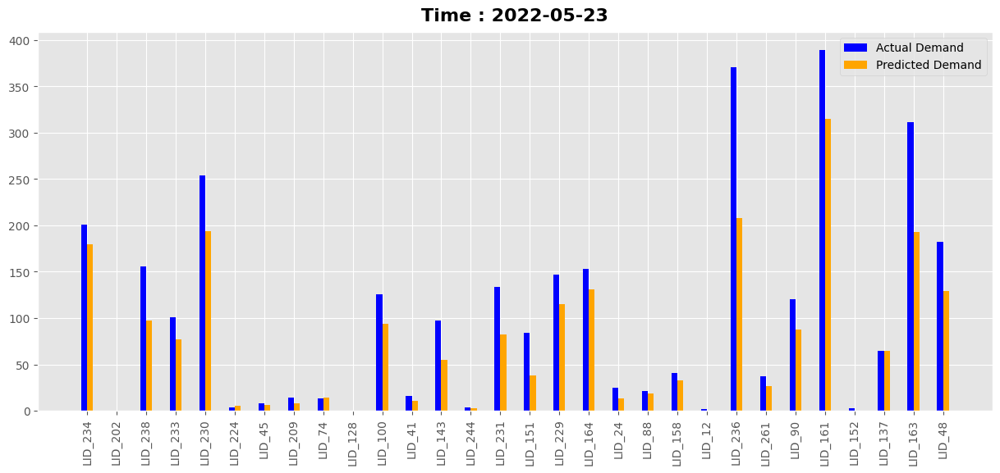

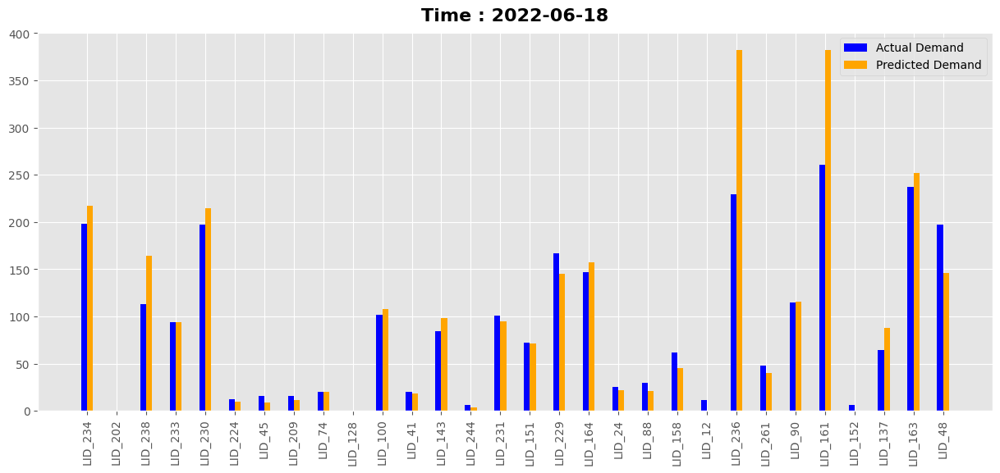

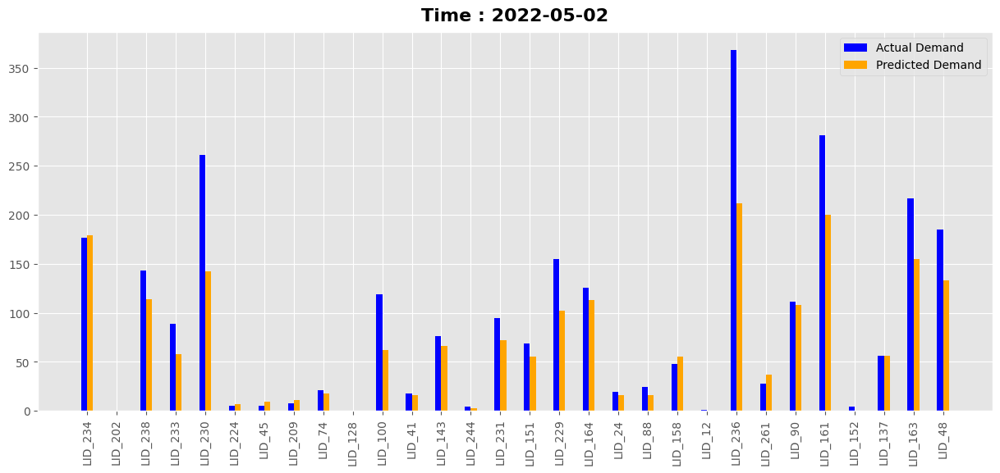

In [66]:
# Set the plot style to 'ggplot'
plt.style.use('ggplot')

# Loop through each selected date
for date in selected_dates:
    fig, ax = plt.subplots(figsize=(15, 6))
    
    # Extract actual and predicted demand data for the specified time
    data1 = test.loc[str(date) + ' 18', selected_col]
    data2 = test_pred.loc[str(date) + ' 18', selected_col]

    # Plot the actual demand as blue bars
    ax.bar(np.arange(len(data1)) - 0.1, data1, width=0.2, label='Actual Demand', color='blue')
    
    # Plot the predicted demand as orange bars
    ax.bar(np.arange(len(data2)) + 0.1, data2, width=0.2, label='Predicted Demand', color='orange')

    ax.set_title(f'Time : {date.strftime("%Y-%m-%d")}', fontsize=16, color='black', weight='bold', pad=10)
    ax.set_xticks(np.arange(len(data1)))
    ax.set_xticklabels(selected_col, rotation=90)
    ax.legend() 
    fig.savefig(f'D:/UNI/Term 9/Project/Data/Figs/Time_{date.strftime("%Y-%m-%d")}_18.png')
    
    plt.show()


-------------------------------------------------------------------------------------------------

### *Based on the graphs, it can be seen that the model has understood the request pattern well, but in some areas, due to the lack of data, the model's prediction accuracy has decreased.*

### *For the second comparison, we have selected 5 regions that had a relatively high number of requests and displayed their forecasted requests for the last week in a time series to check the pattern of the amount of demand in the entire time period of the dataset test.*

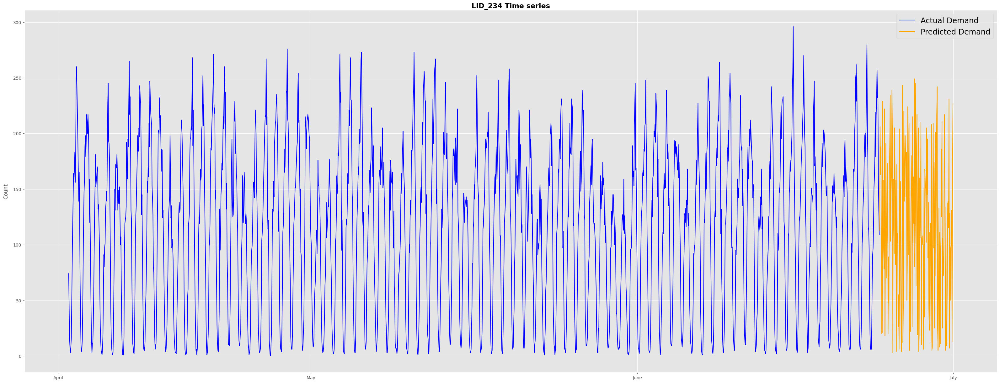

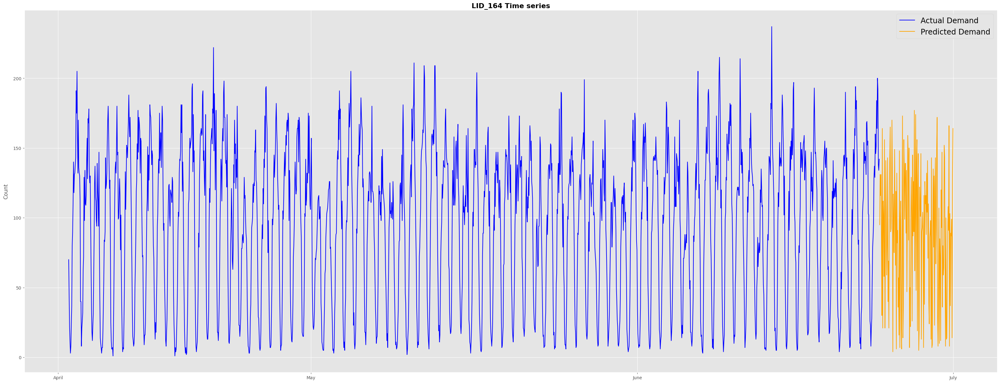

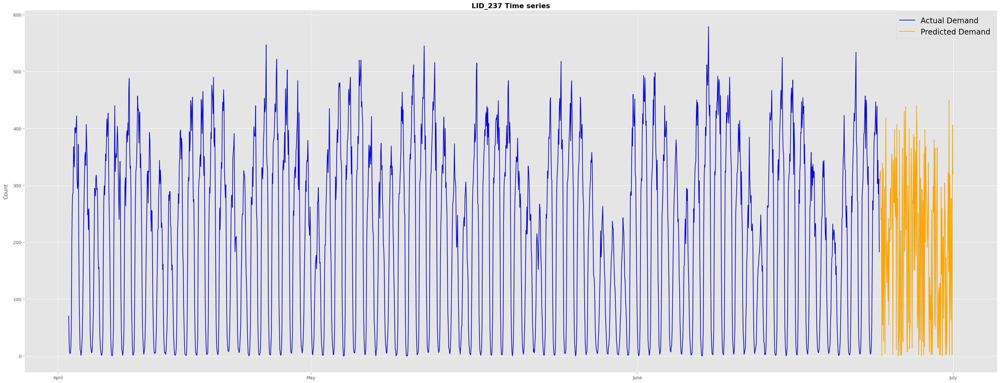

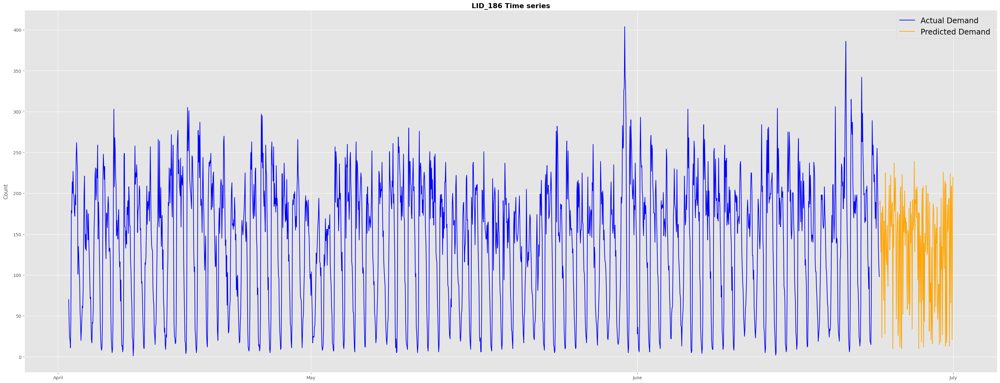

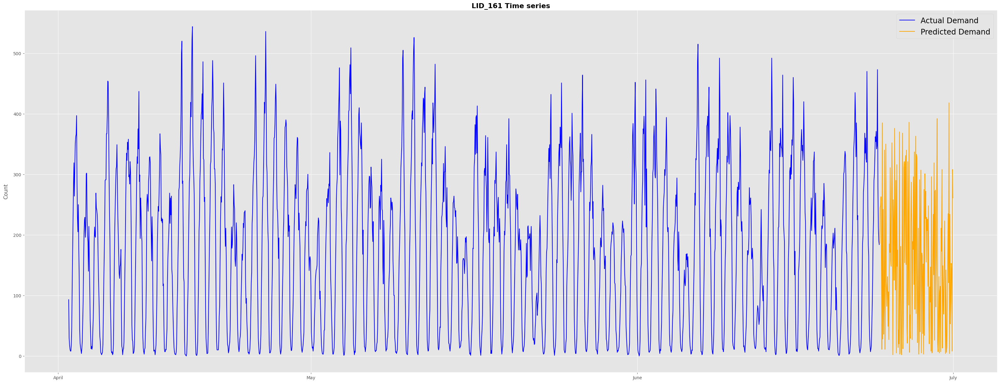

In [86]:
# List of columns to plot
columns_list = ['LID_234', 'LID_164', 'LID_237', 'LID_186', 'LID_161']

# Loop through each column in the list
for column in columns_list:
    fig, ax = plt.subplots(figsize=(40, 15))
    
    # Plot the actual demand data
    ax.plot(test.index[:-168], test[column][:-168], label='Actual Demand', color='blue')
    
    # Plot the predicted demand data
    ax.plot(test.index[-168:], test_pred[column][-168:], label='Predicted Demand', color='orange')
    
    # Set the x-axis to display months
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%B'))
    
    # Add a specific date to the x-ticks
    existing_xticks = list(ax.get_xticks())
    existing_xticklabels = [tick.get_text() for tick in ax.get_xticklabels()]
    new_xticks = [mdates.date2num(datetime(2022, 4, 7))] + existing_xticks
    new_xticklabels = ['April'] + existing_xticklabels
    
    ax.set_xticks(new_xticks)
    ax.set_xticklabels(new_xticklabels)
    ax.set_title(f'{column} Time series', fontsize=16, color='black', weight='bold', pad=5)
    ax.set_ylabel('Count', labelpad=10)

    ax.legend(fontsize='xx-large')
    fig.savefig(f'D:/UNI/Term 9/Project/Data/Figs/{column}_TS.png')

    plt.show()


-------------------------------------------------------------------------------------------------

### *As a final visual comparison, we display a croplet map of Manhattan areas for actual and projected taxi demand for the last week of July 2022 to get a better spatial perspective.*

In [42]:
test1 = test[:][-168:]
test_pred1 = test_pred[:][-168:]

test1.to_csv('D:/UNI/Term 9/Project/Data/forecast.csv', index=True)
test_pred1.to_csv('D:/UNI/Term 9/Project/Data/forecast_pred.csv', index=True)

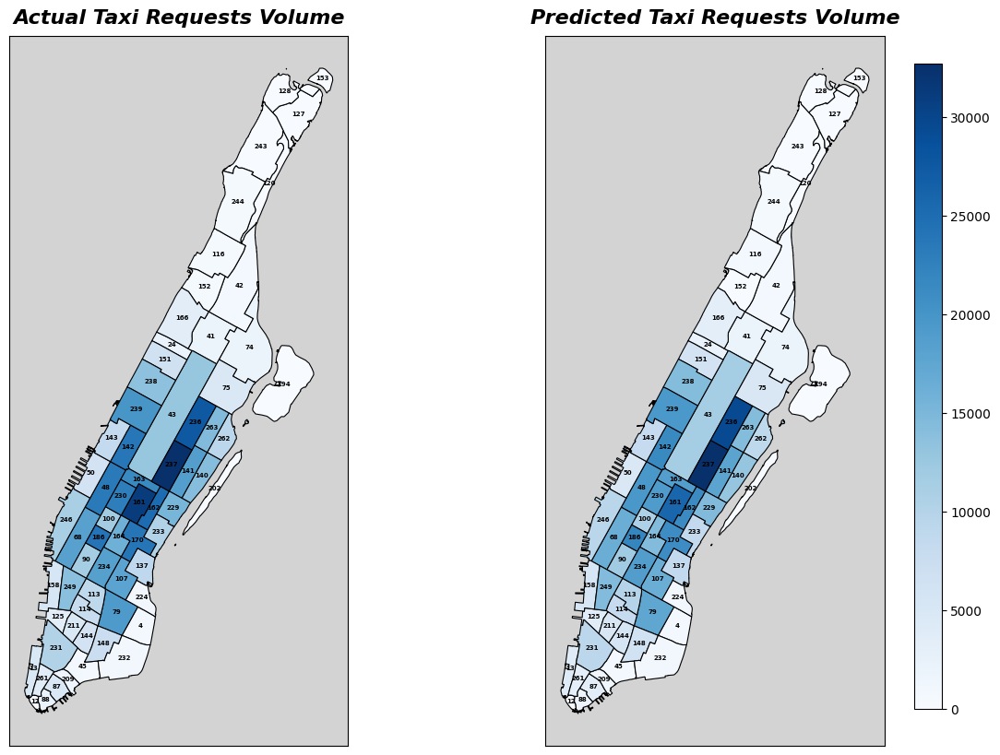

In [82]:
# Create a figure with two subplots side by side
fig, axs = plt.subplots(1, 2, figsize=(15, 10), gridspec_kw={'wspace': 0.0})

# Create choropleth maps for actual and predicted taxi requests volume
create_choropleth(test1, axs[0], 'Actual Taxi Requests Volume')
create_choropleth(test_pred1, axs[1], 'Predicted Taxi Requests Volume')

# Add a colorbar to the figure
cax = fig.add_axes([0.85, 0.15, 0.02, 0.7])
sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(
    vmin=min(test1.filter(regex='LID_').sum().min(), test_pred1.filter(regex='LID_').sum().min()), 
    vmax=max(test1.filter(regex='LID_').sum().max(), test_pred1.filter(regex='LID_').sum().max())
))
fig.colorbar(sm, cax=cax)

plt.savefig('D:/UNI/Term 9/Project/Data/Figs/choropleth_combined.png', dpi=300)
plt.savefig('D:/UNI/Term 9/Project/Data/Figs/choropleth_combined.jpg', dpi=300)
plt.show()


-------------------------------------------------------------------------------------------------

### *As expected, the accuracy of the model is much better in the regions where the number of requests is higher.*

## <span style="color:green;">7. conclusion</span>

### *According to all the available data and results, it can be said that the model is accurate. However, it is possible to increase the accuracy of the model in low demand areas by increasing the amount of data or their time intervals.*

### *Also, to increase the accuracy of the model in general, data such as traffic and the amount of taxi drop-offs in each area can be used as effective features.*

# END ^^